In [3]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn import metrics
import matplotlib.pyplot as plt
#from alepython import ale_plot
from sklearn.preprocessing import MaxAbsScaler
from sklearn.linear_model import SGDClassifier
import shap
from sklearn.metrics import accuracy_score
import pickle

## From general to specific datasets

In [16]:
data_df = pd.read_csv('./data/DigitalDataEnriched_updated_corrected.csv')

In [17]:
cardiac_filtered = data_df[['CardiacLim','DiffPercentPeakVO2','DiffPeakVO2','75_to_100_VO2Slope', '75_to_100_HRSlope','PeakVE',
'MinO2Pulse','VO2vsPeakVO2atVT','75_to_100_VCO2Slope','O2PulseDiff','MeanVE','50_to_75_O2Slope',
'75_to_100_VESlope','O2PulsePercent','MeanVCO2','75_to_100_RERSlope','MeanRER','PeakVO2Real',
'50_to_75_VO2Slope','75_to_100_O2Slope','25_to_50_VESlope','15_to_85_VESlope','MeanVO2',
'DiffPeakRER','25_to_50_VCO2Slope']]

In [25]:
cardiac_filtered.head()

,CardiacLim,DiffPercentPeakVO2,DiffPeakVO2,75_to_100_VO2Slope,75_to_100_HRSlope,PeakVE,MinO2Pulse,VO2vsPeakVO2atVT,75_to_100_VCO2Slope,O2PulseDiff,...,75_to_100_RERSlope,MeanRER,PeakVO2Real,50_to_75_VO2Slope,75_to_100_O2Slope,25_to_50_VESlope,15_to_85_VESlope,MeanVO2,DiffPeakRER,25_to_50_VCO2Slope
0,1,0.747717,-0.585175,0.123423,7.023810,46.294189,0.001595,0.711017,0.216409,0.001734,...,0.063604,0.829255,1.734347,0.131972,0.315476,0.838607,2.228140,0.832255,-38.0,0.047844
1,1,0.576940,-1.124159,0.075090,7.714286,61.526432,0.002689,0.521092,0.180712,-0.003494,...,0.072860,0.885379,1.533051,0.132594,0.013003,1.694753,3.063221,0.906075,-1.7,0.074858
2,0,2.230652,1.777777,-0.685285,-17.842424,105.610733,0.003122,2.031748,-0.656155,0.005812,...,0.169690,1.030310,3.222358,0.155812,-2.949112,3.275643,6.160680,1.806712,4.2,0.152746
3,0,1.889415,2.040160,-0.992913,-21.963636,163.989670,0.002638,1.570189,-0.988564,0.006392,...,0.117084,1.071147,4.333981,0.266070,-4.349607,5.976927,9.577343,2.347624,-0.1,0.223412
4,0,1.620847,1.200425,-0.939192,-32.571429,109.728046,0.002797,1.394202,-1.025710,0.006370,...,0.135160,1.105520,3.133955,0.192902,-4.033647,4.607908,9.513882,1.806214,-5.5,0.157792


In [26]:
cardiac_filtered.to_csv('./data/CardiacData.csv', index = True)

In [43]:
pulmonary_filtered = data_df[['PulmonaryLim','O2PulsePercent','O2PulseDiff','LowestVE/VCO2', 'VEvsVCO2Slope','PeakRR',
'MeanO2Pulse','15_to_85_RRSlope','50_to_75_RRSlope','MaxO2Pulse','DiffPercentPeakVO2']]

In [44]:
pulmonary_filtered.to_csv('./data/PulmonaryData.csv', index = True)

In [56]:
other_filtered = data_df[['MuscleSkeletalLim','PeakRR','PeakVE','PeakVCO2', 'MeanVCO2','LowestVE/VCO2',
'PeakVO2','PeakVO2Real','VO2vsPeakVO2atVT','MeanRR','75_to_100_VEVCO2Slope','MeanRER','MeanVE','DiffPercentPeakVO2',
'PeakRER','DiffPeakVO2','VO2atVT','0_to_25_O2Slope','MeanVO2','StdVE/VCO2','75_to_100_VO2Slope','75_to_100_VCO2Slope',
'DiffPeakRER','75_to_100_RRSlope','0_to_25_RERSlope']]

In [57]:
other_filtered.to_csv('./data/OtherLimData.csv', index = True)

## Defining functions

In [44]:
def evaluate_model(classifier, X, y, scaler, train_size=0.8, total_samples=100, smote=False, best_model=False):
    """
    if smote is True:
        oversample = SMOTE()
        X, y = oversample.fit_resample(X, y)
    """
    oversample = SMOTE()
    scaler.fit(X)
    X_scaled = scaler.transform(X)
    auc_vals = np.array([])
    acc_vals = np.array([])
    specificity_vals = np.array([])
    sensitivity_vals = np.array([])
    ppv_vals = np.array([])
    model_list = []
    proba_vals = []
    test_vals = []
    fpr_vals = []
    tpr_vals = []
    for i in range(1,total_samples):
        X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=train_size)
        if smote is True:
            X_train, y_train = oversample.fit_resample(X_train, y_train)
        clf = classifier
        model = clf.fit(X_train,y_train)
        model_list.append(model)
        y_hat = model.predict_proba(X_test)
        proba_vals.append(y_hat[:,1])
        test_vals.append(y_test)
        if np.sum(np.round(y_hat[:,1])) == 0:
            continue
        fpr, tpr, thresholds = metrics.roc_curve(y_test, y_hat[:,1])
        tn, fp, fn, tp = confusion_matrix(y_test,np.round(y_hat[:,1])).ravel()
        specificity = tn / (tn+fp)
        sensitivity = tp / (tp+fn)
        ppv = tp/(tp+fp)
        auc_vals = np.append(metrics.auc(fpr, tpr),auc_vals)
        acc_vals = np.append(accuracy_score(y_test, np.round(y_hat[:,1])),acc_vals)
        specificity_vals = np.append(specificity,specificity_vals)
        sensitivity_vals = np.append(sensitivity,sensitivity_vals)
        ppv_vals = np.append(ppv,ppv_vals)
        fpr_vals.append(fpr)
        tpr_vals.append(tpr)
        pass
    print('AUC: {:.3f} +- {:.3f}'.format(np.mean(auc_vals), np.std(auc_vals)))
    print('Sensitivity: {:.3f} +- {:.3f}'.format(np.mean(sensitivity_vals), np.std(sensitivity_vals)))
    print('Specificity: {:.3f} +- {:.3f}'.format(np.mean(specificity_vals), np.std(specificity_vals)))
    print('Positive Predictive Values: {:.3f} +- {:.3f}'.format(np.mean(ppv_vals), np.std(ppv_vals)))
    print('Accuracy: {:.3f} +- {:.3f}'.format(np.mean(acc_vals), np.std(acc_vals)))
    if best_model is True:
        best_vals = ppv_vals*1.25 + sensitivity_vals
        max_ppv_index = np.argmax(best_vals)
        print(max_ppv_index)
        print('The highest ppv model has the following:')
        print('AUC: {:.3f}'.format(auc_vals[max_ppv_index]))
        print('Sensitivity: {:.3f}'.format(sensitivity_vals[max_ppv_index]))
        print('Specificity: {:.3f}'.format(specificity_vals[max_ppv_index]))
        print('Positive Predictive Values: {:.3f}'.format(ppv_vals[max_ppv_index]))
        print('Accuracy: {:.3f}'.format(acc_vals[max_ppv_index]))
        
        return model_list[max_ppv_index],proba_vals,test_vals,fpr_vals[max_ppv_index],tpr_vals[max_ppv_index]
    pass

In [7]:
def interpret_model(model, data_df, features,label):
    modelLimitation = model.fit(data_df[features],data_df[label])
    explainer = shap.TreeExplainer(modelLimitation, data=data_df[features])
    shap_values = explainer.shap_values(data_df[features])
    shap.summary_plot(shap_values[1], data_df[features], plot_type='dot', max_display=data_df.shape[1])
    pass

In [8]:
def explain_model(model, df_data, features, ravel=False):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(df_data[features])
    if ravel is True:
        for feature in features:
            shap.dependence_plot(feature, shap_values[1], df_data[features], show=False, interaction_index=None)
    else:
        fig, axes = plt.subplots(nrows=int(np.ceil(len(features)/4)), ncols=4, figsize=(20, 14))
        axes = axes.ravel()
        for i, col in enumerate(features):
            shap.dependence_plot(col, shap_values[1], df_data[features], ax=axes[i], show=False, interaction_index=None)

In [9]:
def save_model(model, name):
    filename = name + '.sav'
    pickle.dump(model, open(filename,'wb'))

## Cardiac Limitation

### Loading the data

In [20]:
cardiac_data_df = pd.read_csv('./data/CardiacData.csv')
cardiac_top_features=cardiac_data_df.columns[1:].values

In [45]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean=False, with_std=False)
clf_selected = RandomForestClassifier(bootstrap=True, criterion="entropy",max_features=0.1,min_samples_leaf=0.01,
                            min_samples_split=0.01,n_estimators=400,oob_score=True)
clf_cardiac, proba_cardiac, y_test_cardiac, fpr_car, tpr_car = evaluate_model(clf_selected,X, y, scaler_test, total_samples=200, train_size=0.7, smote=True,best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.889 +- 0.037
Sensitivity: 0.755 +- 0.115
Specificity: 0.864 +- 0.050
Positive Predictive Values: 0.643 +- 0.103
Accuracy: 0.836 +- 0.042
18
The highest ppv model has the following:
AUC: 0.978
Sensitivity: 0.938
Specificity: 0.960
Positive Predictive Values: 0.882
Accuracy: 0.955


 97%|=================== | 425/438 [00:13<00:00]       

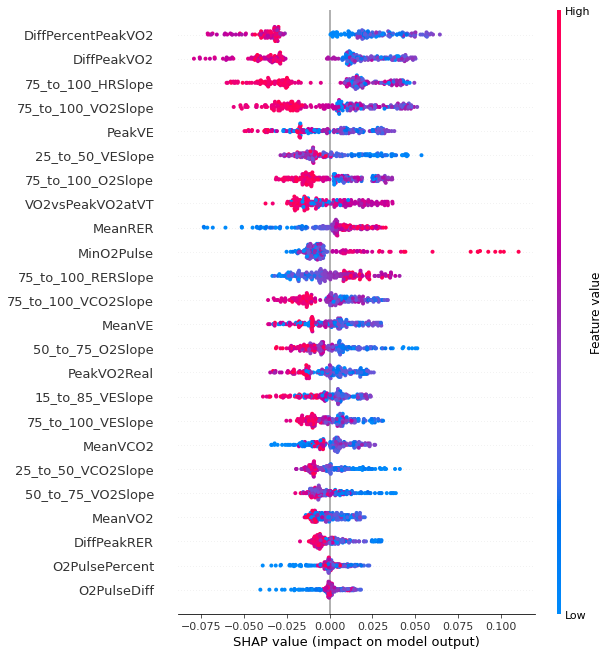

In [52]:
interpret_model(clf_cardiac, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [53]:
cardiac_data_df_filt = cardiac_data_df.loc[cardiac_data_df.O2PulsePercent <=4].loc[cardiac_data_df['75_to_100_HRSlope'] <=4]

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


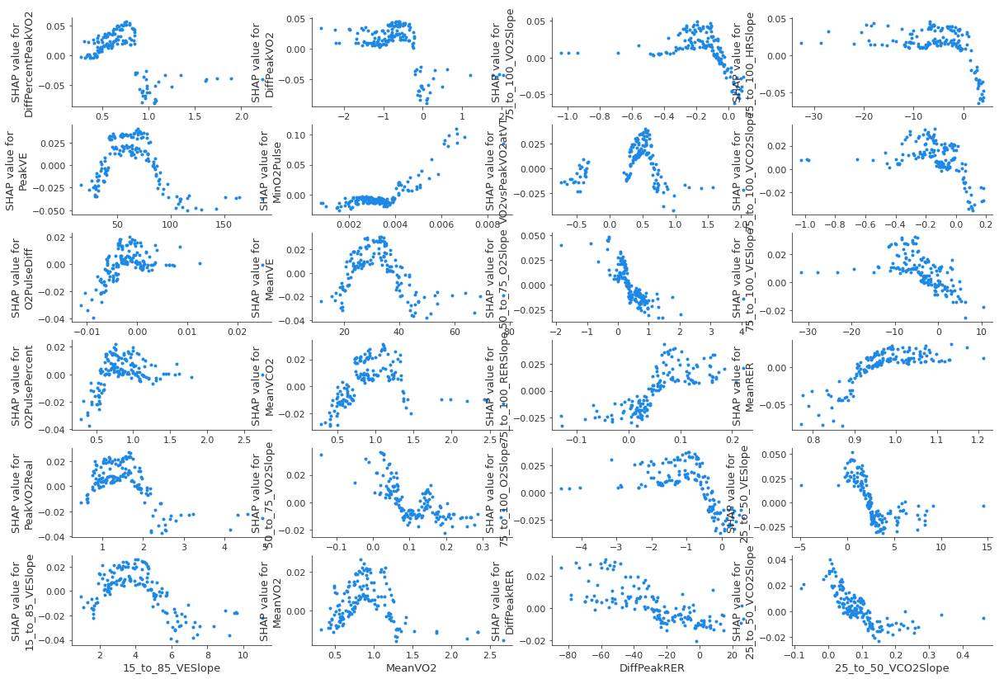

In [54]:
explain_model(clf_cardiac, cardiac_data_df_filt,cardiac_top_features)

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


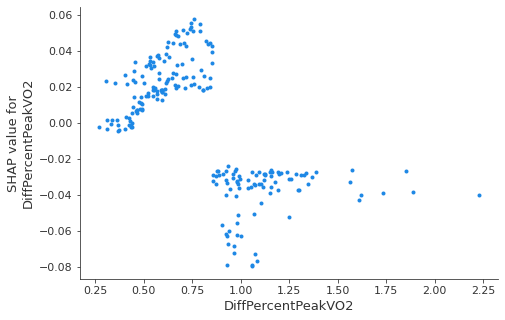

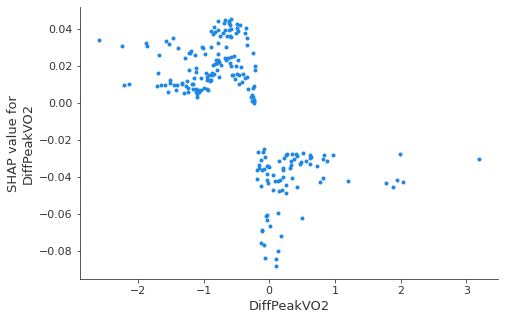

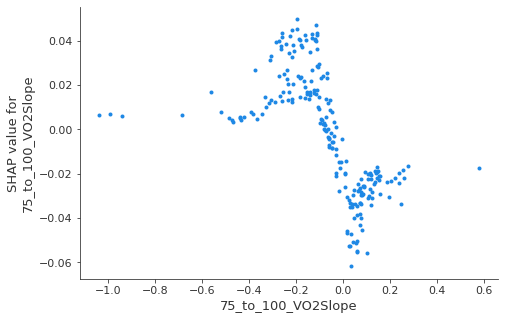

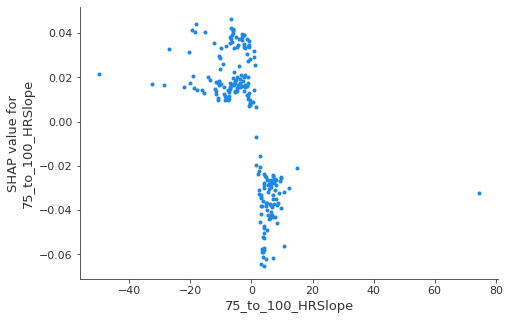

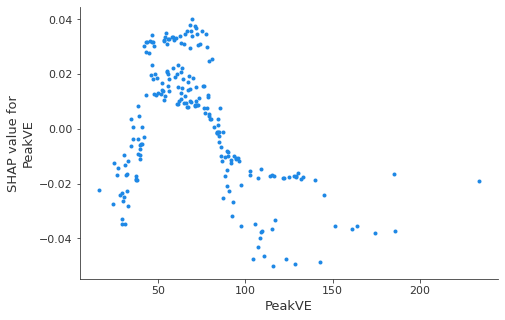

...

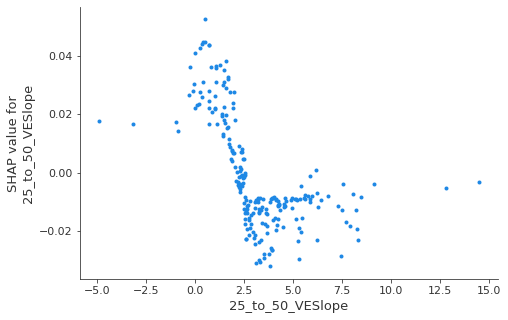

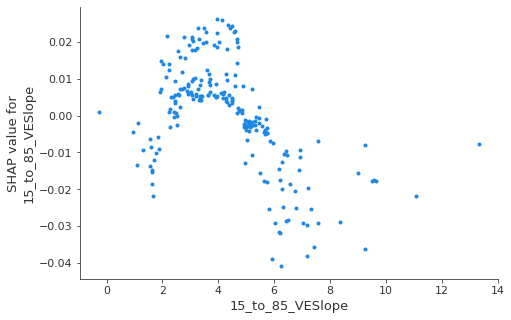

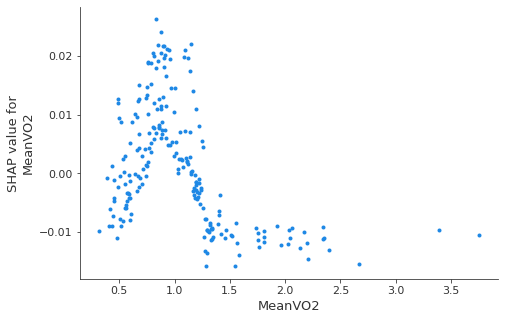

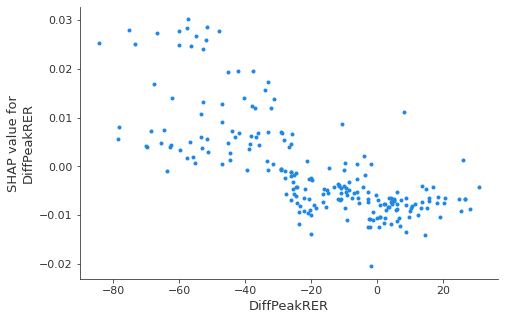

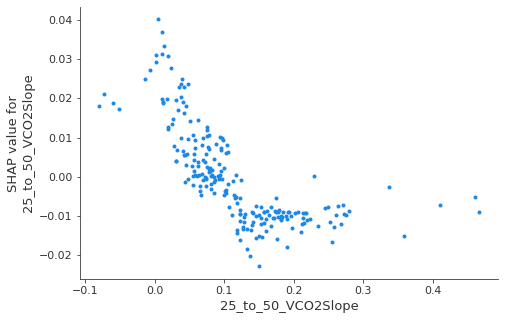

In [55]:
explain_model(clf_cardiac, cardiac_data_df,cardiac_top_features, ravel=True)

In [48]:
print(proba_cardiac[18])
print(y_test_cardiac[18])

[7.42556006e-01 3.90240079e-01 3.00035714e-01 5.36819986e-02
 6.47837302e-01 8.33333333e-04 6.57270112e-01 4.06292118e-01
 9.84444444e-02 7.51774267e-02 7.41817190e-01 3.36191198e-01
 3.07336851e-01 1.97649920e-01 4.22811688e-01 5.34938041e-01
 6.76338294e-01 6.72023810e-03 3.56373557e-01 1.04285714e-02
 6.24494589e-01 5.23688492e-01 4.52053571e-01 2.80638889e-01
 1.60833333e-02 3.54242334e-01 6.27005952e-01 6.55638889e-01
 7.25707071e-01 2.23656385e-01 2.34296176e-01 3.70980735e-01
 3.46017857e-01 8.32738095e-03 3.56932304e-01 8.04892247e-01
 5.59817460e-01 1.38562500e-01 7.35704712e-02 7.61537698e-02
 1.95791396e-01 2.63333333e-02 5.80535714e-02 3.70565476e-02
 6.21428571e-03 3.09256944e-01 1.71964286e-02 3.73689935e-01
 5.70613907e-01 6.83425595e-01 4.93390873e-01 1.33815115e-01
 2.31258929e-01 3.58964952e-01 4.24728175e-01 4.16666667e-04
 3.10536346e-01 1.94088405e-01 1.71371934e-01 1.31028139e-02
 2.47978896e-01 7.32494048e-01 0.00000000e+00 4.75509380e-01
 3.97512175e-01 4.480054

In [129]:
save_model(clf_cardiac, 'cardiac_model')

## Pulmonary Limitation

In [67]:
df_filtered_pulm = pd.read_csv('./data/PulmonaryData.csv')
pulm_columns=df_filtered_pulm.columns[1:].values

In [68]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
#scaler_pulm = Normalizer(norm='max')
#clf_pulm = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="entropy",max_features='sqrt',min_samples_leaf=0.2163157894736842,
#                            min_samples_split= 0.5252631578947369,n_estimators=600,oob_score=False)
scaler_pulm = StandardScaler( with_mean=False, with_std=False)
clf_pulm = RandomForestClassifier(bootstrap=True,  criterion="entropy",max_features=0.1,min_samples_leaf=0.01,
                            min_samples_split= 0.01,n_estimators=50,oob_score=False)
puml_model, proba_pulm, y_test_pulm, fpr_plm, tpr_plm = evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=300, train_size=0.7, smote=True, best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.803 +- 0.072
Sensitivity: 0.510 +- 0.184
Specificity: 0.848 +- 0.052
Positive Predictive Values: 0.315 +- 0.128
Accuracy: 0.807 +- 0.046
221
The highest ppv model has the following:
AUC: 0.890
Sensitivity: 0.750
Specificity: 0.926
Positive Predictive Values: 0.692
Accuracy: 0.894


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


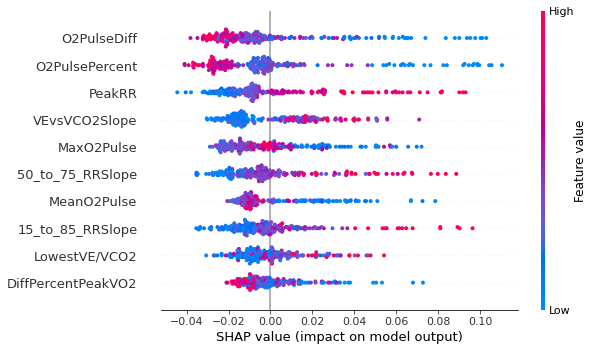

In [76]:
interpret_model(clf_pulm, df_filtered_pulm,pulm_columns,'PulmonaryLim')

In [77]:
df_filtered_pulm_filt = df_filtered_pulm.loc[df_filtered_pulm['O2PulsePercent']<=4]#.loc[df_filtered_pulm['MeanVE/VCO2']<100]

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


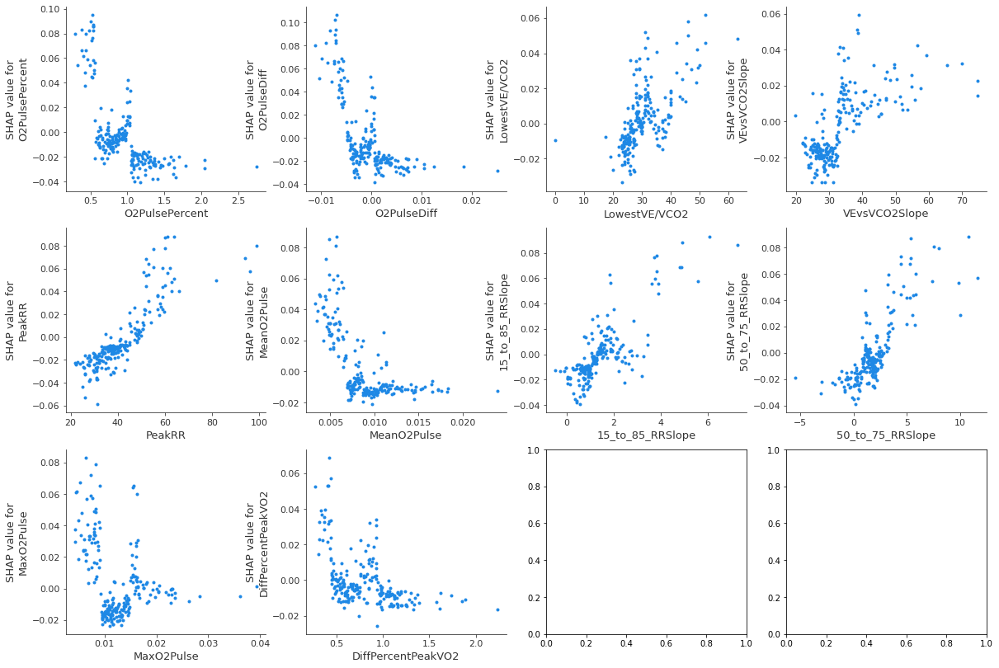

In [78]:
explain_model(clf_pulm, df_filtered_pulm_filt,pulm_columns)

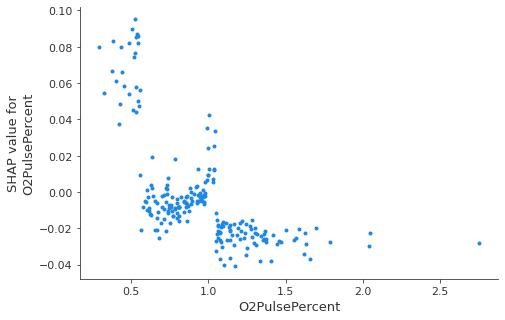

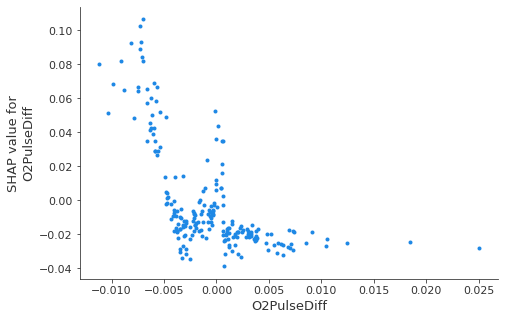

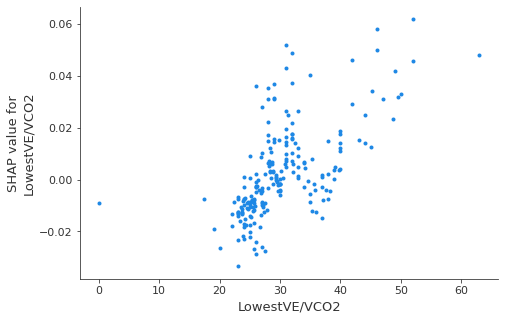

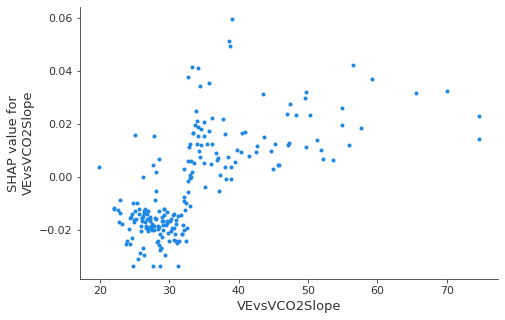

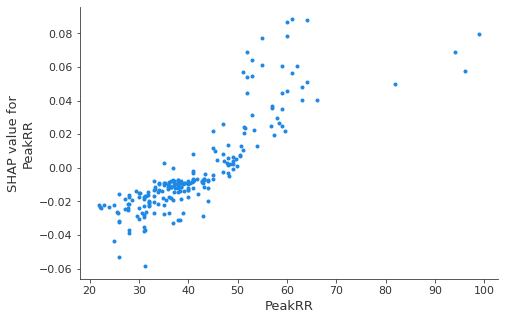

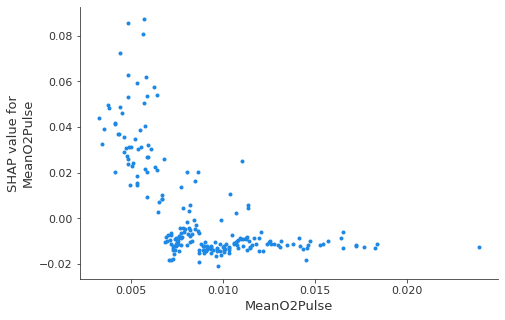

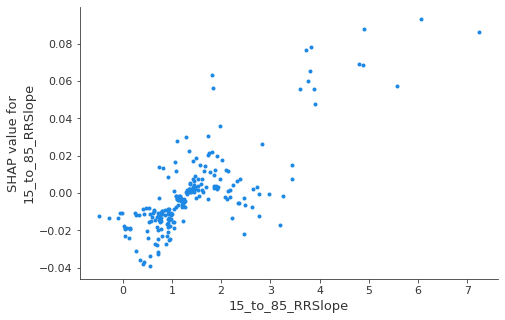

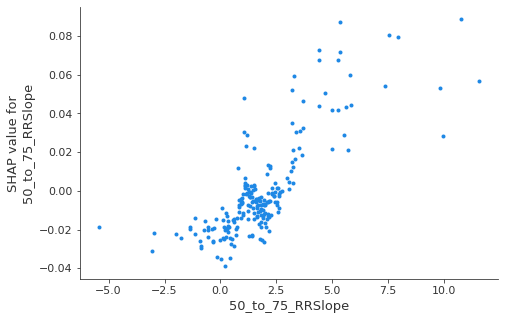

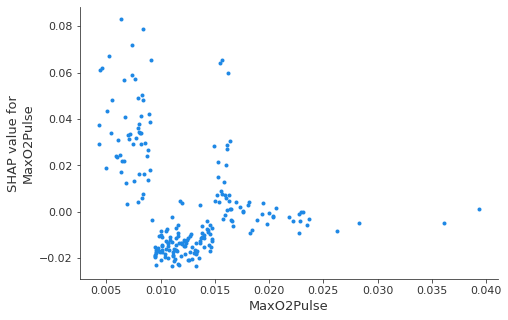

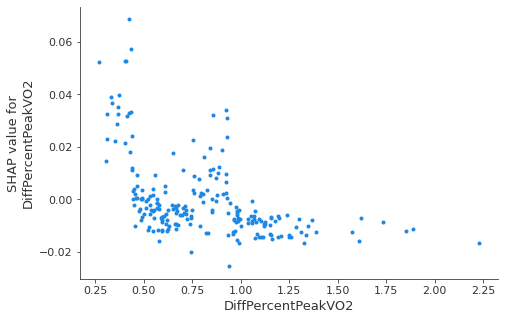

In [79]:
explain_model(clf_pulm, df_filtered_pulm_filt,pulm_columns, ravel=True)

In [130]:
save_model(clf_pulm, 'pulmonary_model')

## Other limitations

In [93]:
other_data_df = pd.read_csv('./data/OtherLimData.csv')
other_columns = other_data_df.columns[1:]

In [94]:
X_other, y_other = other_data_df[other_columns].values, other_data_df['OtherLim'].values
scaler_other = Normalizer(norm='l1')
clf_other = RandomForestClassifier(bootstrap=False,class_weight='balanced', criterion="gini",max_features='log2',
                                  min_samples_leaf=0.035789473684210524, min_samples_split= 0.29105263157894734,
                                  n_estimators=400,oob_score=False)
other_model, proba_others, y_test_others, fpr_oth, tpr_oth  = evaluate_model(clf_other,X_other, y_other, scaler_other, total_samples=200, train_size=0.7, smote=True, best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.839 +- 0.054
Sensitivity: 0.687 +- 0.136
Specificity: 0.807 +- 0.060
Positive Predictive Values: 0.485 +- 0.098
Accuracy: 0.781 +- 0.048
187
The highest ppv model has the following:
AUC: 0.944
Sensitivity: 1.000
Specificity: 0.865
Positive Predictive Values: 0.667
Accuracy: 0.894


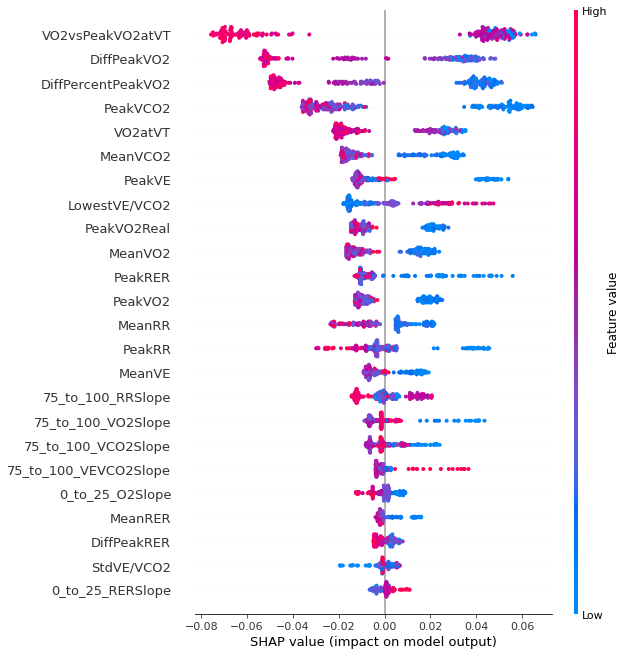

In [95]:
interpret_model(other_model, other_data_df,other_columns,'OtherLim')

In [96]:
other_data_df_filt = other_data_df.loc[other_data_df['StdVE/VCO2']<=100]

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


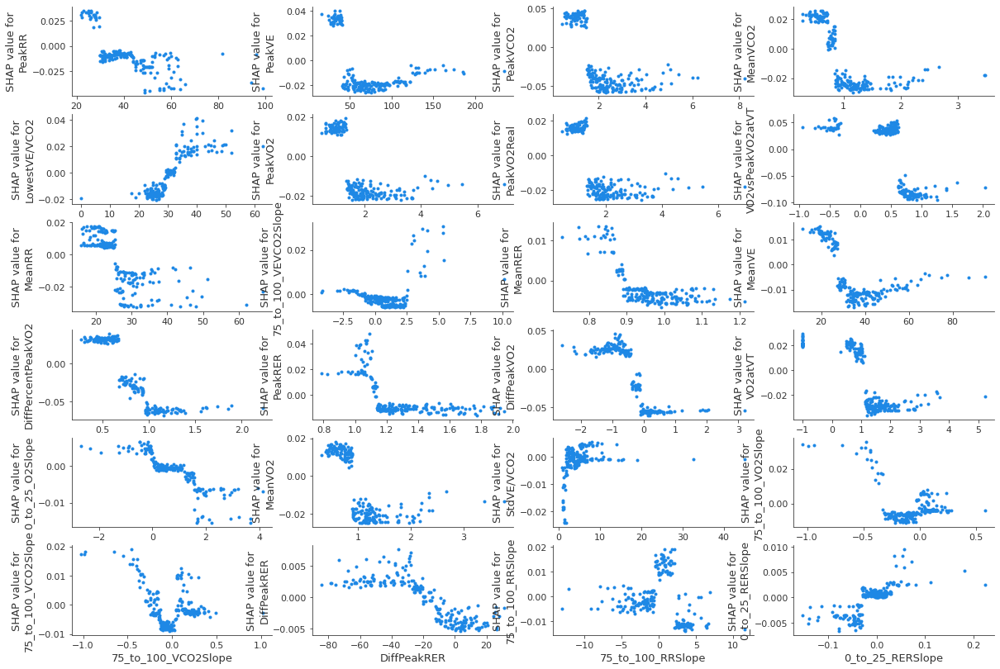

In [97]:
explain_model(other_model, other_data_df_filt,other_columns)

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


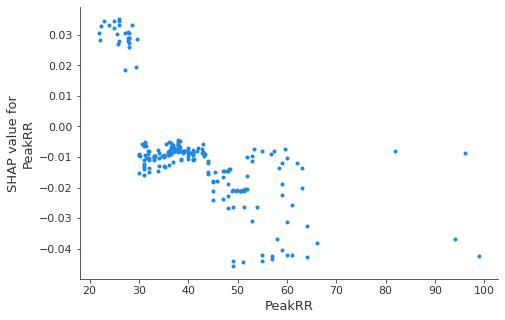

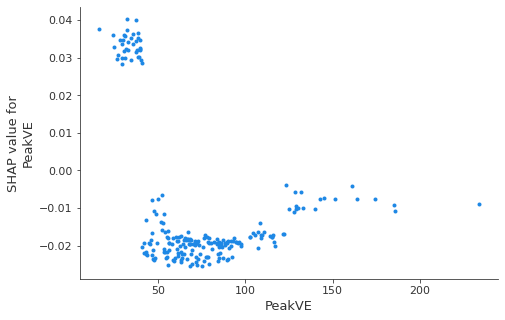

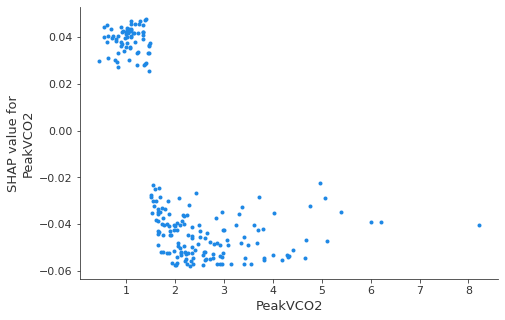

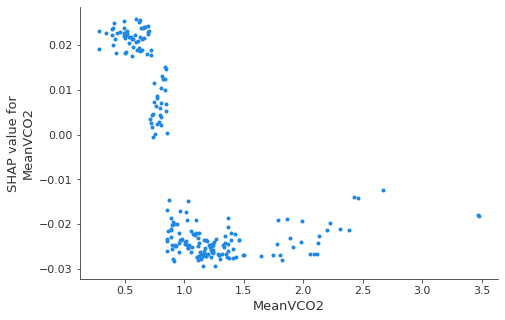

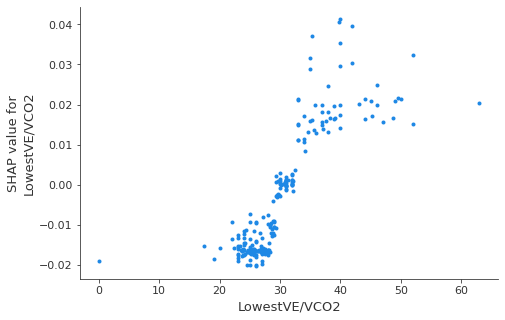

...

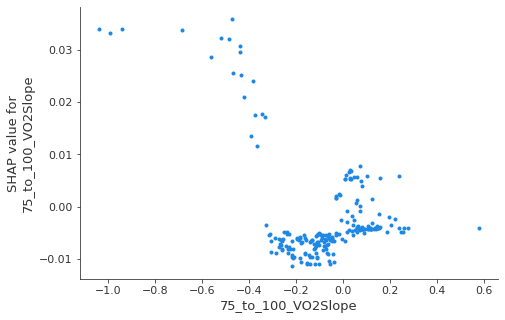

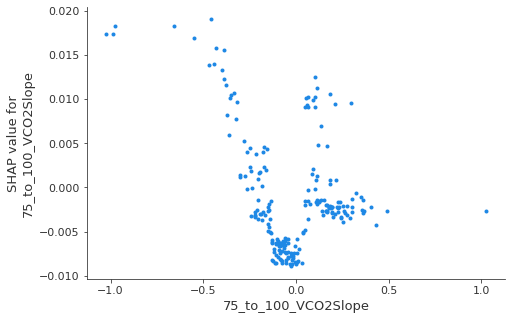

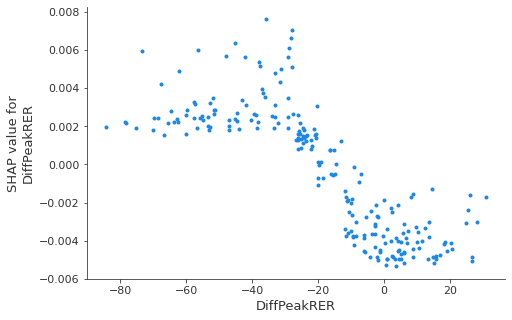

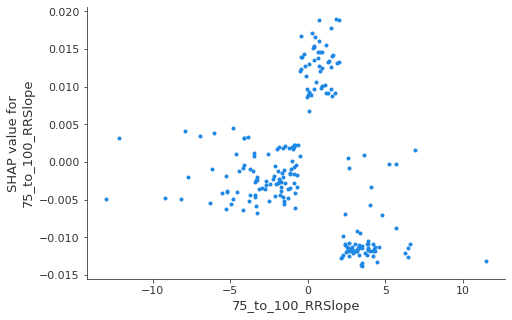

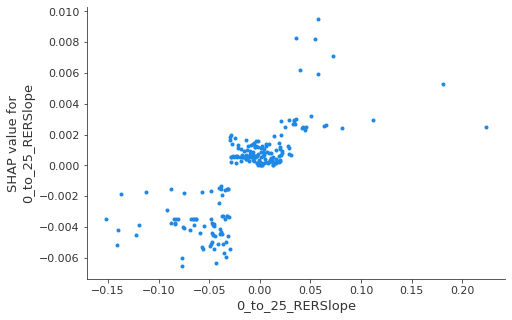

In [98]:
explain_model(other_model, other_data_df_filt,other_columns,ravel=True)

In [131]:
save_model(other_model, 'other_model')

## Generating AUC for all

In [ ]:
fpr, tpr, thresholds = metrics.roc_curve(y_test_cardiac[18], proba_cardiac[18])
plt.plot(fpr, tpr)

In [126]:
results = []
i = 0
for y, scores in zip(y_test_others, proba_others):
    i+=1
    fpr, tpr, thresholds_car = metrics.roc_curve(y, scores)
    results.append(np.round(metrics.auc(fpr, tpr),3))
    if np.round(metrics.auc(fpr, tpr),3)==0.944:
        print('***************')
        print(i)
    print(np.round(metrics.auc(fpr, tpr),3))
print(np.argmax(np.array(results)))

0.898
0.898
0.882
0.824
0.878
0.706
0.888
0.868
0.835
0.832
0.816
***************
12
0.944
0.821
0.818
0.884
0.866
0.799
0.799
0.754
0.964
0.881
0.854
0.861
0.811
0.784
0.892
0.819
0.903
0.878
0.886
0.934
0.879
0.83
0.833
0.87
0.849
0.838
0.821
0.838
0.779
0.916
0.846
0.878
0.891
0.797
0.802
0.794
0.866
0.793
0.844
0.798
0.853
0.78
0.845
0.957
0.909
0.834
0.794
0.761
0.744
0.872
0.916
0.823
0.813
0.927
0.844
0.768
0.862
0.78
0.77
0.735
0.824
0.843
0.854
0.929
0.861
0.909
0.813
0.848
0.895
0.839
0.787
0.825
0.815
0.903
0.912
0.903
0.835
0.758
0.905
0.901
0.891
0.896
0.882
0.766
0.875
0.778
0.856
0.727
0.748
0.821
0.841
0.811
0.807
0.861
0.764
0.868
0.852
0.787
0.761
0.916
0.783
0.801
0.878
0.834
0.853
0.907
0.879
0.865
0.809
0.722
0.866
0.866
0.91
0.834
0.841
0.982
0.864
0.842
0.75
0.815
0.881
0.813
0.821
0.763
0.838
0.81
0.901
0.775
0.873
0.799
0.847
0.814
0.714
0.821
0.88
0.907
0.809
0.738
0.859
0.736
0.734
0.809
0.86
0.822
0.786
0.907
0.865
0.77
0.86
0.829
0.755
0.784
0.904
0.851
0.7

In [127]:
fpr_car, tpr_car, thresholds_car = metrics.roc_curve(y_test_cardiac[180], proba_cardiac[180])
fpr_plm, tpr_plm, thresholds_plm = metrics.roc_curve(y_test_pulm[77], proba_pulm[77])
fpr_oth, tpr_oth, thresholds_plm = metrics.roc_curve(y_test_others[11], proba_others[11])
#proba_others, y_test_others

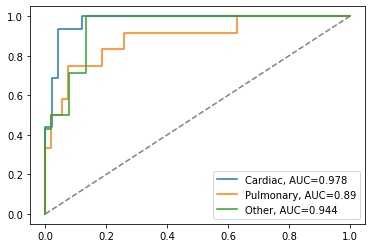

In [128]:

plt.plot(fpr_car,tpr_car,label=f"Cardiac, AUC={np.round(metrics.auc(fpr_car, tpr_car),3)}")
plt.plot(fpr_plm,tpr_plm,label=f"Pulmonary, AUC={np.round(metrics.auc(fpr_plm, tpr_plm),3)}")
plt.plot(fpr_oth,tpr_oth,label=f"Other, AUC={np.round(metrics.auc(fpr_oth, tpr_oth),3)}")
plt.plot([0,1], [0,1], color='grey', linestyle='--')
plt.legend(loc=4)
plt.show()

0.8522875816993464


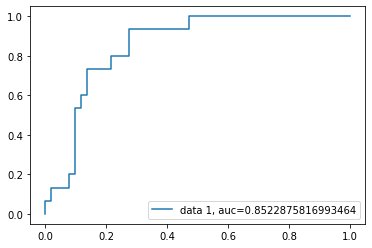

In [162]:

import matplotlib.pyplot as plt

y_test = y_test_cardiac# ground truth labels
y_pred_proba = proba_cardiac
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_proba)
print(metrics.auc(fpr_car, tpr_car))
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Generating report for Joao's model

In [50]:
all_data_df = pd.read_csv('./data/DigitalDataEnriched_updated.csv')

In [51]:
all_data_df.shape

(219, 100)

In [64]:
all_data_df['OtherLim'] = all_data_df.MuscleSkeletalLim

In [71]:
all_data_df['CardiacLimProba']=clf_cardiac.predict_proba(all_data_df[cardiac_top_features])[:,1]
all_data_df['PulmonaryLimBalancedProba']=clf_pulm.predict_proba(all_data_df[pulm_columns])[:,1]
all_data_df['MuscleSkeletalLimUnBalancedProba']=other_model.predict_proba(all_data_df[other_columns])[:,1]

In [77]:
all_data_df['Condition']='Patient'

In [81]:
result_data = all_data_df[['SessionId','PatientId','CardiacLim','CardiacLimProba','PulmonaryLim','PulmonaryLimBalancedProba',
                         'MuscleSkeletalLim','MuscleSkeletalLimUnBalancedProba','Condition']]

In [82]:
result_data.to_csv('ResultTable.csv',index=True)

In [89]:
other_columns

Index(['PeakRR', 'PeakVE', 'PeakVCO2', 'VO2atVT', 'VO2vsPeakVO2atVT',
       'MeanVCO2', 'LowestVE/VCO2', 'PeakRER', '75_to_100_VEVCO2Slope',
       'PeakVO2', 'PeakVO2Real', 'MeanVE', 'DiffPercentPeakVO2', 'MeanRR',
       'MeanVE/VCO2', 'DiffPeakVO2', 'MeanRER', 'MeanVO2',
       '25_to_50_VEVO2Slope', '15_to_85_VO2Slope'],
      dtype='object')

In [67]:
clf_cardiac.predict_proba(all_data_df[cardiac_top_features])[:,1]

array([1.33160714e-01, 5.11044643e-01, 7.29701479e-02, 5.50238095e-02,
       8.75606061e-02, 6.36636003e-02, 2.07142857e-03, 8.04166667e-03,
       6.34851190e-02, 4.79166667e-03, 6.53869048e-03, 7.41666667e-03,
       3.34523810e-02, 9.19732143e-02, 2.05357143e-03, 1.54166667e-02,
       2.18750000e-03, 6.25000000e-04, 5.07043651e-02, 5.93779762e-02,
       5.05357143e-03, 9.84523810e-03, 3.20565476e-02, 1.14642857e-02,
       7.53968254e-03, 2.08670635e-02, 4.93452381e-03, 2.41994048e-02,
       1.25000000e-03, 5.79166667e-03, 3.50000000e-03, 1.03125000e-02,
       6.53571429e-03, 8.32457792e-01, 8.90136905e-01, 8.40090278e-01,
       7.68151245e-01, 8.31633929e-01, 7.07571429e-01, 8.79960317e-01,
       9.07523810e-01, 8.22206349e-01, 7.45412157e-01, 7.59933532e-01,
       4.15855610e-01, 7.50828373e-01, 8.54138889e-01, 6.80378892e-01,
       8.58382937e-02, 1.52500000e-02, 1.66825397e-02, 4.46642406e-01,
       1.05330447e-01, 1.49464286e-02, 2.22678571e-02, 2.45386905e-02,
      

## Short experiment

In [136]:
short_cardiac_data_df = pd.read_csv('./data/short_cardiac_data.csv')
short_cardiac_top_features=short_cardiac_data_df.columns[1:].values
X, y = short_cardiac_data_df[short_cardiac_top_features].values, short_cardiac_data_df['CardiacLim'].values
short_scaler_test = StandardScaler(with_mean=False, with_std=False)
short_clf_selected = RandomForestClassifier(bootstrap=True, criterion="entropy",max_features=0.1,min_samples_leaf=0.01,
                            min_samples_split=0.01,n_estimators=400,oob_score=True)
sclf_cardiac, sproba_cardiac, sy_test_cardiac, sfpr_car, stpr_car = evaluate_model(short_clf_selected,X, y, short_scaler_test, total_samples=200, train_size=0.7, smote=True,best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.788 +- 0.046
Sensitivity: 0.598 +- 0.136
Specificity: 0.761 +- 0.067
Positive Predictive Values: 0.440 +- 0.103
Accuracy: 0.720 +- 0.047
139
The highest ppv model has the following:
AUC: 0.926
Sensitivity: 1.000
Specificity: 0.766
Positive Predictive Values: 0.633
Accuracy: 0.833


 94%|=================== | 412/438 [00:16<00:01]       

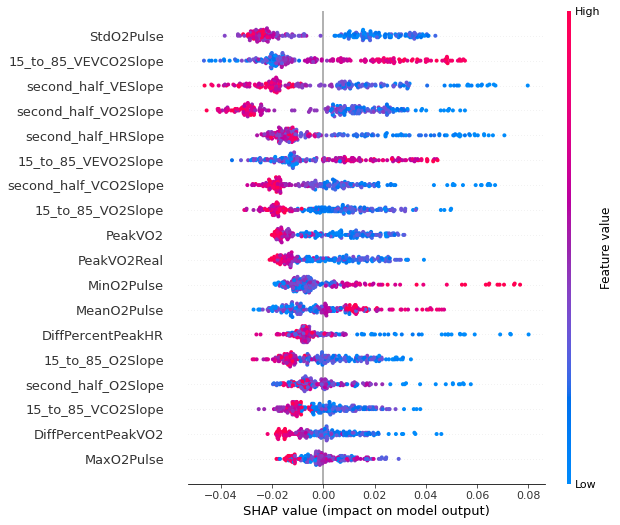

In [152]:
interpret_model(sclf_cardiac, short_cardiac_data_df,short_cardiac_top_features,'CardiacLim')

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


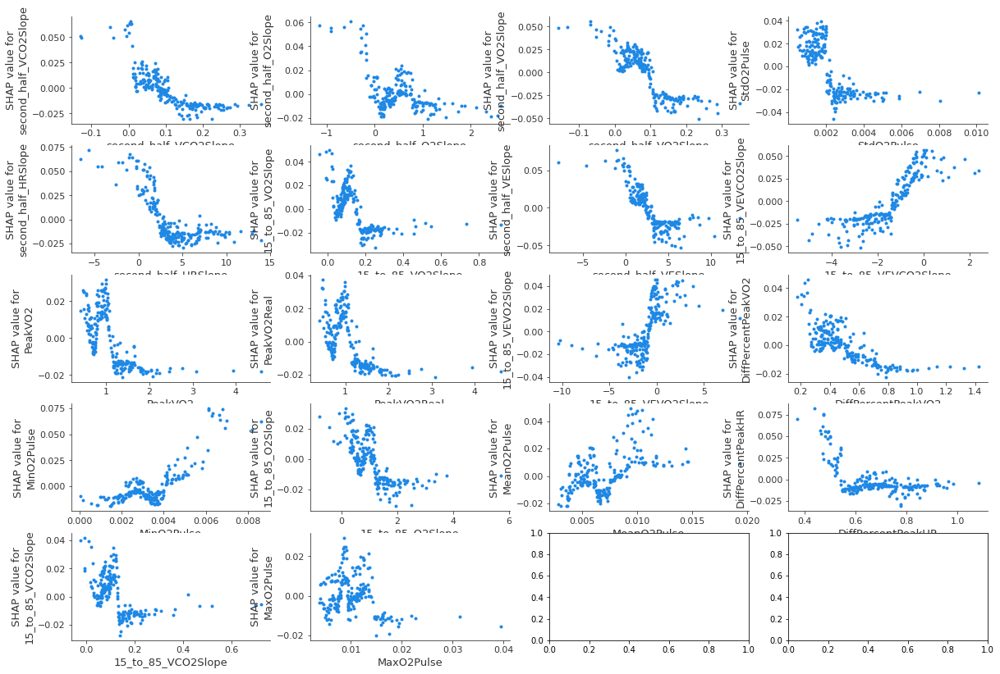

In [153]:
explain_model(sclf_cardiac, short_cardiac_data_df,short_cardiac_top_features)

In [137]:
short_df_filtered_pulm = pd.read_csv('./data/short_pulmonary_data.csv')
short_pulm_columns=short_df_filtered_pulm.columns[1:].values
X_pulm, y_pulm = short_df_filtered_pulm[short_pulm_columns].values, short_df_filtered_pulm['PulmonaryLim'].values
#scaler_pulm = Normalizer(norm='max')
#clf_pulm = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="entropy",max_features='sqrt',min_samples_leaf=0.2163157894736842,
#                            min_samples_split= 0.5252631578947369,n_estimators=600,oob_score=False)
s_scaler_pulm = StandardScaler( with_mean=False, with_std=False)
s_clf_pulm = RandomForestClassifier(bootstrap=True,  criterion="entropy",max_features=0.1,min_samples_leaf=0.01,
                            min_samples_split= 0.01,n_estimators=50,oob_score=False)
spuml_model, sproba_pulm, sy_test_pulm, sfpr_plm, stpr_plm = evaluate_model(s_clf_pulm,X_pulm, y_pulm, s_scaler_pulm, total_samples=300, train_size=0.7, smote=True, best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.807 +- 0.059
Sensitivity: 0.473 +- 0.167
Specificity: 0.848 +- 0.057
Positive Predictive Values: 0.309 +- 0.130
Accuracy: 0.801 +- 0.045
255
The highest ppv model has the following:
AUC: 0.885
Sensitivity: 0.667
Specificity: 0.947
Positive Predictive Values: 0.667
Accuracy: 0.909


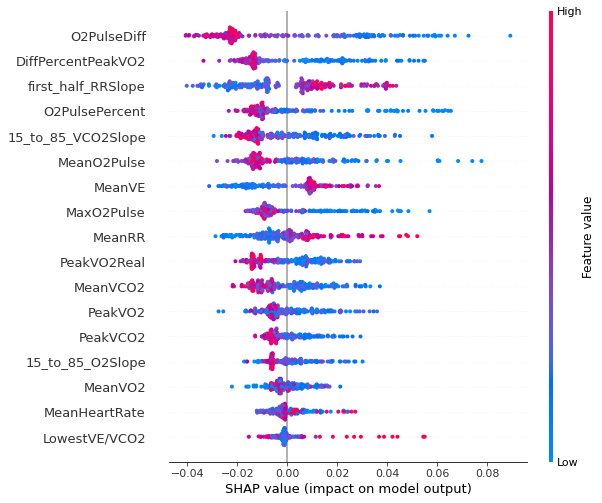

In [145]:
interpret_model(spuml_model, short_df_filtered_pulm,short_pulm_columns,'PulmonaryLim')

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


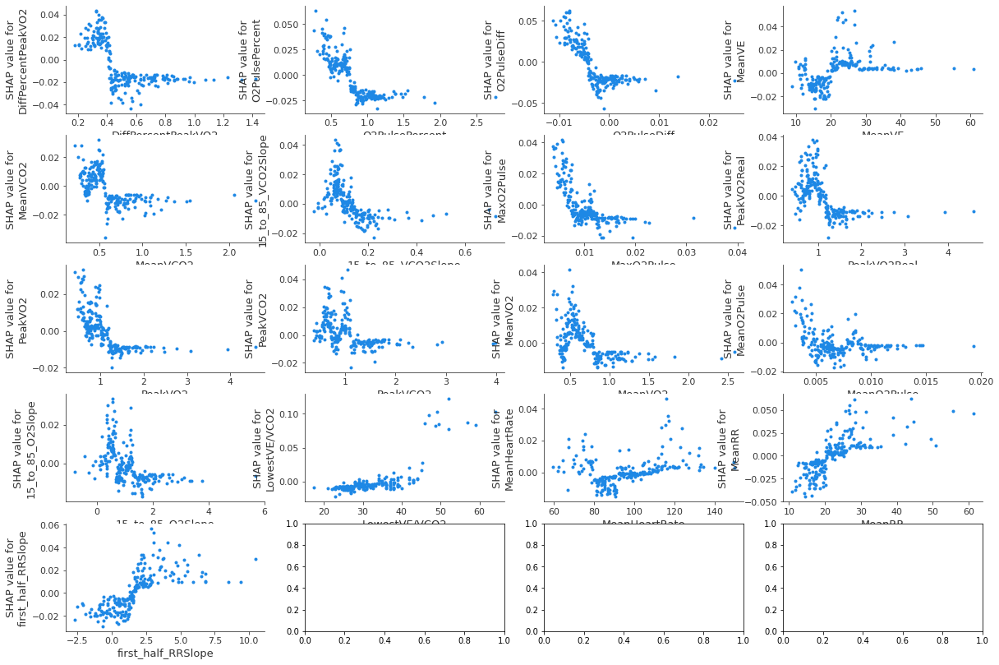

In [150]:
explain_model(spuml_model, short_df_filtered_pulm,short_pulm_columns)

In [140]:
sother_data_df = pd.read_csv('./data/short_other_data.csv')
sother_columns = sother_data_df.columns[1:]
X_other, y_other = sother_data_df[sother_columns].values, sother_data_df['OtherLim'].values
sscaler_other = Normalizer(norm='l1')
sclf_other = RandomForestClassifier(bootstrap=False,class_weight='balanced', criterion="gini",max_features='log2',
                                  min_samples_leaf=0.035789473684210524, min_samples_split= 0.29105263157894734,
                                  n_estimators=400,oob_score=False)
sother_model, sproba_others, sy_test_others, sfpr_oth, stpr_oth  = evaluate_model(sclf_other,X_other, y_other, sscaler_other, total_samples=200, train_size=0.7, smote=True, best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.733 +- 0.064
Sensitivity: 0.536 +- 0.148
Specificity: 0.748 +- 0.074
Positive Predictive Values: 0.359 +- 0.092
Accuracy: 0.703 +- 0.053
195
The highest ppv model has the following:
AUC: 0.851
Sensitivity: 1.000
Specificity: 0.691
Positive Predictive Values: 0.393
Accuracy: 0.742


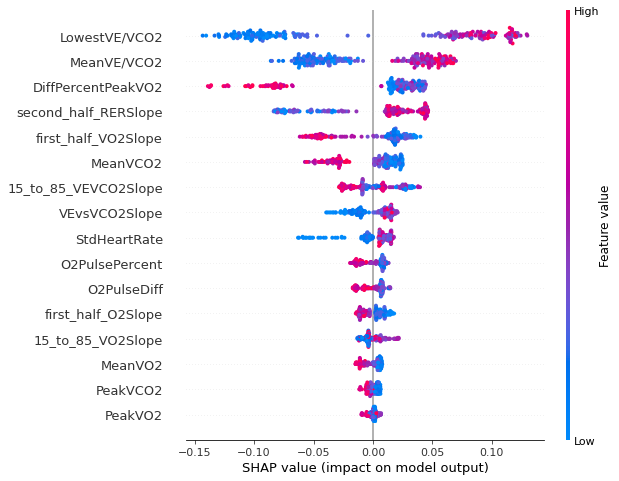

In [141]:
interpret_model(sother_model, sother_data_df,sother_columns,'OtherLim')

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


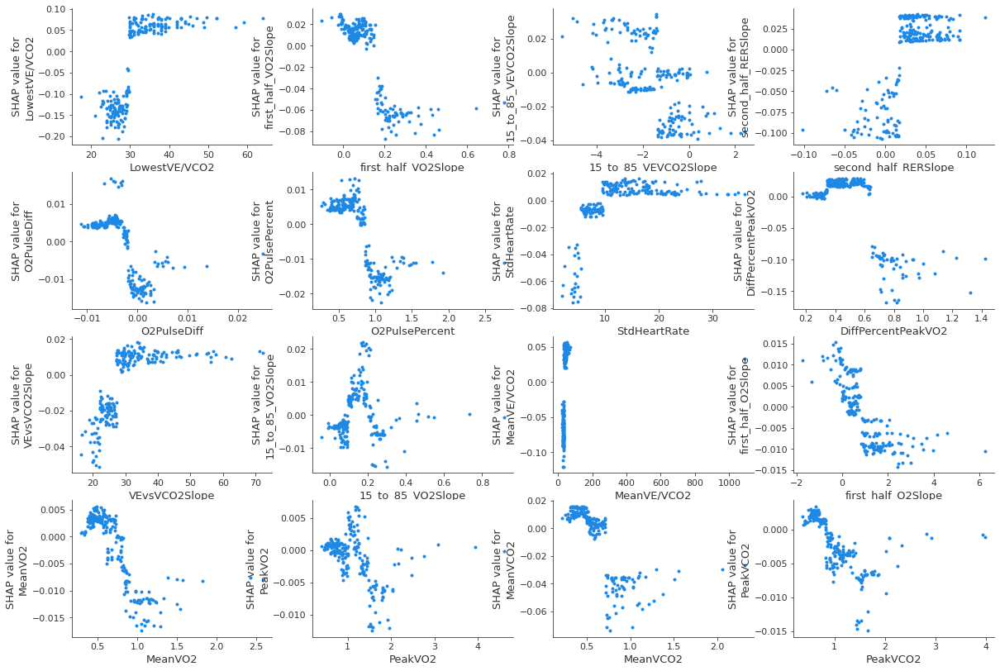

In [143]:
explain_model(sother_model, sother_data_df,sother_columns)

## Other types of limitations

In [12]:
data_raw = pd.read_csv('./data/DigitalDataEnriched_updated.csv')

In [36]:
data_age = data_raw.loc[data_raw.Healthy==1].age
print(f'Healthy{np.mean(data_age)}+/-{np.std(data_age)}')

Healthy52.1578947368421+/-14.661310194539189


In [71]:
indicator = 'BMI'
data_cardiac = data_raw.loc[data_raw.CardiacLim==1][indicator]
print(f'CardiacLim {np.mean(data_cardiac)}+/-{np.std(data_cardiac)}')
data_pulmonary = data_raw.loc[data_raw.PulmonaryLim==1][indicator]
print(f'Pulmonary {np.mean(data_pulmonary)}+/-{np.std(data_pulmonary)}')
data_other = data_raw.loc[data_raw.MuscleSkeletalLim==1][indicator]
print(f'Other {np.mean(data_other)}+/-{np.std(data_other)}')
data_healthy = data_raw.loc[data_raw.Healthy==1][indicator]
print(f'Normal {np.mean(data_healthy)}+/-{np.std(data_healthy)}')

CardiacLim 29.06161539125246+/-7.31260572451371
Pulmonary 25.65686358567809+/-5.361727746428516
Other 26.565512250225446+/-6.35390238385
Normal 29.498447854820398+/-5.503020577755442


In [33]:
data_female = data_raw.loc[(data_raw.MuscleSkeletalLim==1) & (data_raw.sex == 'F')].sex.count()
data_female

14

In [48]:
data_raw.columns

Index(['Unnamed: 0', 'SessionId', 'PatientId', 'sex', 'age', 'BMI',
       'MaxVO2_EST', 'MaxO2_EST', 'PredictedMaxHR', 'CardiacLim',
       'PulmonaryLim', 'MuscleSkeletalLim', 'Healthy', 'PeakHeartRate',
       'MeanHeartRate', 'MinHeartRate', 'StdHeartRate', 'LowestVE/VCO2',
       'PeakVE/VCO2', 'MeanVE/VCO2', 'StdVE/VCO2', 'PeakVO2Real',
       'DiffPeakVO2', 'DiffPeakHR', 'DiffPercentPeakVO2', 'DiffPercentPeakHR',
       'DiffPeakRER', 'MeanRER', 'PeakRER', 'LowestRER', 'MeanVE', 'PeakVE',
       'LowestVE', 'MeanRR', 'PeakRR', 'LowestRR', 'MeanVO2', 'PeakVO2',
       'LowestVO2', 'MeanVCO2', 'PeakVCO2', 'LowestVCO2', 'HRvsVO2Slope',
       'VEvsVCO2Slope', 'MeanO2Pulse', 'MaxO2Pulse', 'MinO2Pulse',
       'StdO2Pulse', 'O2PulseDiff', 'O2PulsePercent', '75_to_100_VO2Slope',
       '75_to_100_HRSlope', '75_to_100_VCO2Slope', '75_to_100_VESlope',
       '75_to_100_RERSlope', '75_to_100_RRSlope', '75_to_100_O2Slope',
       '75_to_100_VEVCO2Slope', '75_to_100_VEVO2Slope', '50_to_75_

In [21]:
data_raw.sex

0      F
1      M
2      F
3      M
4      F
      ..
214    M
215    M
216    F
217    M
218    F
Name: sex, Length: 219, dtype: object

In [218]:
other_data_df = pd.read_csv('./data/OtherLimData.csv')

In [219]:
other_columns = other_data_df.columns[1:]

In [160]:
X_other, y_other = other_data_df[other_columns].values, other_data_df['OtherLim'].values
scaler_other = Normalizer(norm='l1')
clf_other = RandomForestClassifier(bootstrap=True,class_weight='balanced', criterion="entropy",max_features=0.7,
                                  min_samples_leaf=0.19052631578947368, min_samples_split= 0.6657894736842105,
                                  n_estimators=600,oob_score=False)
evaluate_model(clf_other,X_other, y_other, scaler_other, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.833 +- 0.072
Sensitivity: 0.796 +- 0.141
Specificity: 0.735 +- 0.087
Positive Predictive Values: 0.442 +- 0.119
Accuracy: 0.749 +- 0.066


In [161]:
X_other, y_other = other_data_df[other_columns].values, other_data_df['OtherLim'].values
scaler_other = Normalizer(norm='l1')
clf_other = RandomForestClassifier(bootstrap=True,class_weight='balanced', criterion="gini",max_features=0.3,
                                  min_samples_leaf=0.06157894736842105, min_samples_split= 0.43157894736842106,
                                  n_estimators=50,oob_score=False)
evaluate_model(clf_other,X_other, y_other, scaler_other, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.849 +- 0.066
Sensitivity: 0.799 +- 0.141
Specificity: 0.769 +- 0.079
Positive Predictive Values: 0.473 +- 0.132
Accuracy: 0.774 +- 0.063


In [162]:
X_other, y_other = other_data_df[other_columns].values, other_data_df['OtherLim'].values
scaler_other = Normalizer(norm='l1')
clf_other = RandomForestClassifier(bootstrap=False,class_weight='balanced', criterion="gini",max_features='log2',
                                  min_samples_leaf=0.035789473684210524, min_samples_split= 0.29105263157894734,
                                  n_estimators=400,oob_score=False)
evaluate_model(clf_other,X_other, y_other, scaler_other, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.845 +- 0.059
Sensitivity: 0.705 +- 0.156
Specificity: 0.800 +- 0.066
Positive Predictive Values: 0.474 +- 0.126
Accuracy: 0.779 +- 0.053


In [163]:
X_other, y_other = other_data_df[other_columns].values, other_data_df['OtherLim'].values
scaler_other = Normalizer(norm='max')
clf_other = RandomForestClassifier(bootstrap=True,class_weight='balanced', criterion="entropy",max_features= 0.5,
                                  min_samples_leaf=0.16473684210526315, min_samples_split= 0.6657894736842105,
                                  n_estimators=400,oob_score=False)
evaluate_model(clf_other,X_other, y_other, scaler_other, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.811 +- 0.079
Sensitivity: 0.695 +- 0.168
Specificity: 0.788 +- 0.110
Positive Predictive Values: 0.483 +- 0.152
Accuracy: 0.769 +- 0.080


In [165]:
X_other, y_other = other_data_df[other_columns].values, other_data_df['OtherLim'].values
scaler_other = Normalizer(norm='l2')
clf_other = RandomForestClassifier(bootstrap=True,class_weight='balanced', criterion="gini",max_features= 0.2,
                                  min_samples_leaf=0.08736842105263157, min_samples_split= 0.6189473684210526,
                                  n_estimators=10,oob_score=False)
evaluate_model(clf_other,X_other, y_other, scaler_other, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.797 +- 0.082
Sensitivity: 0.728 +- 0.170
Specificity: 0.730 +- 0.096
Positive Predictive Values: 0.410 +- 0.125
Accuracy: 0.731 +- 0.073


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

In [171]:
X_other, y_other = other_data_df[other_columns].values, other_data_df['OtherLim'].values
scaler_other = Normalizer(norm='l1')
clf_other = RandomForestClassifier(bootstrap=False,class_weight='balanced', criterion="gini",max_features='log2',
                                  min_samples_leaf=0.035789473684210524, min_samples_split= 0.29105263157894734,
                                  n_estimators=400,oob_score=False)
other_model = evaluate_model(clf_other,X_other, y_other, scaler_other, total_samples=200, train_size=0.8, smote=True, best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.852 +- 0.066
Sensitivity: 0.709 +- 0.160
Specificity: 0.810 +- 0.064
Positive Predictive Values: 0.496 +- 0.125
Accuracy: 0.789 +- 0.056
31
The highest ppv model has the following:
AUC: 0.940
Sensitivity: 0.583
Specificity: 0.969
Positive Predictive Values: 0.875
Accuracy: 0.864


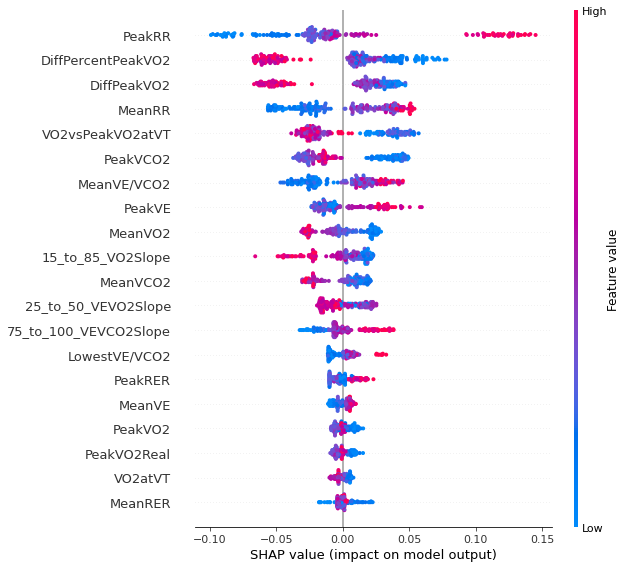

In [220]:
interpret_model(other_model, other_data_df,other_columns,'OtherLim')

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


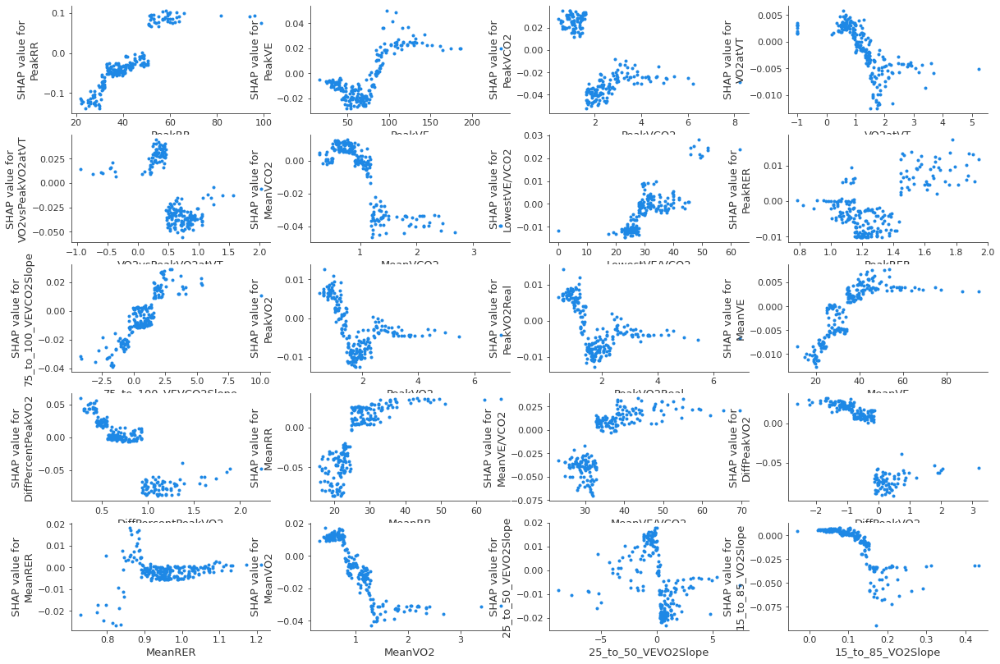

In [221]:
other_data_df = other_data_df.loc[other_data_df['MeanVE/VCO2']<=100]
explainer = shap.TreeExplainer(other_model)
shap_values = explainer.shap_values(other_data_df[other_columns])
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(20, 14))
axes = axes.ravel()
for i, col in enumerate(other_columns):
    shap.dependence_plot(col, shap_values[1], other_data_df[other_columns], ax=axes[i], show=False, interaction_index=None)

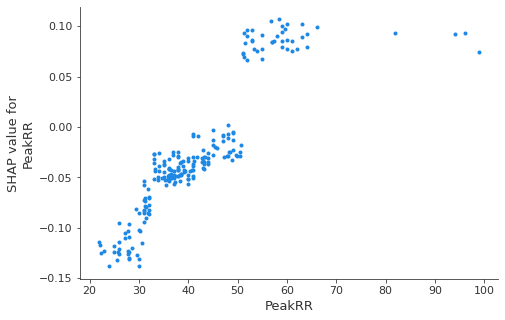

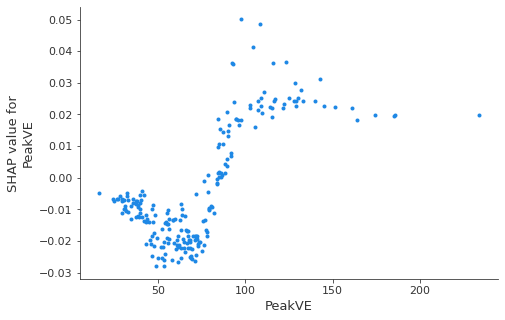

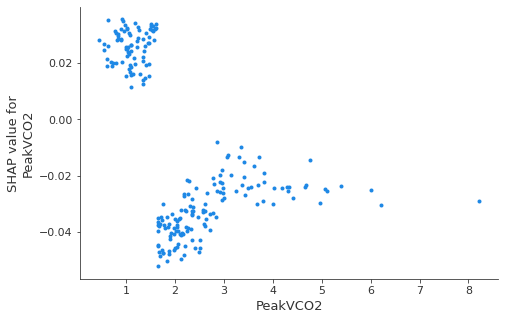

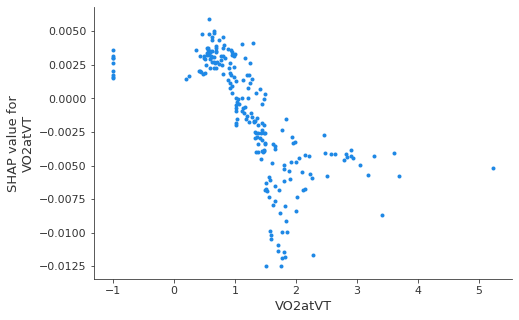

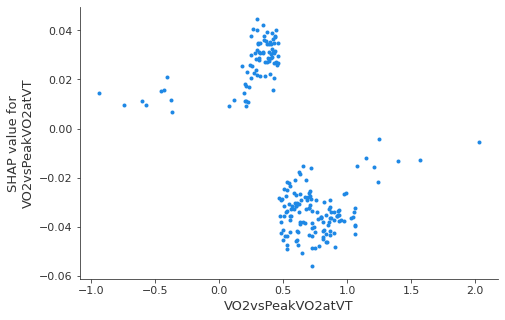

...

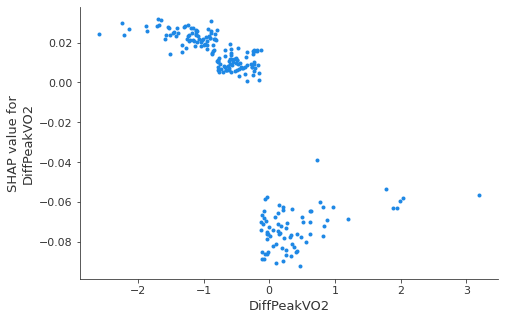

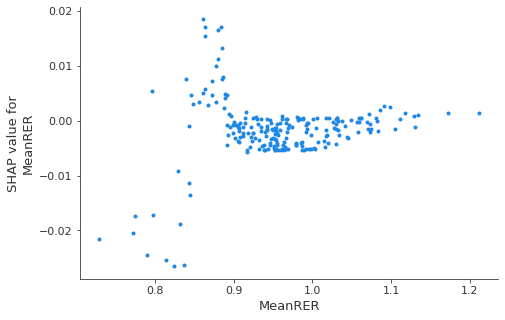

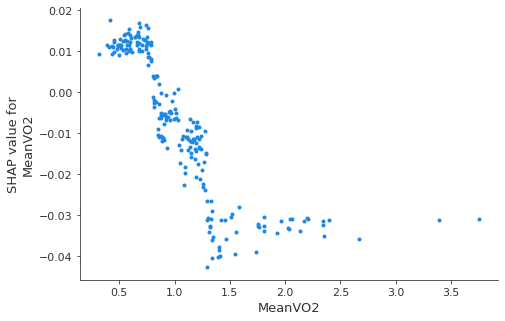

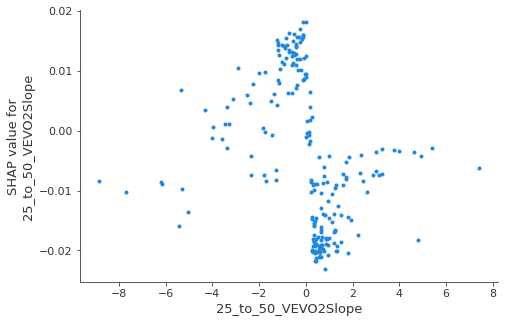

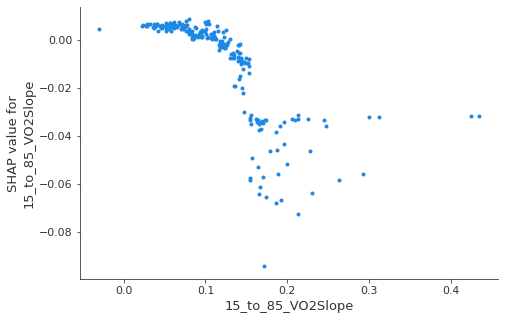

In [222]:
for feature in other_columns:
    shap.dependence_plot(feature, shap_values[1], other_data_df[other_columns], show=False, interaction_index=None)

In [703]:
"""
{
    "class_name": "RandomForestClassifier",
    "module": "sklearn.ensemble",
    "param_args": [],
    "param_kwargs": {
        "bootstrap": false,
        "class_weight": "balanced",
        "criterion": "gini",
        "max_features": 0.05,
        "min_samples_leaf": 0.06157894736842105,
        "min_samples_split": 0.056842105263157895,
        "n_estimators": 50,
        "oob_score": false
    },
    "prepared_kwargs": {},
    "spec_class": "sklearn"
}
"""

'\n{\n    "class_name": "RandomForestClassifier",\n    "module": "sklearn.ensemble",\n    "param_args": [],\n    "param_kwargs": {\n        "bootstrap": false,\n        "class_weight": "balanced",\n        "criterion": "gini",\n        "max_features": 0.05,\n        "min_samples_leaf": 0.06157894736842105,\n        "min_samples_split": 0.056842105263157895,\n        "n_estimators": 50,\n        "oob_score": false\n    },\n    "prepared_kwargs": {},\n    "spec_class": "sklearn"\n}\n'

In [510]:
"""
{
    "class_name": "MaxAbsScaler",
    "module": "sklearn.preprocessing",
    "param_args": [],
    "param_kwargs": {},
    "prepared_kwargs": {},
    "spec_class": "preproc"
}
"""

'\n{\n    "class_name": "MaxAbsScaler",\n    "module": "sklearn.preprocessing",\n    "param_args": [],\n    "param_kwargs": {},\n    "prepared_kwargs": {},\n    "spec_class": "preproc"\n}\n'

In [34]:
pulmonary_data_df = pd.read_csv('./data/DigitalDataEnriched_updated.csv')
pulmonary_data_df.head()

,Unnamed: 0,SessionId,PatientId,sex,age,BMI,MaxVO2_EST,MaxO2_EST,PredictedMaxHR,CardiacLim,...,15_to_85_RERSlope,15_to_85_RRSlope,15_to_85_O2Slope,15_to_85_VEVCO2Slope,15_to_85_VEVO2Slope,VTTime,VO2atVT,PercentTimeAfterVT,VO2vsPeakVO2atVT,HasAnaerobicThresholdMean
0,0,7.0,7.0,F,40,35.915381,2.319521,0.010556,180.0,1,...,0.003380,0.792017,0.876982,-1.683390,-1.271413,14.5,1.649219,0.935484,0.711017,True
1,1,8.0,8.0,M,69,35.057157,2.657210,0.013601,159.7,1,...,0.010742,0.923496,0.620151,-0.658709,-0.235441,11.5,1.384651,0.851852,0.521092,True
2,2,9.0,9.0,F,16,19.135218,1.444581,0.010300,196.8,0,...,0.029500,1.603876,0.745565,-0.901216,-0.002684,13.0,2.935024,0.702703,2.031748,True
3,3,10.0,10.0,M,17,19.358400,2.293821,0.015833,196.1,0,...,0.023647,3.902252,0.766091,-0.073291,0.689589,12.0,3.601732,0.648649,1.570189,True
4,4,11.0,11.0,F,15,20.582507,1.933529,0.010300,197.5,0,...,0.035189,3.262936,1.006688,-0.620017,0.499574,7.5,1.229809,0.259259,0.636044,True


In [35]:
pulmonary_data_df[['O2PulsePercent','O2PulseDiff']]

,O2PulsePercent,O2PulseDiff
0,1.164275,0.001734
1,0.743136,-0.003494
2,1.564266,0.005812
3,1.403722,0.006392
4,1.618460,0.006370
...,...,...
214,0.824253,-0.002560
215,0.727260,-0.003709
216,0.963157,-0.000403
217,0.665953,-0.004777


In [9]:
import seaborn as sns
fig, ax = plt.subplots()
sns.distplot(pulmonary_data_df.loc[pulmonary_data_df.PulmonaryLim == 1].O2PulsePercent.values, rug=True, hist=False, ax=ax, color ='r')
sns.distplot(pulmonary_data_df.loc[pulmonary_data_df.PulmonaryLim == 0].O2PulsePercent.values, rug=True, hist=False, ax=ax)

NameError: name 'plt' is not defined

In [36]:
pulmonary_features=['VEvsVCO2Slope','O2PulsePercent','O2PulseDiff','MeanVE/VCO2','PeakRR','LowestRR','MeanO2Pulse',
                   '15_to_85_VESlope', '75_to_100_VESlope', '75_to_100_VEVO2Slope', 'MaxO2Pulse', '75_to_100_VCO2Slope',
                   'LowestVE', 'PeakVE', 'MeanVE', '25_to_50_VCO2Slope','50_to_75_HRSlope', '75_to_100_RRSlope']

'VEvsVCO2Slope','O2PulsePercent','MeanVE/VCO2','LowestRR','PeakRR','MeanO2Pulse',
'15_to_85_VESlope','O2PulseDiff','75_to_100_VESlope','75_to_100_VCO2Slope','MaxO2Pulse','PeakVE','LowestVE',
'MeanVO2','75_to_100_VEVO2Slope','0_to_25_VCO2Slope','0_to_25_VO2Slope','25_to_50_VCO2Slope','0_to_25_HRSlope'


('MeanVO2',
 '75_to_100_VEVO2Slope',
 '0_to_25_VCO2Slope',
 '0_to_25_VO2Slope',
 '25_to_50_VCO2Slope',
 '0_to_25_HRSlope')

In [37]:
df_filtered_pulm = pulmonary_data_df[['PulmonaryLim','VEvsVCO2Slope','O2PulsePercent','MeanVE/VCO2','LowestRR','PeakRR','MeanO2Pulse',
'15_to_85_VESlope','O2PulseDiff','75_to_100_VESlope','75_to_100_VCO2Slope','MaxO2Pulse','PeakVE','LowestVE',
'MeanVO2','75_to_100_VEVO2Slope','0_to_25_VCO2Slope','0_to_25_VO2Slope','25_to_50_VCO2Slope','0_to_25_HRSlope']]

In [38]:
df_filtered_pulm = pulmonary_data_df[['PulmonaryLim','O2PulsePercent','O2PulseDiff','MeanO2Pulse','LowestRR',
'PeakRR','VEvsVCO2Slope','15_to_85_RRSlope','50_to_75_RRSlope','MaxO2Pulse','MeanVE/VCO2',
'PeakVCO2','DiffPercentPeakVO2','MeanRR','MeanVE','0_to_25_O2Slope']]

In [12]:
DigitalDataEnriched_2 = df_filtered_pulm.to_csv('./data/PulmonaryFiltered.csv', index = True)

In [170]:
df_filtered_pulm = pulmonary_data_df[['PulmonaryLim','VEvsVCO2Slope','O2PulsePercent','O2PulseDiff','MeanVE/VCO2','PeakRR','LowestRR','MeanO2Pulse',
                   '15_to_85_VESlope', '75_to_100_VESlope', '75_to_100_VEVO2Slope', 'MaxO2Pulse', '75_to_100_VCO2Slope',
                   'LowestVE', 'PeakVE', 'MeanVE', '25_to_50_VCO2Slope','50_to_75_HRSlope', '75_to_100_RRSlope']]

In [39]:
pulm_columns = ['O2PulsePercent','O2PulseDiff','MeanO2Pulse','LowestRR','PeakRR',
'VEvsVCO2Slope','15_to_85_RRSlope','50_to_75_RRSlope','MaxO2Pulse','MeanVE/VCO2',
'PeakVCO2','DiffPercentPeakVO2','MeanRR','MeanVE','0_to_25_O2Slope']
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler = MinMaxScaler()
scaler.fit(X_pulm)
X_scaled = scaler.transform(X_pulm)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_pulm, train_size=0.8)

In [172]:
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="entropy",max_features=0.05,min_samples_leaf=0.08736842105263157,
                            min_samples_split= 0.8063157894736842,n_estimators=10,oob_score=False)
#print(clf)
model = clf.fit(X_train,y_train)

# calculate accuracy
y_hat = model.predict_proba(X_test)[:,1]
#acc = np.average(y_hat == y_test)
#print('Accuracy:', acc)

In [41]:
from sklearn.preprocessing import RobustScaler

In [149]:
pulmonary_data_df = pd.read_csv('./data/PulmonaryData.csv')

In [150]:
pulmonary_data_df

,PulmonaryLim,O2PulsePercent,O2PulseDiff,MeanO2Pulse,LowestRR,PeakRR,VEvsVCO2Slope,15_to_85_RRSlope,50_to_75_RRSlope,MaxO2Pulse,MeanVE/VCO2,PeakVCO2,DiffPercentPeakVO2,MeanRR,MeanVE,0_to_25_O2Slope
0,0,1.164275,0.001734,0.007568,15.302423,31.413610,21.965918,0.792017,2.416547,0.012291,32.984937,1.841881,0.747717,21.867003,19.818386,0.438664
1,0,0.743136,-0.003494,0.007629,11.450382,27.805007,32.178401,0.923496,0.366922,0.010107,32.726303,1.755058,0.576940,18.171081,26.531645,0.465141
2,0,1.564266,0.005812,0.010763,21.164022,57.466124,24.305827,1.603876,0.956695,0.016112,31.615255,4.017933,2.230652,41.490574,52.745732,1.774798
3,0,1.403722,0.006392,0.014520,16.032064,81.852619,31.303074,3.902252,11.582974,0.022226,33.379573,5.071026,1.889415,46.376825,77.577714,3.056480
4,0,1.618460,0.006370,0.010903,13.233392,48.178596,27.635025,3.262936,4.999265,0.016670,32.515165,3.688401,1.620847,30.128884,59.037830,1.517485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,0,0.824253,-0.002560,0.007176,16.233767,31.243990,32.627983,2.657973,9.818140,0.012007,36.512320,1.082046,0.522655,21.530093,25.235674,-0.899500
215,0,0.727260,-0.003709,0.007194,12.300761,28.076384,34.338427,0.726114,1.815211,0.009891,41.255798,1.057428,0.438801,19.438137,20.300104,-0.289202
216,0,0.963157,-0.000403,0.007556,9.569379,35.502960,29.116581,1.313129,-0.555158,0.010523,31.738474,1.645358,0.785759,24.929432,26.241464,0.342682
217,0,0.665953,-0.004777,0.007585,18.594623,30.603228,29.765742,1.205767,0.848362,0.009523,48.264215,0.694750,0.427849,25.228294,19.384530,0.899975


In [148]:
pulm_columns=pulmonary_data_df.columns[1:]

Index(['O2PulsePercent', 'O2PulseDiff', 'MeanO2Pulse', 'LowestRR', 'PeakRR',
       'VEvsVCO2Slope', '15_to_85_RRSlope', '50_to_75_RRSlope', 'MaxO2Pulse',
       'MeanVE/VCO2', 'PeakVCO2', 'DiffPercentPeakVO2', 'MeanRR', 'MeanVE',
       '0_to_25_O2Slope'],
      dtype='object')

In [151]:
df_filtered_pulm = pulmonary_data_df.copy()

In [206]:
pulm_columns

['O2PulsePercent',
 'O2PulseDiff',
 'MeanO2Pulse',
 'LowestRR',
 'PeakRR',
 'VEvsVCO2Slope',
 '15_to_85_RRSlope',
 '50_to_75_RRSlope',
 'MaxO2Pulse',
 'MeanVE/VCO2',
 'PeakVCO2',
 'DiffPercentPeakVO2',
 'MeanRR',
 'MeanVE',
 '0_to_25_O2Slope']

In [200]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = Normalizer(norm='l1')
clf_pulm = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="gini",max_features='log2',min_samples_leaf=0.1131578947368421,
                            min_samples_split= 0.38473684210526315,n_estimators=600,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.802 +- 0.100
Sensitivity: 0.788 +- 0.204
Specificity: 0.754 +- 0.064
Positive Predictive Values: 0.312 +- 0.116
Accuracy: 0.757 +- 0.059


In [156]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = StandardScaler( with_mean=False, with_std=False)
clf_pulm = RandomForestClassifier(bootstrap=True,  criterion="entropy",max_features=0.1,min_samples_leaf=0.01,
                            min_samples_split= 0.01,n_estimators=50,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.823 +- 0.096
Sensitivity: 0.494 +- 0.249
Specificity: 0.866 +- 0.061
Positive Predictive Values: 0.333 +- 0.169
Accuracy: 0.819 +- 0.056


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [154]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = MinMaxScaler()
clf_pulm = RandomForestClassifier(bootstrap=False, criterion="gini",max_features='sqrt',min_samples_leaf=0.01,
                            min_samples_split= 0.10368421052631578,n_estimators=10,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.802 +- 0.090
Sensitivity: 0.482 +- 0.235
Specificity: 0.867 +- 0.056
Positive Predictive Values: 0.336 +- 0.173
Accuracy: 0.818 +- 0.051


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

In [191]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = Normalizer(norm='l1')
clf_pulm = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="entropy",max_features=0.2,min_samples_leaf=0.13894736842105262,
                            min_samples_split= 0.5721052631578947,n_estimators=400,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.806 +- 0.108
Sensitivity: 0.785 +- 0.201
Specificity: 0.751 +- 0.071
Positive Predictive Values: 0.304 +- 0.121
Accuracy: 0.755 +- 0.061


In [193]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = Normalizer(norm='l2')
clf_pulm = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="entropy",max_features='log2',min_samples_leaf=0.29368421052631577,
                            min_samples_split= 0.15052631578947367,n_estimators=100,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.792 +- 0.108
Sensitivity: 0.764 +- 0.205
Specificity: 0.756 +- 0.072
Positive Predictive Values: 0.303 +- 0.112
Accuracy: 0.757 +- 0.062


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [194]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = Normalizer(norm='l2')
clf_pulm = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="entropy",max_features=0.3,min_samples_leaf=0.24210526315789474,
                            min_samples_split= 0.2442105263157895,n_estimators=50,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.777 +- 0.115
Sensitivity: 0.746 +- 0.229
Specificity: 0.752 +- 0.072
Positive Predictive Values: 0.283 +- 0.118
Accuracy: 0.751 +- 0.062


In [195]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = Normalizer(norm='max')
clf_pulm = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="entropy",max_features='sqrt',min_samples_leaf=0.2163157894736842,
                            min_samples_split= 0.5252631578947369,n_estimators=600,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.804 +- 0.108
Sensitivity: 0.782 +- 0.193
Specificity: 0.752 +- 0.068
Positive Predictive Values: 0.301 +- 0.129
Accuracy: 0.757 +- 0.065


In [196]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = Normalizer(norm='max')
clf_pulm = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="entropy",max_features='sqrt',min_samples_leaf=0.2163157894736842,
                            min_samples_split= 0.5252631578947369,n_estimators=600,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.814 +- 0.094
Sensitivity: 0.791 +- 0.175
Specificity: 0.750 +- 0.075
Positive Predictive Values: 0.310 +- 0.120
Accuracy: 0.754 +- 0.064


In [197]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = Normalizer(norm='l1')
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features=0.05,min_samples_leaf=0.035789473684210524,
                            min_samples_split=0.43157894736842106,n_estimators=50,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: nan +- nan
Sensitivity: nan +- nan
Specificity: 0.751 +- 0.065
Positive Predictive Values: 0.299 +- 0.126
Accuracy: 0.755 +- 0.056


In [198]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = Normalizer(norm='l2')
clf_pulm = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features='log2',min_samples_leaf=0.29368421052631577,
                            min_samples_split= 0.15052631578947367,n_estimators=100,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.801 +- 0.105
Sensitivity: 0.792 +- 0.186
Specificity: 0.756 +- 0.067
Positive Predictive Values: 0.314 +- 0.117
Accuracy: 0.760 +- 0.057


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [ ]:
def interpret_model(model):
    explainer = shap.TreeExplainer(model, data=cardiac_data_df[cardiac_top_features])
    shap_values = explainer.shap_values(cardiac_data_df[cardiac_top_features])
    shap.summary_plot(shap_values[1], cardiac_data_df[cardiac_top_features], plot_type='dot')
    pass

In [72]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = RobustScaler(quantile_range=[25,75])
clf_pulm = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features=0.1,min_samples_leaf=0.06157894736842105,
                            min_samples_split= 0.01,n_estimators=10,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=300, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.806 +- 0.113
Sensitivity: 0.589 +- 0.244
Specificity: 0.819 +- 0.060
Positive Predictive Values: 0.308 +- 0.148
Accuracy: 0.792 +- 0.057


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [78]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = MinMaxScaler()
clf_pulm = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features=0.05,min_samples_leaf=0.13894736842105262,
                            min_samples_split= 0.01,n_estimators=100,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=300, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.813 +- 0.095
Sensitivity: 0.639 +- 0.239
Specificity: 0.804 +- 0.064
Positive Predictive Values: 0.303 +- 0.134
Accuracy: 0.783 +- 0.058


In [87]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = StandardScaler(with_mean=False, with_std=True)
clf_pulm = RandomForestClassifier(bootstrap=False, criterion="entropy",max_features=0.2,min_samples_leaf=0.01,
                            min_samples_split= 0.10368421052631578,n_estimators=25,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=300, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.804 +- 0.108
Sensitivity: 0.478 +- 0.221
Specificity: 0.866 +- 0.057
Positive Predictive Values: 0.331 +- 0.167
Accuracy: 0.819 +- 0.056


In [210]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
#scaler_pulm = Normalizer(norm='max')
#clf_pulm = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="entropy",max_features='sqrt',min_samples_leaf=0.2163157894736842,
#                            min_samples_split= 0.5252631578947369,n_estimators=600,oob_score=False)
scaler_pulm = StandardScaler( with_mean=False, with_std=False)
clf_pulm = RandomForestClassifier(bootstrap=True,  criterion="entropy",max_features=0.1,min_samples_leaf=0.01,
                            min_samples_split= 0.01,n_estimators=50,oob_score=False)
puml_model = evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=300, train_size=0.8, smote=True, best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.819 +- 0.093
Sensitivity: 0.469 +- 0.263
Specificity: 0.869 +- 0.057
Positive Predictive Values: 0.314 +- 0.176
Accuracy: 0.823 +- 0.054
35
The highest ppv model has the following:
AUC: 0.921
Sensitivity: 0.667
Specificity: 0.974
Positive Predictive Values: 0.800
Accuracy: 0.932


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


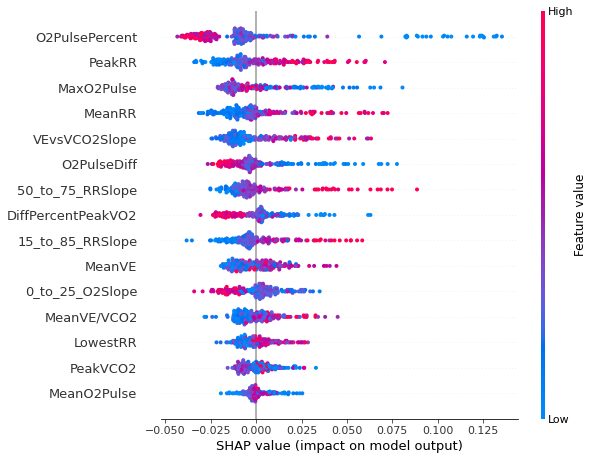

In [211]:
interpret_model(puml_model, df_filtered_pulm,pulm_columns,'PulmonaryLim')

In [368]:
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler_pulm = MinMaxScaler()
clf_pulm = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features=0.05,min_samples_leaf=0.2163157894736842,
                            min_samples_split= 0.7594736842105263,n_estimators=10,oob_score=False)
evaluate_model(clf_pulm,X_pulm, y_pulm, scaler_pulm, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.829 +- 0.068
Sensitivity: 0.735 +- 0.182
Specificity: 0.745 +- 0.091
Positive Predictive Values: 0.386 +- 0.126
Accuracy: 0.743 +- 0.072


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


### Best pulmonary model so far

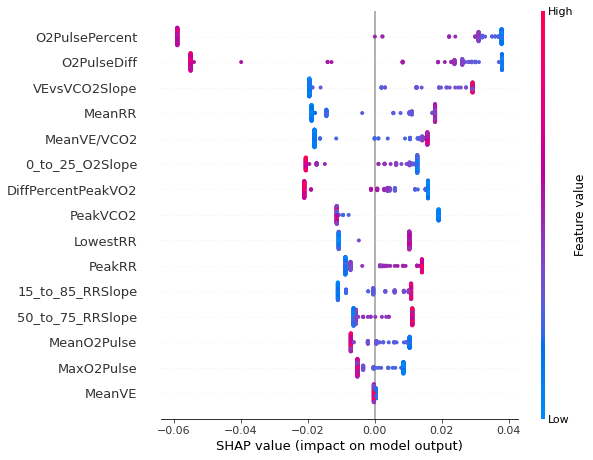

In [209]:
interpret_model(puml_model, df_filtered_pulm,pulm_columns,'PulmonaryLim')

In [389]:
df_filtered_pulm.sort_values(by=['50_to_75_HRSlope'], ascending=False)[['50_to_75_HRSlope']]

,50_to_75_HRSlope
135,18.000000
129,16.400000
99,15.285714
67,14.214286
101,14.166667
...,...
47,1.400000
40,-0.742857
55,-2.803892
8,-3.371429


In [212]:
df_filtered_pulm_curated = df_filtered_pulm.loc[df_filtered_pulm['MeanVE/VCO2']<=100].loc[df_filtered_pulm['MaxO2Pulse']<=0.10]

In [213]:
explainer = shap.TreeExplainer(puml_model)
shap_values = explainer.shap_values(df_filtered_pulm_curated[pulm_columns])

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


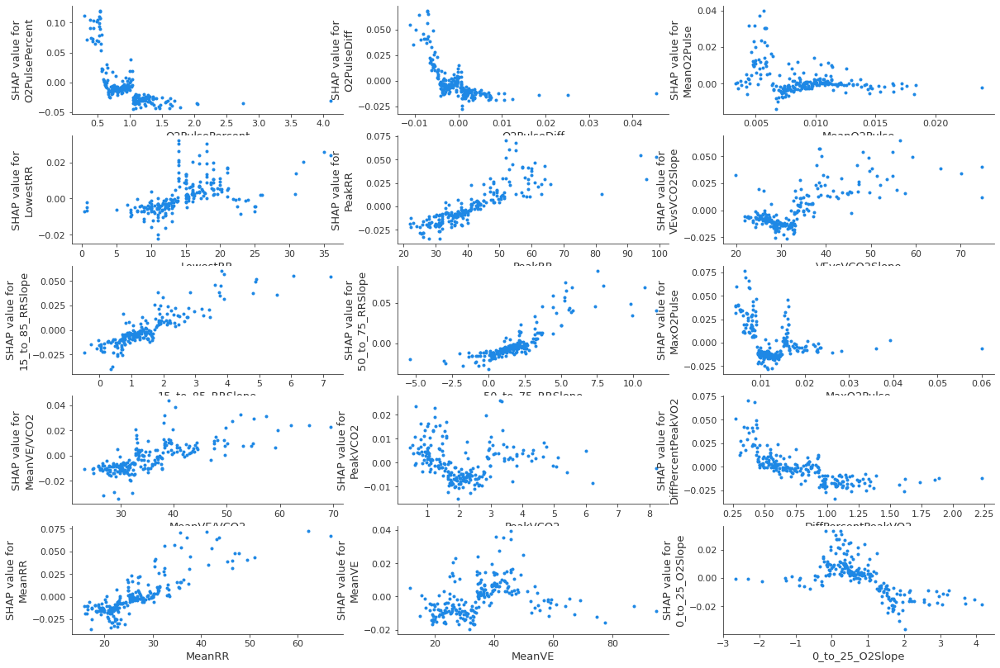

In [214]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 14))
axes = axes.ravel()
for i, col in enumerate(pulm_columns):
    shap.dependence_plot(col, shap_values[1], df_filtered_pulm_curated[pulm_columns], ax=axes[i], show=False, interaction_index=None)

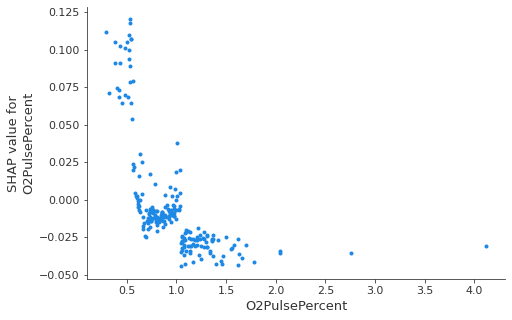

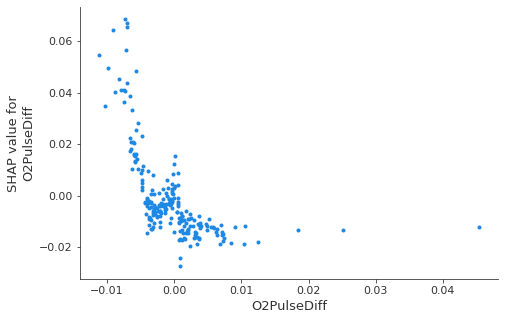

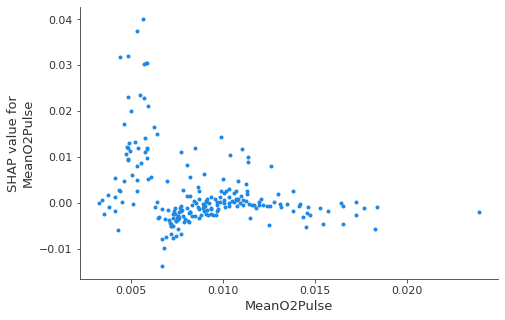

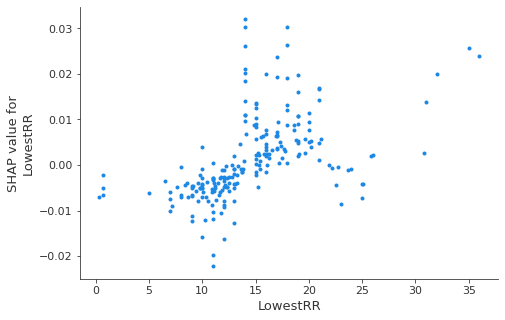

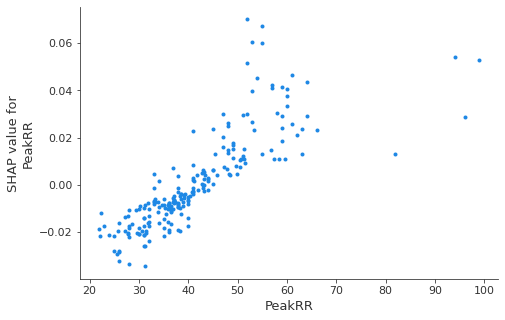

...

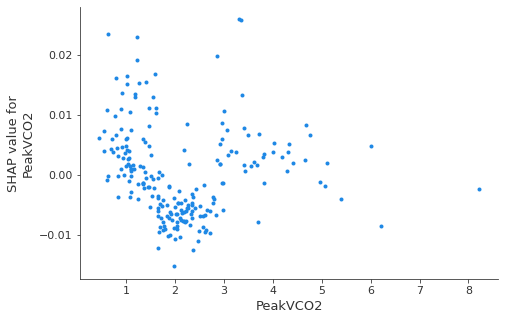

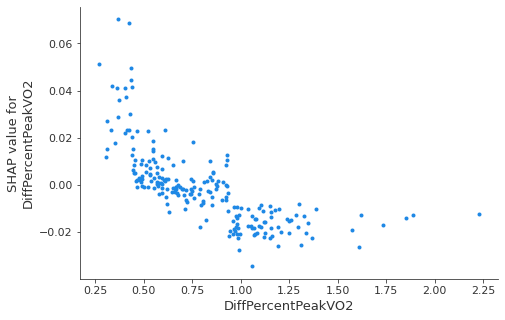

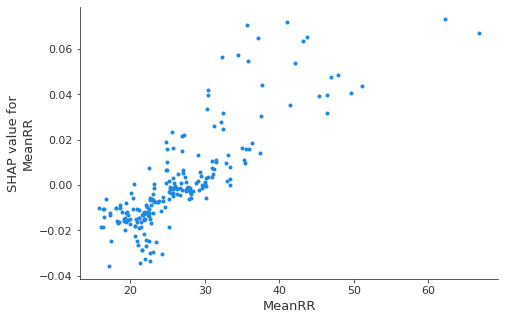

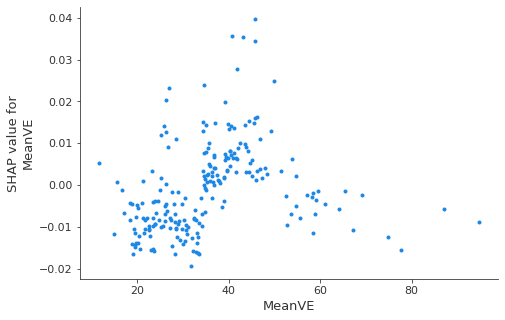

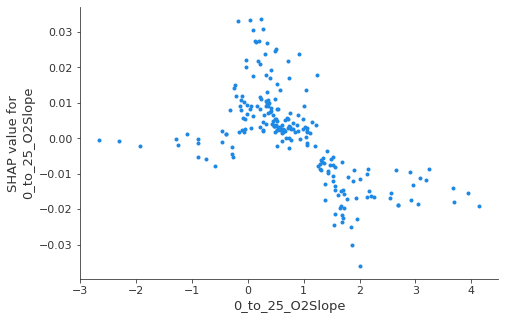

In [215]:
for feature in pulm_columns:
    shap.dependence_plot(feature, shap_values[1], df_filtered_pulm_curated[pulm_columns], show=False, interaction_index=None)

In [528]:
confusion_matrix(y_test, np.round(y_hat))

array([[29,  5],
       [ 2,  8]], dtype=int64)

In [529]:
y_hat = model.predict_proba(X_test)[:,1]
acc = np.average(np.round(y_hat) == y_test)
print('Accuracy:', acc)

Accuracy: 0.8409090909090909


In [530]:
pulm_df = pd.DataFrame(X_train, 
             columns=pulm_columns)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


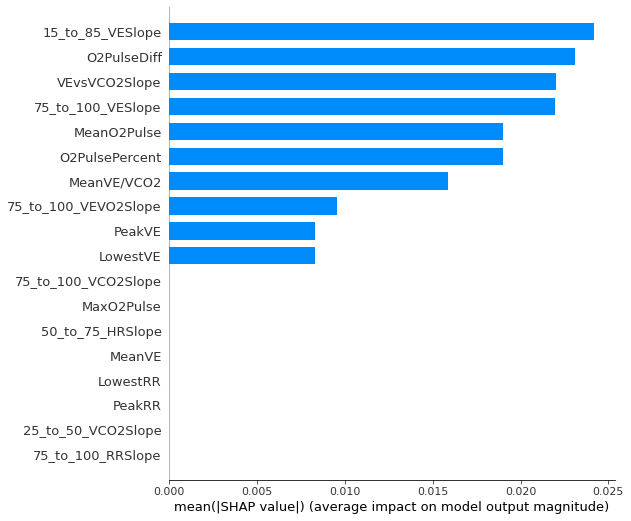

In [531]:
import shap
shap_values = shap.TreeExplainer(model).shap_values(pulm_df)
shap.summary_plot(shap_values[0], pulm_df, plot_type="bar")

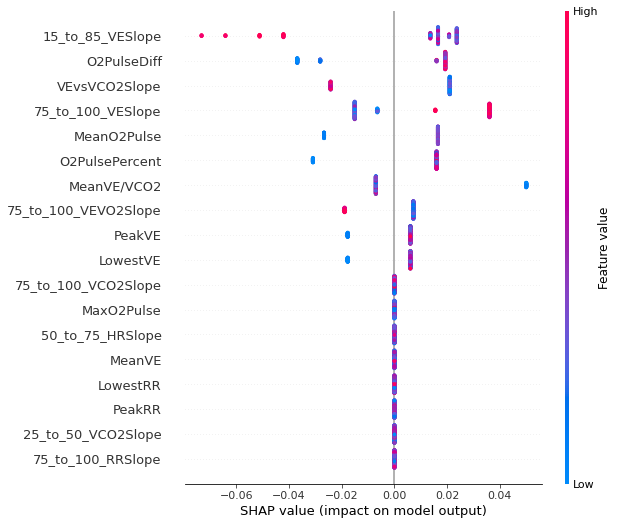

In [532]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(pulm_df)
# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[0], pulm_df, plot_type='dot')

In [658]:
pulm_columns = ['VEvsVCO2Slope','O2PulsePercent','O2PulseDiff','MeanVE/VCO2','PeakRR','LowestRR','MeanO2Pulse',
                   '15_to_85_VESlope', '75_to_100_VESlope', '75_to_100_VEVO2Slope', 'MaxO2Pulse', '75_to_100_VCO2Slope',
                   'LowestVE', 'PeakVE', 'MeanVE', '25_to_50_VCO2Slope','50_to_75_HRSlope', '75_to_100_RRSlope']
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X_pulm)
X_scaled = scaler.transform(X_pulm)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_pulm, train_size=0.8)

In [659]:
clf_linear = LogisticRegression(C=0.4067926406393288, class_weight='balanced', multi_class='multinomial',
                        penalty='l1',solver='saga')
#print(clf)
model = clf_linear.fit(X_train,y_train)

In [660]:
y_hat = model.predict_proba(X_train)[:,1]
confusion_matrix(y_train, np.round(y_hat))

array([[109,  36],
       [  5,  25]], dtype=int64)

In [661]:
y_hat = model.predict_proba(X_test)[:,1]
confusion_matrix(y_test, np.round(y_hat))

array([[31,  4],
       [ 2,  7]], dtype=int64)

In [662]:
for i in range(0,len(pulm_columns)):
    if(model.coef_[0][i]!=0):
        print('{} -> {}'.format(pulm_columns[i],model.coef_[0][i]))

VEvsVCO2Slope -> 0.3032726028627388
O2PulseDiff -> -0.39754220789243355
PeakRR -> 0.09913498985937404
LowestRR -> 0.09913498985937404
MeanO2Pulse -> -0.42487052414202553
75_to_100_VEVO2Slope -> 0.14122089381548397
MaxO2Pulse -> 0.07439909092779519
75_to_100_VCO2Slope -> -0.026479198553991463
25_to_50_VCO2Slope -> -0.07032101834173192
75_to_100_RRSlope -> -0.15111467384828114


In [685]:
pulm_columns = ['VEvsVCO2Slope','O2PulsePercent','O2PulseDiff','MeanVE/VCO2','PeakRR','LowestRR','MeanO2Pulse',
                   '15_to_85_VESlope', '75_to_100_VESlope', '75_to_100_VEVO2Slope', 'MaxO2Pulse', '75_to_100_VCO2Slope',
                   'LowestVE', 'PeakVE', 'MeanVE', 'MeanVE','50_to_75_HRSlope', '75_to_100_RRSlope']
X_pulm, y_pulm = df_filtered_pulm[pulm_columns].values, df_filtered_pulm['PulmonaryLim'].values
scaler = Normalizer(norm='max')
scaler.fit(X_pulm)
X_scaled = scaler.transform(X_pulm)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_pulm, train_size=0.8)

In [686]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [687]:
clf = DecisionTreeClassifier(class_weight='balanced', criterion='entropy',  min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.056842105263157895, splitter='random')
model = clf.fit(X_train,y_train)

In [688]:
y_hat = model.predict_proba(X_test)[:,1]
confusion_matrix(y_test, np.round(y_hat))

array([[23,  8],
       [ 0, 13]], dtype=int64)

In [689]:
y_hat = model.predict_proba(X_train)[:,1]
confusion_matrix(y_train, np.round(y_hat))

array([[109,  40],
       [  3,  23]], dtype=int64)

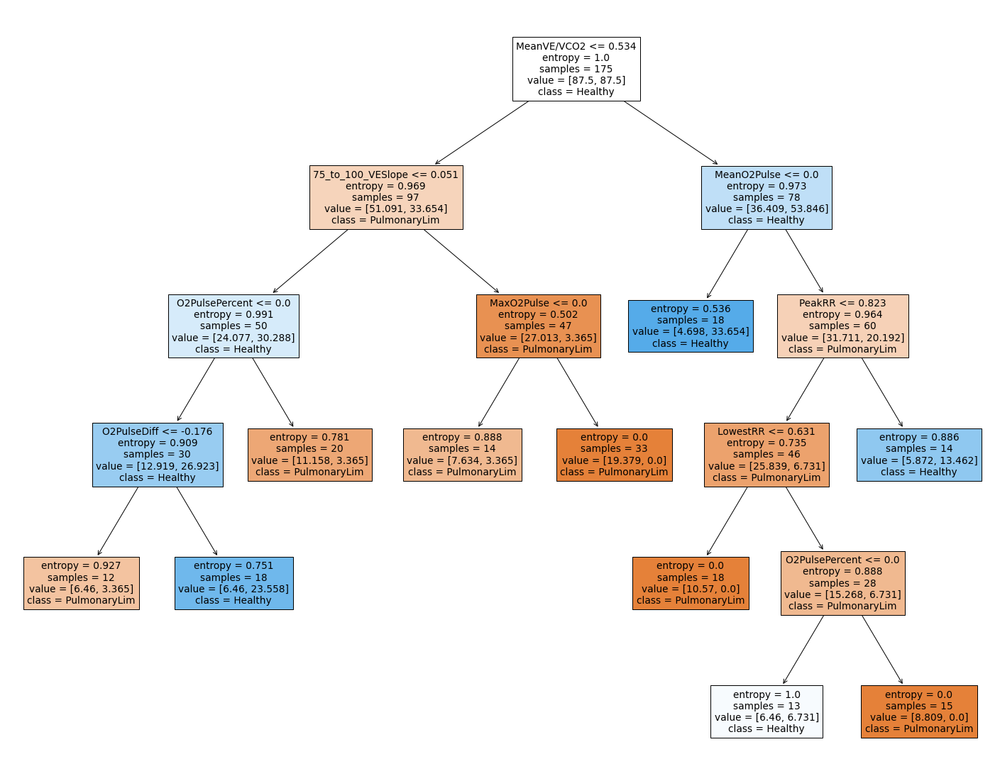

In [690]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(model, 
                   feature_names=pulm_df.columns,  
                   class_names=['PulmonaryLim','Healthy'],
                   filled=True)

## Pulmonary model Interpretation

In [914]:
pulmonary_data_df=pulmonary_data_df_copy.copy()

In [1009]:
X, y = pulmonary_data_df[pulmonary_features].values, pulmonary_data_df['PulmonaryLim'].values
scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X)
X_scaled = scaler.transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.8)

In [1010]:
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features='sqrt',min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.10368421052631578,n_estimators=25,oob_score=False)
#print(clf)
model = clf.fit(X_train,y_train)

# calculate accuracy
y_hat = model.predict(X_test)
acc = np.average(y_hat == y_test)
print('Accuracy:', acc)

Accuracy: 0.8409090909090909


In [1011]:
confusion_matrix(y_test, np.round(y_hat))

array([[31,  2],
       [ 5,  6]], dtype=int64)

In [1012]:
confusion_matrix(y_train, np.round(model.predict(X_train)))

array([[127,  20],
       [  0,  28]], dtype=int64)

In [889]:
pulmonary_data_df_copy = pulmonary_data_df.copy()

In [1033]:
pulmonary_data_df = pulmonary_data_df.loc[pulmonary_data_df.SessionId!=34]

In [1034]:
clfPulmonary = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features='sqrt',min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.10368421052631578,n_estimators=25,oob_score=False)

In [1035]:
modelPulmonary = clfPulmonary.fit(pulmonary_data_df[pulmonary_features],pulmonary_data_df['PulmonaryLim'])

In [1036]:
explainer = shap.TreeExplainer(modelPulmonary, data=pulmonary_data_df[pulmonary_features])

In [1037]:
shap_values = explainer.shap_values(pulmonary_data_df[pulmonary_features])

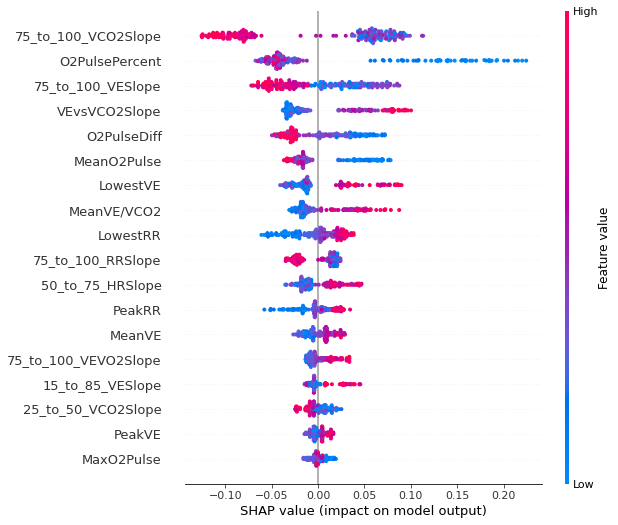

In [1038]:
shap.summary_plot(shap_values[1], pulmonary_data_df[pulmonary_features], plot_type='dot')

1


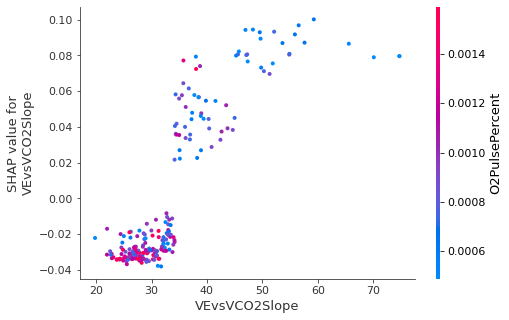

2


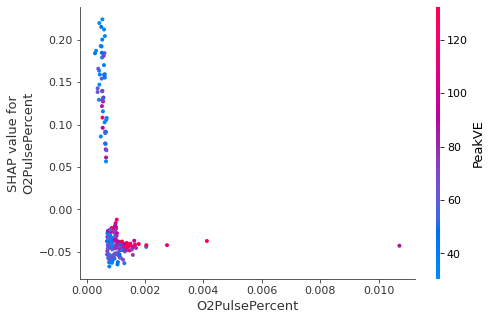

3


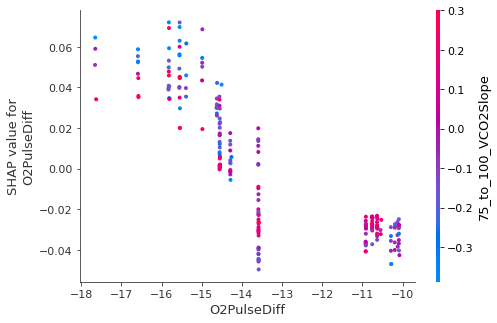

4


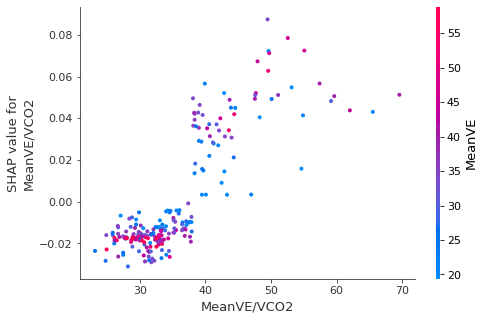

5


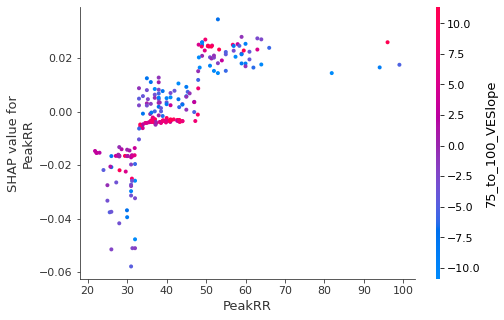

6


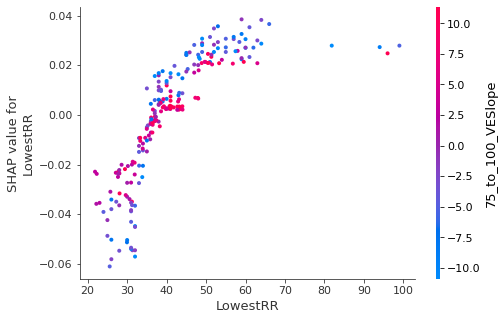

7


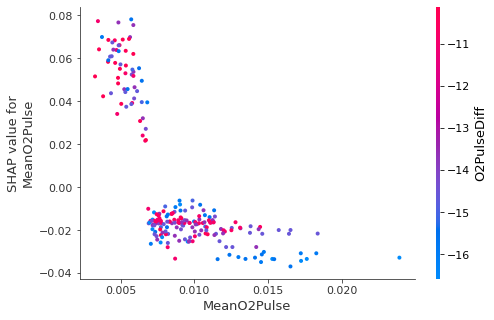

8


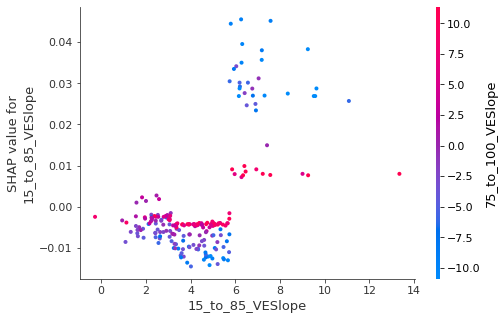

9


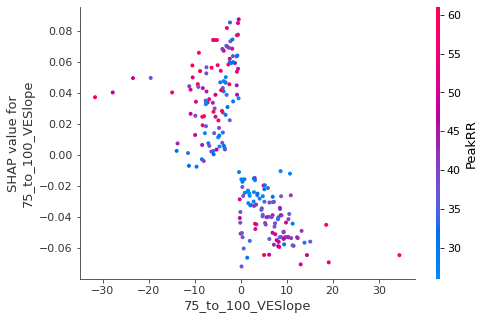

10


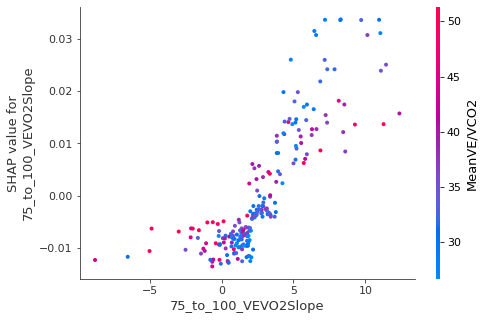

11


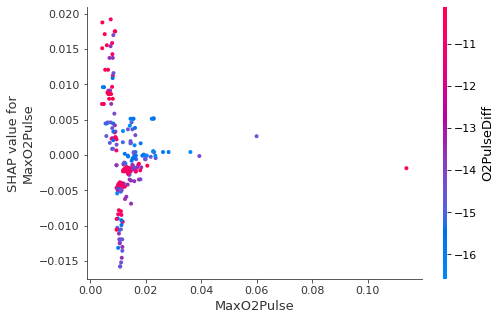

12


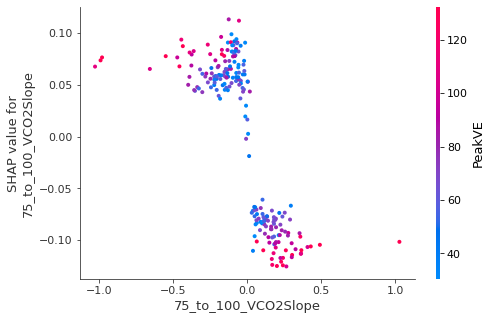

13


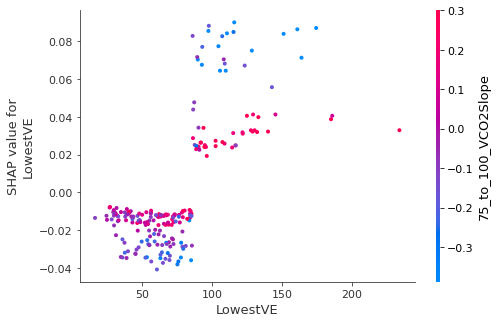

14


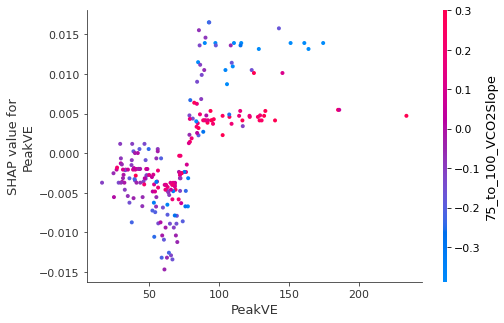

15


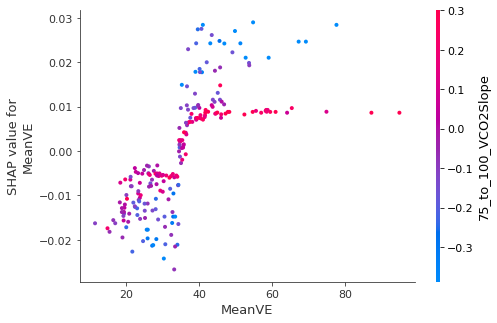

16


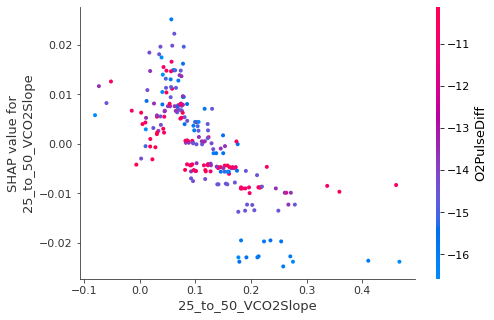

17


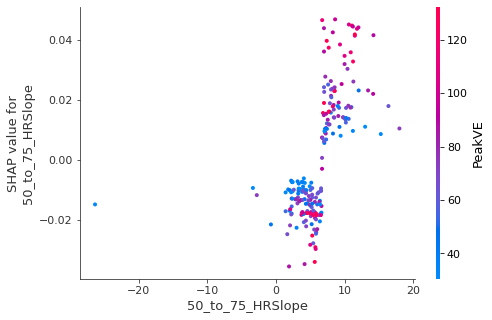

18


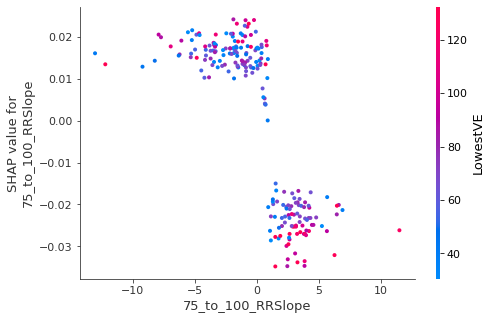

In [1039]:
i =1
for feature in pulmonary_features:
    print(i)
    i+=1
    shap.dependence_plot(feature, shap_values[1], pulmonary_data_df[pulmonary_features])

In [6]:
DigitalDataEnriched_2 = df_filtered_pulm.to_csv('./data/PulmonaryFiltered.csv', index = True)

NameError: name 'df_filtered_pulm' is not defined

In [14]:
cardiac_data_df = pd.read_csv('./data/DigitalDataEnriched_updated.csv')
cardiac_data_df.head()

,Unnamed: 0,SessionId,PatientId,sex,age,BMI,MaxVO2_EST,MaxO2_EST,PredictedMaxHR,CardiacLim,...,15_to_85_RERSlope,15_to_85_RRSlope,15_to_85_O2Slope,15_to_85_VEVCO2Slope,15_to_85_VEVO2Slope,VTTime,VO2atVT,PercentTimeAfterVT,VO2vsPeakVO2atVT,HasAnaerobicThresholdMean
0,0,7.0,7.0,F,40,35.915381,2.319521,0.010556,180.0,1,...,0.003380,0.792017,0.876982,-1.683390,-1.271413,14.5,1.649219,0.935484,0.711017,True
1,1,8.0,8.0,M,69,35.057157,2.657210,0.013601,159.7,1,...,0.010742,0.923496,0.620151,-0.658709,-0.235441,11.5,1.384651,0.851852,0.521092,True
2,2,9.0,9.0,F,16,19.135218,1.444581,0.010300,196.8,0,...,0.029500,1.603876,0.745565,-0.901216,-0.002684,13.0,2.935024,0.702703,2.031748,True
3,3,10.0,10.0,M,17,19.358400,2.293821,0.015833,196.1,0,...,0.023647,3.902252,0.766091,-0.073291,0.689589,12.0,3.601732,0.648649,1.570189,True
4,4,11.0,11.0,F,15,20.582507,1.933529,0.010300,197.5,0,...,0.035189,3.262936,1.006688,-0.620017,0.499574,7.5,1.229809,0.259259,0.636044,True


In [15]:
cardiac_top_features=["DiffPercentPeakVO2","75_to_100_VO2Slope","75_to_100_HRSlope","DiffPeakVO2","75_to_100_VCO2Slope","75_to_100_VESlope",
"15_to_85_RRSlope","75_to_100_RERSlope","25_to_50_VESlope","MeanRER","StdVE/VCO2","25_to_50_VCO2Slope",
"50_to_75_O2Slope","75_to_100_RRSlope","50_to_75_RRSlope","MeanHeartRate","VO2vsPeakVO2atVT","PeakVE","LowestVE/VCO2"]

cardiac_top_features=['DiffPercentPeakVO2','75_to_100_VO2Slope','75_to_100_HRSlope','DiffPeakVO2','75_to_100_VCO2Slope','15_to_85_RRSlope','75_to_100_VESlope','25_to_50_VESlope','75_to_100_RERSlope',
'StdVE/VCO2','MeanRER','50_to_75_O2Slope','50_to_75_RRSlope','25_to_50_RRSlope','VO2vsPeakVO2atVT','25_to_50_VCO2Slope','25_to_50_HRSlope','75_to_100_RRSlope','MeanHeartRate',
'PeakVE','0_to_25_HRSlope','75_to_100_VEVCO2Slope','LowestVE/VCO2','MeanVE','25_to_50_RERSlope','HRvsVO2Slope']

cardiac_top_features=['DiffPercentPeakVO2','75_to_100_VO2Slope','75_to_100_HRSlope','DiffPeakVO2','VO2vsPeakVO2atVT','75_to_100_VCO2Slope',
'MeanVE/VCO2','75_to_100_VESlope','O2PulsePercent','15_to_85_RRSlope','MinO2Pulse','25_to_50_VESlope','75_to_100_RERSlope',
'PeakVE/VCO2','LowestVE/VCO2','StdVE/VCO2','MeanHeartRate','VEvsVCO2Slope']

all_features=['CardiacLim','DiffPercentPeakVO2','75_to_100_VO2Slope','75_to_100_HRSlope','DiffPeakVO2','75_to_100_VCO2Slope','15_to_85_RRSlope','75_to_100_VESlope','25_to_50_VESlope','75_to_100_RERSlope',
'StdVE/VCO2','MeanRER','50_to_75_O2Slope','50_to_75_RRSlope','25_to_50_RRSlope','VO2vsPeakVO2atVT','25_to_50_VCO2Slope','25_to_50_HRSlope','75_to_100_RRSlope','MeanHeartRate',
'PeakVE','0_to_25_HRSlope','75_to_100_VEVCO2Slope','LowestVE/VCO2','MeanVE','25_to_50_RERSlope','HRvsVO2Slope']

In [16]:
#all_features = cardiac_top_features.append('CardiacLim')
df_filtered = cardiac_data_df[['CardiacLim','DiffPercentPeakVO2','75_to_100_VO2Slope','75_to_100_HRSlope','DiffPeakVO2','75_to_100_VCO2Slope','15_to_85_RRSlope','75_to_100_VESlope','25_to_50_VESlope','75_to_100_RERSlope',
'StdVE/VCO2','MeanRER','50_to_75_O2Slope','50_to_75_RRSlope','25_to_50_RRSlope','VO2vsPeakVO2atVT','25_to_50_VCO2Slope','25_to_50_HRSlope','75_to_100_RRSlope','MeanHeartRate',
'PeakVE','0_to_25_HRSlope','75_to_100_VEVCO2Slope','LowestVE/VCO2','MeanVE','25_to_50_RERSlope','HRvsVO2Slope']]

In [17]:
df_filtered = cardiac_data_df[['CardiacLim','DiffPercentPeakVO2','75_to_100_VO2Slope','75_to_100_HRSlope','DiffPeakVO2','VO2vsPeakVO2atVT','75_to_100_VCO2Slope',
'MeanVE/VCO2','75_to_100_VESlope','O2PulsePercent','15_to_85_RRSlope','MinO2Pulse','25_to_50_VESlope','75_to_100_RERSlope',
'PeakVE/VCO2','LowestVE/VCO2','StdVE/VCO2','MeanHeartRate','VEvsVCO2Slope']]

In [18]:
df_filtered = cardiac_data_df[['CardiacLim','DiffPercentPeakVO2','MinO2Pulse','DiffPeakVO2','75_to_100_VO2Slope','75_to_100_HRSlope',
'VO2vsPeakVO2atVT','75_to_100_VCO2Slope','MeanHeartRate','25_to_50_VCO2Slope','O2PulsePercent','25_to_50_VESlope',
'O2PulseDiff','75_to_100_RERSlope','MeanVCO2','MeanO2Pulse','MinHeartRate','PeakRER','LowestRER','PeakVO2',
'PeakHeartRate','MeanRER','15_to_85_VEVO2Slope','DiffPercentPeakHR']]

In [119]:
cardiac_data_df = pd.read_csv('./data/CardiacData.csv')

In [120]:
cardiac_data_df

,CardiacLim,PeakHeartRate,MeanHeartRate,MinHeartRate,DiffPeakVO2,DiffPercentPeakVO2,DiffPercentPeakHR,MeanRER,PeakRER,LowestRER,...,O2PulseDiff,O2PulsePercent,75_to_100_VO2Slope,75_to_100_HRSlope,75_to_100_VCO2Slope,75_to_100_RERSlope,25_to_50_VCO2Slope,25_to_50_VESlope,15_to_85_VEVO2Slope,VO2vsPeakVO2atVT
0,1,142,100.290323,68,-0.585175,0.747717,0.788889,0.829255,1.062003,0.686532,...,0.001734,1.164275,0.123423,7.023810,0.216409,0.063604,0.047844,0.838607,-1.271413,0.711017
1,1,158,112.407407,70,-1.124159,0.576940,0.989355,0.885379,1.158222,0.725380,...,-0.003494,0.743136,0.075090,7.714286,0.180712,0.072860,0.074858,1.694753,-0.235441,0.521092
2,0,201,153.351351,70,1.777777,2.230652,1.021341,1.030310,1.863049,0.732450,...,0.005812,1.564266,-0.685285,-17.842424,-0.656155,0.169690,0.152746,3.275643,-0.002684,2.031748
3,0,196,148.378378,73,2.040160,1.889415,0.999490,1.071147,1.811857,0.699760,...,0.006392,1.403722,-0.992913,-21.963636,-0.988564,0.117084,0.223412,5.976927,0.689589,1.570189
4,0,192,149.962963,85,1.200425,1.620847,0.972152,1.105520,1.866904,0.798065,...,0.006370,1.618460,-0.939192,-32.571429,-1.025710,0.135160,0.157792,4.607908,0.499574,0.636044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,0,116,98.714286,81,-1.272063,0.522655,0.684366,1.025666,1.300139,0.773100,...,-0.002560,0.824253,-0.060606,-0.600000,-0.042562,0.004893,0.210839,8.261672,-4.421750,-0.375252
215,0,106,79.000000,66,-1.330695,0.438801,0.655130,0.856299,1.017771,0.768010,...,-0.003709,0.727260,0.160580,12.400000,0.294477,0.165083,0.071547,2.778044,-1.274696,0.438801
216,0,142,111.071429,62,-0.407436,0.785759,0.873846,0.940975,1.107794,0.751343,...,-0.000403,0.963157,0.102643,4.214286,0.133254,0.020187,0.122489,3.024921,0.479021,0.617137
217,0,80,64.722222,48,-0.993367,0.427849,0.533689,0.836757,0.955883,0.760777,...,-0.004777,0.665953,0.011581,2.400000,0.050297,0.056230,0.117555,3.668170,-1.885936,-0.575971


In [121]:
df_filtered=cardiac_data_df.copy()

In [6]:
DigitalDataEnriched_2 = df_filtered.to_csv('./data/CardiacFiltered.csv', index = True)

In [13]:
"MeanVE",
"25_to_50_HRSlope",
"25_to_50_RRSlope",
"VO2atVT",
"PeakHeartRate",
"0_to_25_HRSlope",
"PeakVO2Real",
"PeakRR",
"PercentTimeAfterVT",
"HRvsVO2Slope"


'HRvsVO2Slope'

## For not scaled data

In [20]:
cardiac_top_features=['DiffPercentPeakVO2','MinO2Pulse','DiffPeakVO2','75_to_100_VO2Slope','75_to_100_HRSlope',
'VO2vsPeakVO2atVT','75_to_100_VCO2Slope','MeanHeartRate','25_to_50_VCO2Slope','O2PulsePercent','25_to_50_VESlope',
'O2PulseDiff','75_to_100_RERSlope','MeanVCO2','MeanO2Pulse','MinHeartRate','PeakRER','LowestRER','PeakVO2',
'PeakHeartRate','MeanRER','15_to_85_VEVO2Slope','DiffPercentPeakHR']

In [15]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8)
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features=0.05,min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.056842105263157895,n_estimators=50,oob_score=False)
#print(clf)
model = clf.fit(X_train,y_train)

# calculate accuracy
y_hat = model.predict(X_test)
acc = np.average(y_hat == y_test)
print('Accuracy:', acc)

Accuracy: 0.7159090909090909


In [16]:
X_train.shape
df = pd.DataFrame(X_train, 
             columns=cardiac_top_features)

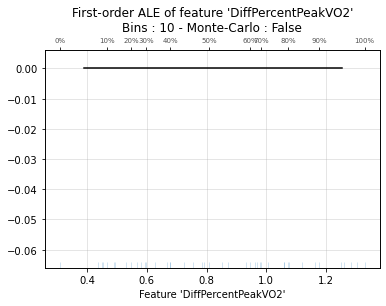

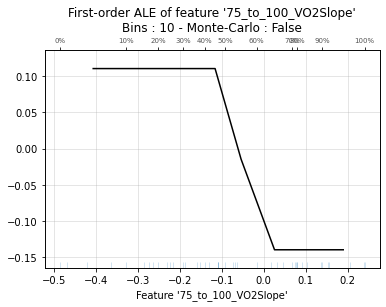

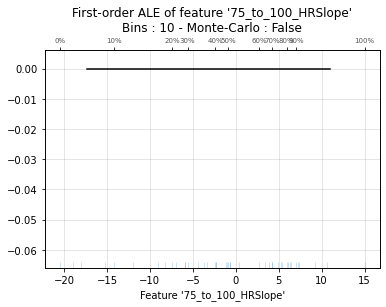

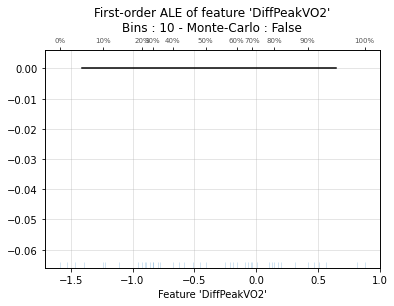

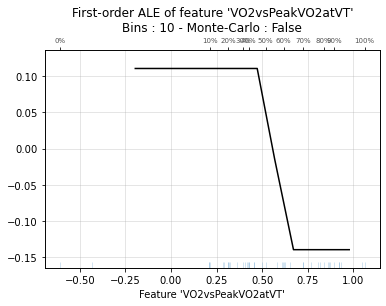

...

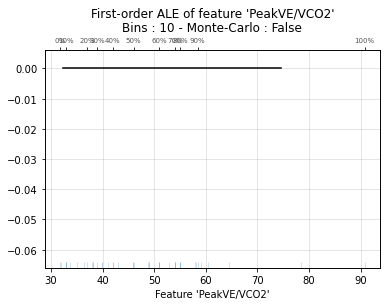

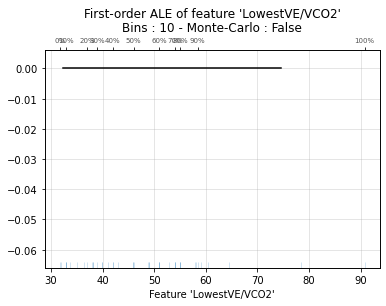

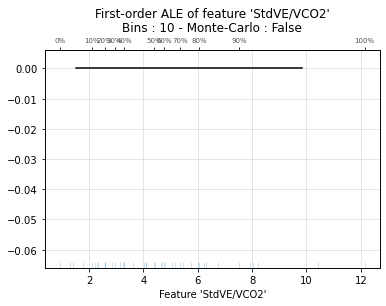

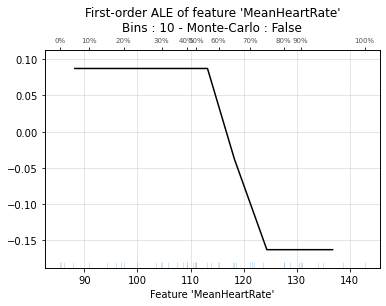

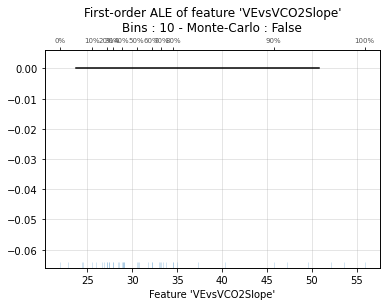

In [17]:
for feature in cardiac_top_features:
    ale_plot(model, df, feature, monte_carlo=False)
    plt.show()

In [18]:
corr = df[['DiffPercentPeakVO2','75_to_100_VO2Slope','75_to_100_VCO2Slope','15_to_85_RRSlope','75_to_100_RERSlope',
'MeanRER','VO2vsPeakVO2atVT','75_to_100_RRSlope','MeanHeartRate']].corr()
corr.style.background_gradient(cmap='coolwarm')

KeyError: "['75_to_100_RRSlope', 'MeanRER'] not in index"

In [21]:
cardiac_top_features=['DiffPercentPeakVO2','MinO2Pulse','DiffPeakVO2','75_to_100_VO2Slope','75_to_100_HRSlope',
'VO2vsPeakVO2atVT','75_to_100_VCO2Slope','MeanHeartRate','25_to_50_VCO2Slope','O2PulsePercent','25_to_50_VESlope',
'O2PulseDiff','75_to_100_RERSlope','MeanVCO2','MeanO2Pulse','MinHeartRate','PeakRER','LowestRER','PeakVO2',
'PeakHeartRate','MeanRER','15_to_85_VEVO2Slope','DiffPercentPeakHR']

In [22]:
from sklearn.metrics import accuracy_score

In [152]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X)
X_scaled = scaler.transform(X)
auc_vals = np.array([])
acc_vals = np.array([])
specificity_vals = np.array([])
sensitivity_vals = np.array([])
ppv_vals = np.array([])
for i in range(1,300):
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.8)
    clf = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="gini",max_features=0.7,min_samples_leaf=0.01,
                            min_samples_split=0.15052631578947367,n_estimators=10,oob_score=False)
    model = clf.fit(X_train,y_train)
    y_hat = model.predict_proba(X_test)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_hat[:,1])
    tn, fp, fn, tp = confusion_matrix(y_test,np.round(y_hat[:,1])).ravel()
    specificity = tn / (tn+fp)
    sensitivity = tp / (tp+fn)
    ppv = tp/(tp+fp)
    auc_vals = np.append(metrics.auc(fpr, tpr),auc_vals)
    acc_vals = np.append(accuracy_score(y_test, np.round(y_hat[:,1])),acc_vals)
    specificity_vals = np.append(specificity,specificity_vals)
    sensitivity_vals = np.append(sensitivity,sensitivity_vals)
    ppv_vals = np.append(ppv,ppv_vals)
    pass
print('AUC: {:.2f} +- {:.2f}'.format(np.mean(auc_vals), np.std(auc_vals)))
print('Sensitivity: {:.2f} +- {:.2f}'.format(np.mean(sensitivity_vals), np.std(sensitivity_vals)))
print('Specificity: {:.2f} +- {:.2f}'.format(np.mean(specificity_vals), np.std(specificity_vals)))
print('Positive Predictive Values: {:.2f} +- {:.2f}'.format(np.mean(ppv_vals), np.std(ppv_vals)))
print('Accuracy: {:.2f} +- {:.2f}'.format(np.mean(acc_vals), np.std(acc_vals)))

AUC: 0.85 +- 0.06
Sensitivity: 0.68 +- 0.14
Specificity: 0.83 +- 0.07
Positive Predictive Values: 0.59 +- 0.13
Accuracy: 0.79 +- 0.06


In [70]:
def evaluate_model(classifier, X, y, scaler, train_size=0.8, total_samples=100, smote=False, best_model=False):
    """
    if smote is True:
        oversample = SMOTE()
        X, y = oversample.fit_resample(X, y)
    """
    oversample = SMOTE()
    scaler.fit(X)
    X_scaled = scaler.transform(X)
    auc_vals = np.array([])
    acc_vals = np.array([])
    specificity_vals = np.array([])
    sensitivity_vals = np.array([])
    ppv_vals = np.array([])
    model_list = []
    for i in range(1,total_samples):
        X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=train_size)
        if smote is True:
            X_train, y_train = oversample.fit_resample(X_train, y_train)
        clf = classifier
        model = clf.fit(X_train,y_train)
        model_list.append(model)
        y_hat = model.predict_proba(X_test)
        if np.sum(np.round(y_hat[:,1])) == 0:
            continue
        fpr, tpr, thresholds = metrics.roc_curve(y_test, y_hat[:,1])
        tn, fp, fn, tp = confusion_matrix(y_test,np.round(y_hat[:,1])).ravel()
        specificity = tn / (tn+fp)
        sensitivity = tp / (tp+fn)
        ppv = tp/(tp+fp)
        auc_vals = np.append(metrics.auc(fpr, tpr),auc_vals)
        acc_vals = np.append(accuracy_score(y_test, np.round(y_hat[:,1])),acc_vals)
        specificity_vals = np.append(specificity,specificity_vals)
        sensitivity_vals = np.append(sensitivity,sensitivity_vals)
        ppv_vals = np.append(ppv,ppv_vals)
        pass
    print('AUC: {:.3f} +- {:.3f}'.format(np.mean(auc_vals), np.std(auc_vals)))
    print('Sensitivity: {:.3f} +- {:.3f}'.format(np.mean(sensitivity_vals), np.std(sensitivity_vals)))
    print('Specificity: {:.3f} +- {:.3f}'.format(np.mean(specificity_vals), np.std(specificity_vals)))
    print('Positive Predictive Values: {:.3f} +- {:.3f}'.format(np.mean(ppv_vals), np.std(ppv_vals)))
    print('Accuracy: {:.3f} +- {:.3f}'.format(np.mean(acc_vals), np.std(acc_vals)))
    if best_model is True:
        max_ppv_index = np.argmax(ppv_vals)
        print(max_ppv_index)
        print('The highest ppv model has the following:')
        print('AUC: {:.3f}'.format(auc_vals[max_ppv_index]))
        print('Sensitivity: {:.3f}'.format(sensitivity_vals[max_ppv_index]))
        print('Specificity: {:.3f}'.format(specificity_vals[max_ppv_index]))
        print('Positive Predictive Values: {:.3f}'.format(ppv_vals[max_ppv_index]))
        print('Accuracy: {:.3f}'.format(acc_vals[max_ppv_index]))
        
        return model_list[max_ppv_index]
    pass

In [216]:
def interpret_model(model, data_df, features,label):
    modelLimitation = model.fit(data_df[features],pulmonary_data_df['PulmonaryLim'])
    explainer = shap.TreeExplainer(modelLimitation, data=data_df[features])
    shap_values = explainer.shap_values(data_df[features])
    shap.summary_plot(shap_values[1], data_df[features], plot_type='dot', max_display=data_df.shape[1])
    pass

In [131]:
cardiac_top_features=df_filtered.columns[1:].values

In [177]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean= False, with_std=False)
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features='sqrt',
                             min_samples_leaf=0.035789473684210524, min_samples_split=0.01,
                             n_estimators=25,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=300, train_size=0.7, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


AUC: 0.860 +- 0.045
Sensitivity: 0.709 +- 0.132
Specificity: 0.833 +- 0.055
Positive Predictive Values: 0.571 +- 0.111
Accuracy: 0.803 +- 0.047


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [181]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean= False, with_std=True)
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features='sqrt',
                             min_samples_leaf=0.08736842105263157, min_samples_split=0.2442105263157895,
                             n_estimators=25,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=300, train_size=0.7, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


AUC: 0.846 +- 0.047
Sensitivity: 0.766 +- 0.135
Specificity: 0.779 +- 0.064
Positive Predictive Values: 0.524 +- 0.098
Accuracy: 0.775 +- 0.052


In [178]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean= False, with_std=False)
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features='log2',
                             min_samples_leaf=0.1131578947368421, min_samples_split=0.2442105263157895,
                             n_estimators=50,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=300, train_size=0.7, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.843 +- 0.046
Sensitivity: 0.766 +- 0.120
Specificity: 0.766 +- 0.068
Positive Predictive Values: 0.514 +- 0.101
Accuracy: 0.765 +- 0.053


In [179]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = Normalizer(norm = 'l2')
clf = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="gini",max_features='sqrt',min_samples_leaf=0.01,
                            min_samples_split=0.01,n_estimators=100,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=300, train_size=0.7, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.864 +- 0.042
Sensitivity: 0.661 +- 0.128
Specificity: 0.852 +- 0.055
Positive Predictive Values: 0.590 +- 0.114
Accuracy: 0.805 +- 0.045


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [135]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = Normalizer(norm = 'l1')
clf = RandomForestClassifier(bootstrap=True, criterion="entropy",max_features=0.3,min_samples_leaf=0.01,
                            min_samples_split=0.01,n_estimators=10,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=300, train_size=0.7, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.833 +- 0.051
Sensitivity: 0.628 +- 0.131
Specificity: 0.832 +- 0.055
Positive Predictive Values: 0.549 +- 0.104
Accuracy: 0.781 +- 0.047


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [63]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean=True, with_std=True)
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features='sqrt',min_samples_leaf=0.035789473684210524,
                            min_samples_split=0.01,n_estimators=25,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=300, train_size=0.7, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


AUC: 0.855 +- 0.043
Sensitivity: 0.695 +- 0.134
Specificity: 0.832 +- 0.053
Positive Predictive Values: 0.569 +- 0.105
Accuracy: 0.797 +- 0.046


In [28]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean=True, with_std=True)
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="entropy",max_features='log2',min_samples_leaf=0.01,
                            min_samples_split=0.29105263157894734,n_estimators=25,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=200, train_size=0.7, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.844 +- 0.045
Sensitivity: 0.705 +- 0.125
Specificity: 0.814 +- 0.059
Positive Predictive Values: 0.555 +- 0.106
Accuracy: 0.785 +- 0.047


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [182]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = MaxAbsScaler()
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features=0.05,min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.056842105263157895,n_estimators=50,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=300, train_size=0.7, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.851 +- 0.048
Sensitivity: 0.777 +- 0.119
Specificity: 0.766 +- 0.069
Positive Predictive Values: 0.512 +- 0.104
Accuracy: 0.767 +- 0.053


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


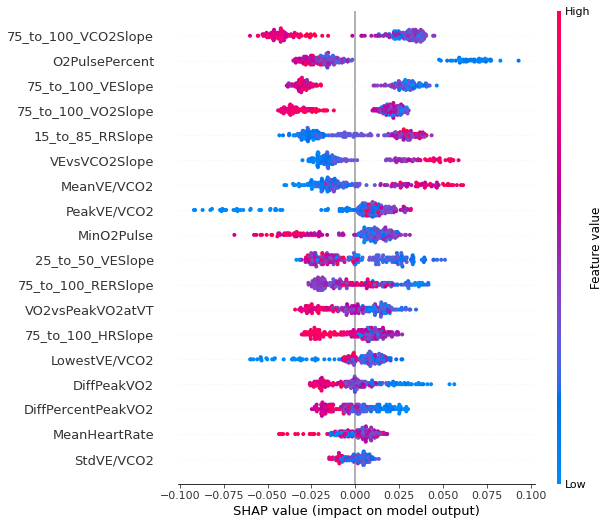

In [312]:
interpret_model(clf, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [183]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = MaxAbsScaler()
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="gini",max_features='sqrt',min_samples_leaf=0.035789473684210524,
                            min_samples_split=0.33789473684210525,n_estimators=100,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=300, train_size=0.8,smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.846 +- 0.059
Sensitivity: 0.749 +- 0.149
Specificity: 0.796 +- 0.070
Positive Predictive Values: 0.542 +- 0.131
Accuracy: 0.782 +- 0.058


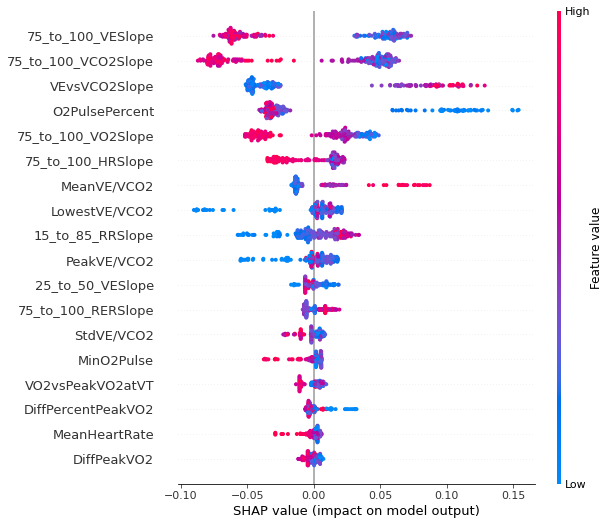

In [298]:
interpret_model(clf, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [300]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = MinMaxScaler()
clf = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="entropy",max_features='sqrt',min_samples_leaf=0.01,
                            min_samples_split=0.2442105263157895,n_estimators=10,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=200, train_size=0.8,smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.851 +- 0.053
Sensitivity: 0.779 +- 0.131
Specificity: 0.792 +- 0.066
Positive Predictive Values: 0.586 +- 0.109
Accuracy: 0.788 +- 0.054


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


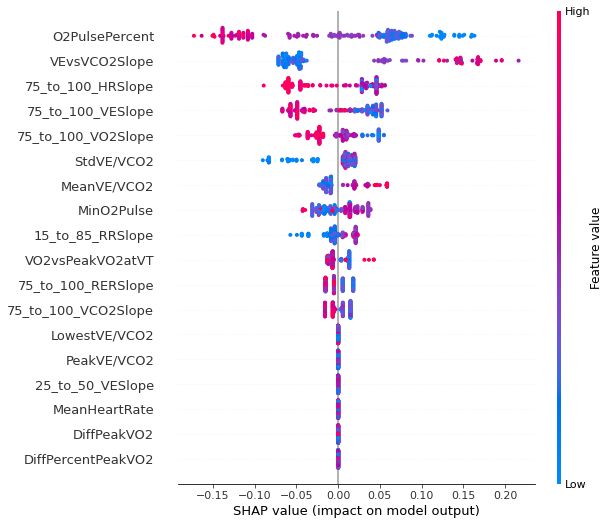

In [301]:
interpret_model(clf, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [302]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean=True, with_std=True)
clf = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="entropy",max_features='log2',min_samples_leaf=0.035789473684210524,
                            min_samples_split=0.15052631578947367,n_estimators=100,oob_score=True)
evaluate_model(clf,X, y, scaler_test, total_samples=200, train_size=0.8,smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.868 +- 0.050
Sensitivity: 0.811 +- 0.124
Specificity: 0.783 +- 0.073
Positive Predictive Values: 0.587 +- 0.109
Accuracy: 0.791 +- 0.057


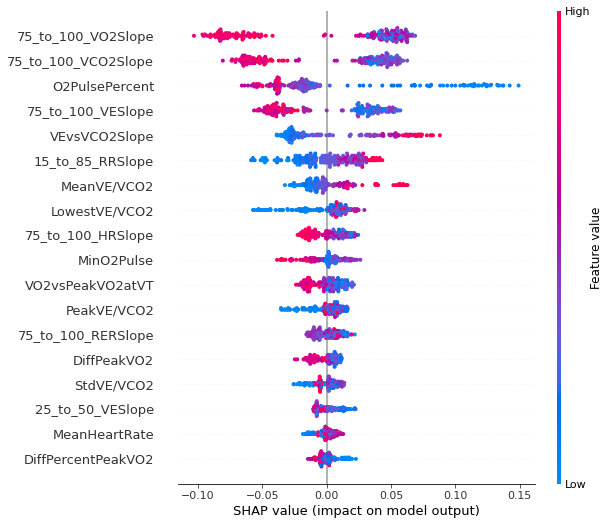

In [304]:
interpret_model(clf, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [184]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean=False, with_std=False)
clf = RandomForestClassifier(bootstrap=True, criterion="entropy",max_features=0.1,min_samples_leaf=0.01,
                            min_samples_split=0.01,n_estimators=400,oob_score=True)
best_model = evaluate_model(clf,X, y, scaler_test, total_samples=200, train_size=0.8, smote=True,best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.884 +- 0.049
Sensitivity: 0.775 +- 0.139
Specificity: 0.849 +- 0.063
Positive Predictive Values: 0.613 +- 0.141
Accuracy: 0.831 +- 0.052
49
The highest ppv model has the following:
AUC: 0.931
Sensitivity: 0.727
Specificity: 1.000
Positive Predictive Values: 1.000
Accuracy: 0.932



 96%|=================== | 421/438 [00:11<00:00]       

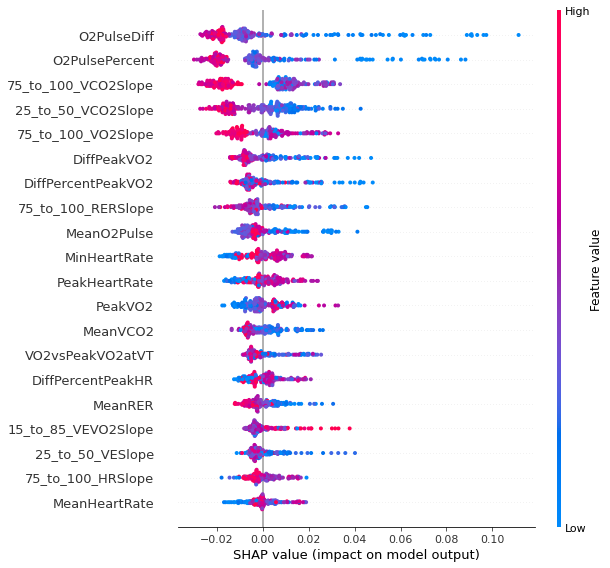

In [33]:
interpret_model(best_model, cardiac_data_df,cardiac_top_features,'CardiacLim')

### Best cardiac model so far

In [144]:
cardiac_top_features

array(['PeakHeartRate', 'MeanHeartRate', 'MinHeartRate', 'DiffPeakVO2',
       'DiffPercentPeakVO2', 'DiffPercentPeakHR', 'MeanRER', 'PeakRER',
       'LowestRER', 'PeakVO2', 'MeanVCO2', 'MeanO2Pulse', 'MinO2Pulse',
       'O2PulseDiff', 'O2PulsePercent', '75_to_100_VO2Slope',
       '75_to_100_HRSlope', '75_to_100_VCO2Slope', '75_to_100_RERSlope',
       '25_to_50_VCO2Slope', '25_to_50_VESlope', '15_to_85_VEVO2Slope',
       'VO2vsPeakVO2atVT'], dtype=object)

In [205]:
cardiac_top_features.shape

(23,)

In [185]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = StandardScaler(with_mean=False, with_std=False)
clf_selected = RandomForestClassifier(bootstrap=True, criterion="entropy",max_features=0.1,min_samples_leaf=0.01,
                            min_samples_split=0.01,n_estimators=400,oob_score=True)
clf_cardiac = evaluate_model(clf_selected,X, y, scaler_test, total_samples=200, train_size=0.8, smote=True,best_model=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.877 +- 0.054
Sensitivity: 0.744 +- 0.144
Specificity: 0.846 +- 0.067
Positive Predictive Values: 0.608 +- 0.138
Accuracy: 0.819 +- 0.056
181
The highest ppv model has the following:
AUC: 0.960
Sensitivity: 0.643
Specificity: 1.000
Positive Predictive Values: 1.000
Accuracy: 0.886



 95%|=================== | 417/438 [00:11<00:00]       

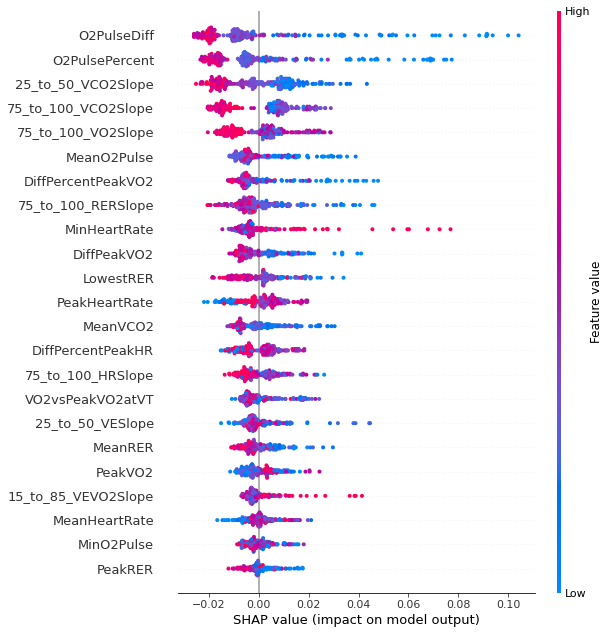

In [217]:
interpret_model(clf_cardiac, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [199]:
cardiac_top_features

array(['PeakHeartRate', 'MeanHeartRate', 'MinHeartRate', 'DiffPeakVO2',
       'DiffPercentPeakVO2', 'DiffPercentPeakHR', 'MeanRER', 'PeakRER',
       'LowestRER', 'PeakVO2', 'MeanVCO2', 'MeanO2Pulse', 'MinO2Pulse',
       'O2PulseDiff', 'O2PulsePercent', '75_to_100_VO2Slope',
       '75_to_100_HRSlope', '75_to_100_VCO2Slope', '75_to_100_RERSlope',
       '25_to_50_VCO2Slope', '25_to_50_VESlope', '15_to_85_VEVO2Slope',
       'VO2vsPeakVO2atVT'], dtype=object)

In [52]:
for feature in cardiac_top_features:
    print(i)
    i+=1
    shap.dependence_plot(feature, shap_values[1], cardiac_data_df[cardiac_top_features])

NameError: name 'i' is not defined

In [140]:
cardiac_data_df[cardiac_top_features].shape

(219, 23)

In [141]:
cardiac_data_df.sort_values(by=['StdVE/VCO2'], ascending=False)[['SessionId','StdVE/VCO2']]

KeyError: 'StdVE/VCO2'

In [138]:
cardiac_data_df_filt = cardiac_data_df.loc[cardiac_data_df.SessionId != 34].loc[cardiac_data_df.SessionId != 196.0].loc[cardiac_data_df.SessionId != 34.0].loc[cardiac_data_df.SessionId != 207.0].loc[cardiac_data_df.SessionId != 30.0]

AttributeError: 'DataFrame' object has no attribute 'SessionId'

In [187]:
explainer = shap.TreeExplainer(clf_cardiac)
shap_values = explainer.shap_values(cardiac_data_df_filt[cardiac_top_features])

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


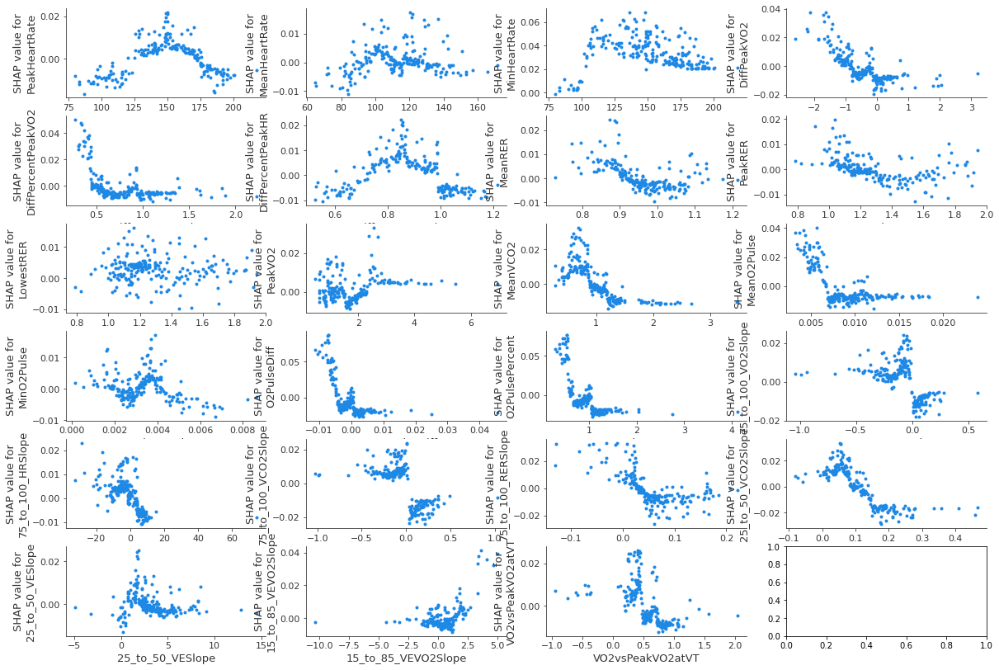

In [188]:
fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(20, 14))
axes = axes.ravel()
for i, col in enumerate(cardiac_top_features):
    shap.dependence_plot(col, shap_values[1], cardiac_data_df_filt[cardiac_top_features], ax=axes[i], show=False, interaction_index=None)

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


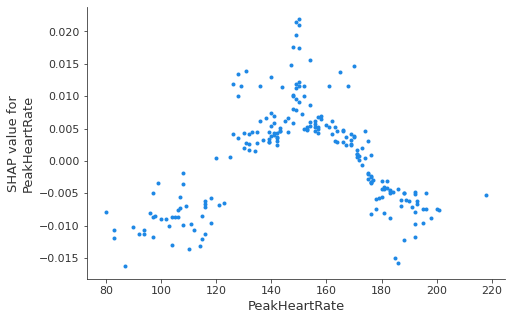

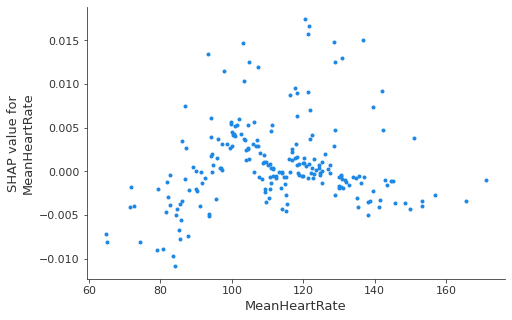

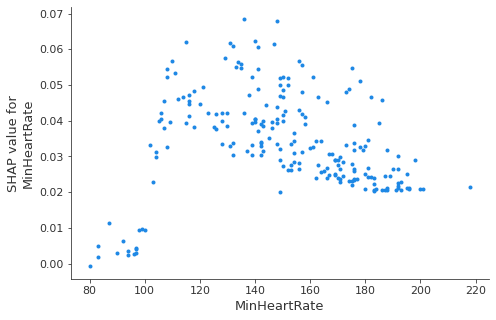

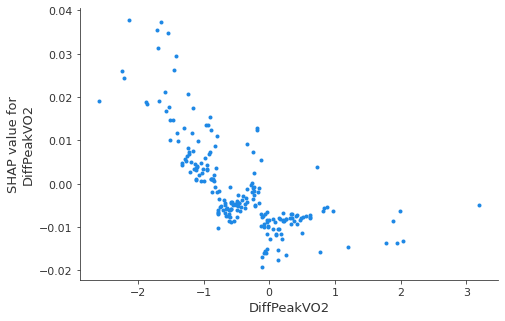

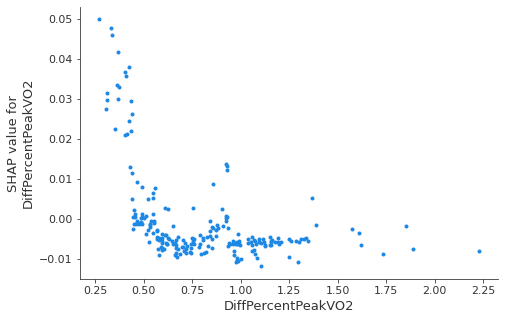

...

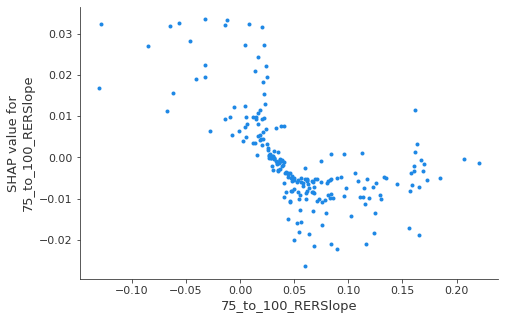

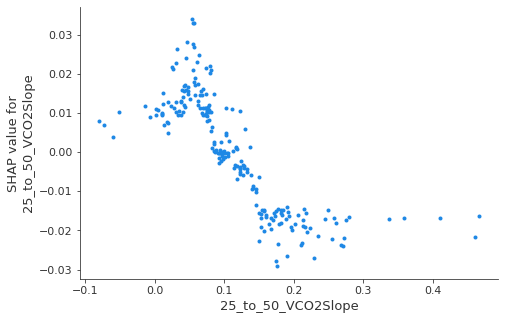

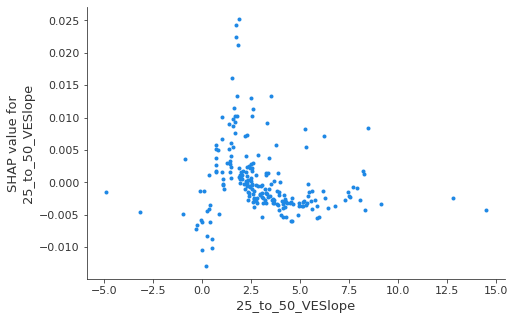

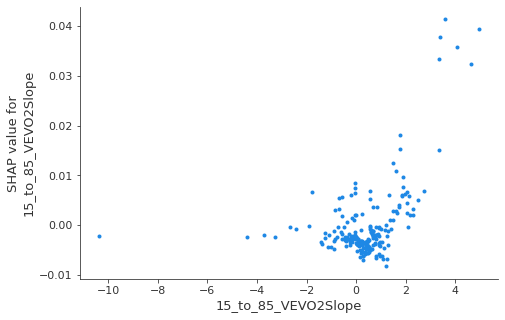

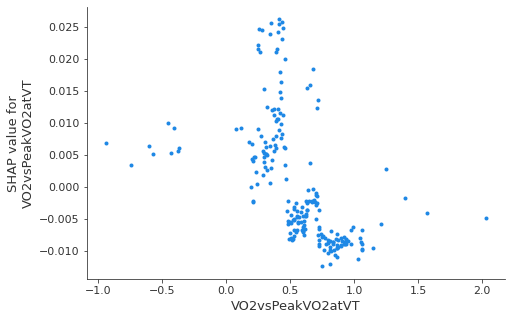

In [189]:
for feature in cardiac_top_features:
    shap.dependence_plot(feature, shap_values[1], cardiac_data_df_filt[cardiac_top_features], show=False, interaction_index=None)

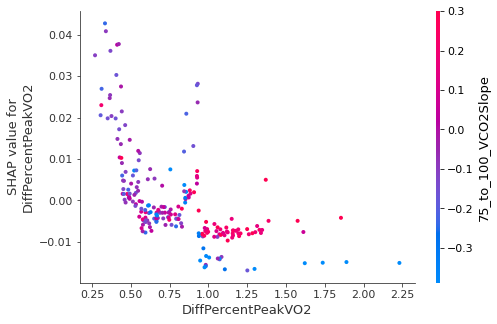

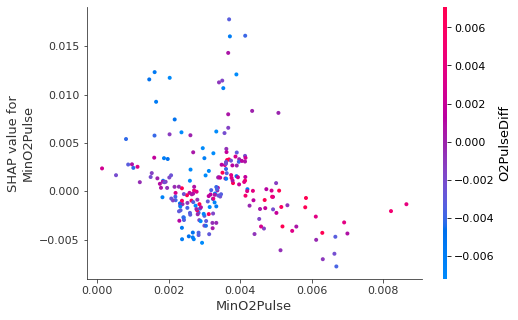

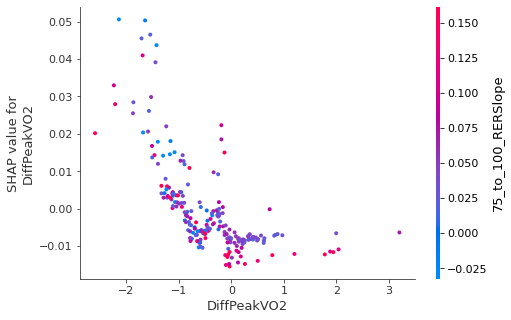

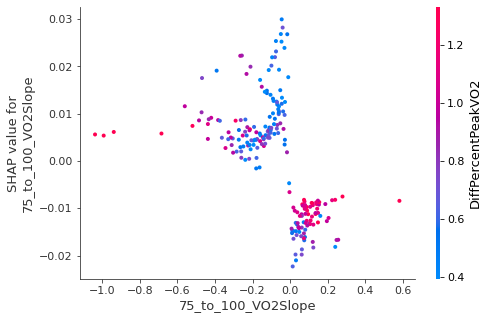

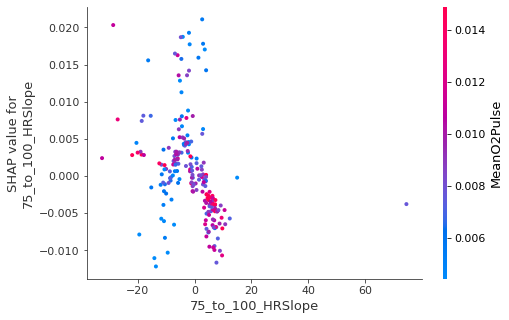

...

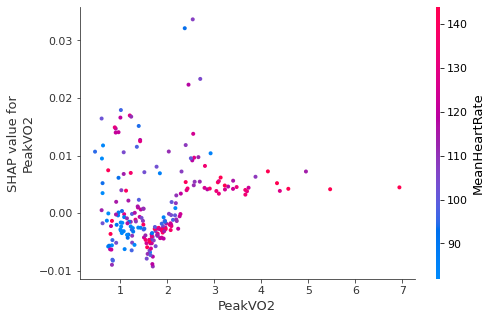

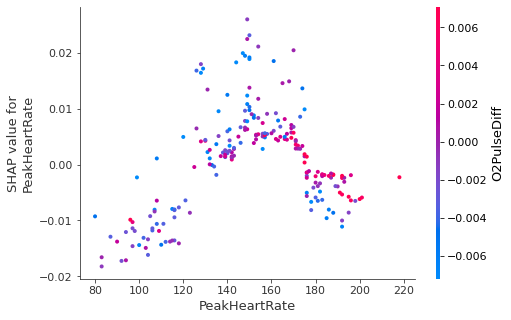

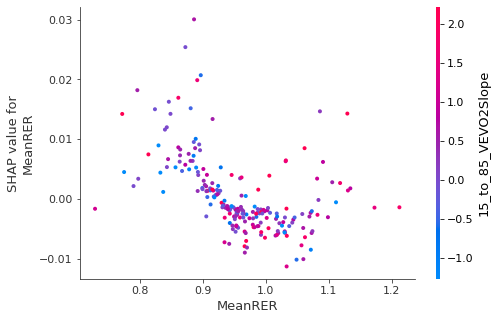

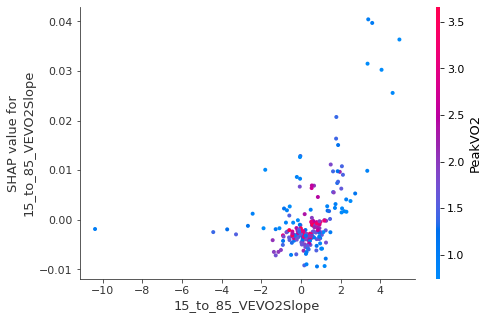

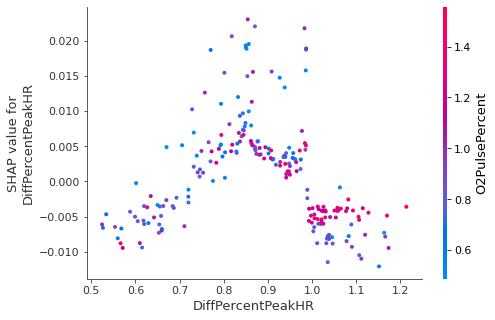

In [116]:
for feature in cardiac_top_features:
    shap.dependence_plot(feature, shap_values[1], cardiac_data_df_filt[cardiac_top_features], show=False)

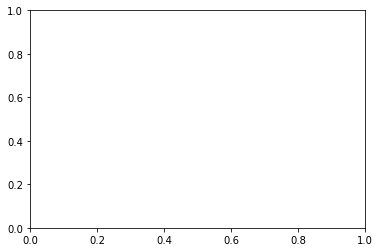

In [324]:
enumerate(cardiac_top_features)

In [325]:
cardiac_top_features

['DiffPercentPeakVO2',
 '75_to_100_VO2Slope',
 '75_to_100_HRSlope',
 'DiffPeakVO2',
 'VO2vsPeakVO2atVT',
 '75_to_100_VCO2Slope',
 'MeanVE/VCO2',
 '75_to_100_VESlope',
 'O2PulsePercent',
 '15_to_85_RRSlope',
 'MinO2Pulse',
 '25_to_50_VESlope',
 '75_to_100_RERSlope',
 'PeakVE/VCO2',
 'LowestVE/VCO2',
 'StdVE/VCO2',
 'MeanHeartRate',
 'VEvsVCO2Slope']

In [306]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = MinMaxScaler()
clf = RandomForestClassifier(bootstrap=False, class_weight={0:1,1:2}, criterion="gini",max_features=0.8,min_samples_leaf=0.01,
                            min_samples_split=0.01,n_estimators=400,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=200, train_size=0.8, smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.827 +- 0.067
Sensitivity: 0.664 +- 0.152
Specificity: 0.808 +- 0.069
Positive Predictive Values: 0.548 +- 0.129
Accuracy: 0.770 +- 0.059



 95%|=================== | 415/438 [00:11<00:00]       

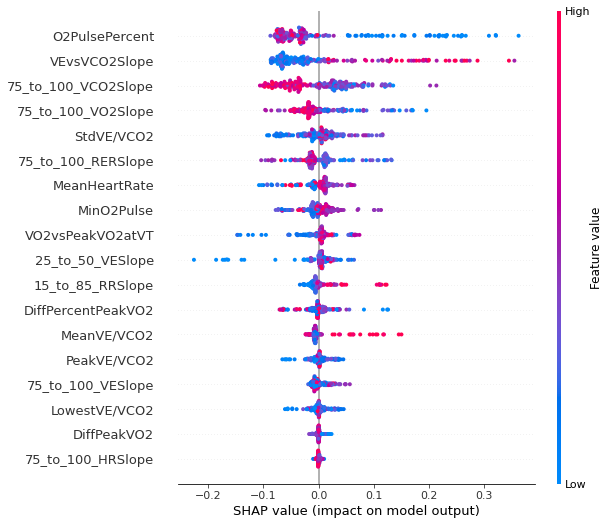

In [308]:
interpret_model(clf, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [ ]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = RobustScaler(quantile_range=[25,75], with_scaling=False,with_centering=True)
clf = RandomForestClassifier(bootstrap=True, class_weight={0:1,1:2}, criterion="gini",max_features=0.8,min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.01,n_estimators=20,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=200, train_size=0.8)

In [ ]:
interpret_model(clf, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [309]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler_test = RobustScaler(quantile_range=[25,75], with_scaling=False,with_centering=True)
clf = RandomForestClassifier(bootstrap=True, class_weight='balanced', criterion="gini",max_features=0.8,min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.01,n_estimators=20,oob_score=False)
evaluate_model(clf,X, y, scaler_test, total_samples=200, train_size=0.7,smote=True)

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_index

AUC: 0.856 +- 0.044
Sensitivity: 0.758 +- 0.120
Specificity: 0.787 +- 0.064
Positive Predictive Values: 0.576 +- 0.094
Accuracy: 0.777 +- 0.054


Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


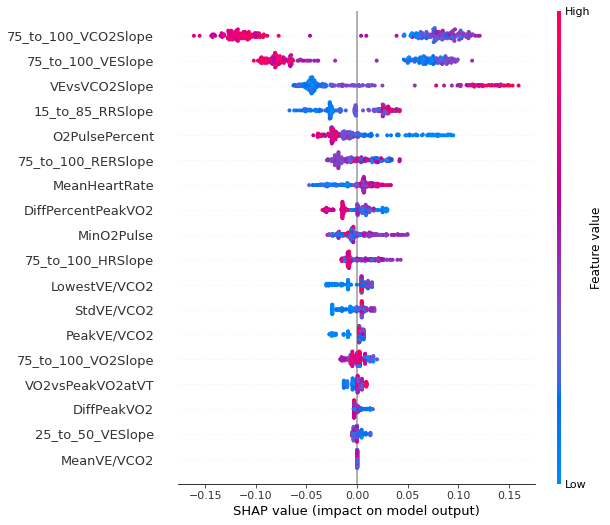

In [310]:
interpret_model(clf, cardiac_data_df,cardiac_top_features,'CardiacLim')

In [186]:
def evaluate_model(classifier, train_size=0.8, total_samples=100):
    X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
    scaler = StandardScaler(with_mean=True, with_std=True)
    scaler.fit(X)
    X_scaled = scaler.transform(X)
    auc_vals = np.array([])
    acc_vals = np.array([])
    specificity_vals = np.array([])
    sensitivity_vals = np.array([])
    ppv_vals = np.array([])
    for i in range(1,total_samples):
        X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=train_size)
        clf = classifier
        model = clf.fit(X_train,y_train)
        y_hat = model.predict_proba(X_test)
        fpr, tpr, thresholds = metrics.roc_curve(y_test, y_hat[:,1])
        tn, fp, fn, tp = confusion_matrix(y_test,np.round(y_hat[:,1])).ravel()
        specificity = tn / (tn+fp)
        sensitivity = tp / (tp+fn)
        ppv = tp/(tp+fp)
        auc_vals = np.append(metrics.auc(fpr, tpr),auc_vals)
        acc_vals = np.append(accuracy_score(y_test, np.round(y_hat[:,1])),acc_vals)
        specificity_vals = np.append(specificity,specificity_vals)
        sensitivity_vals = np.append(sensitivity,sensitivity_vals)
        ppv_vals = np.append(ppv,ppv_vals)
        pass
    print('AUC: {:.3f} +- {:.3f}'.format(np.mean(auc_vals), np.std(auc_vals)))
    print('Sensitivity: {:.3f} +- {:.3f}'.format(np.mean(sensitivity_vals), np.std(sensitivity_vals)))
    print('Specificity: {:.3f} +- {:.3f}'.format(np.mean(specificity_vals), np.std(specificity_vals)))
    print('Positive Predictive Values: {:.3f} +- {:.3f}'.format(np.mean(ppv_vals), np.std(ppv_vals)))
    print('Accuracy: {:.3f} +- {:.3f}'.format(np.mean(acc_vals), np.std(acc_vals)))
    pass

In [187]:
clf = SGDClassifier(alpha = 2.040895918367347, class_weight='balanced', eta0=0.0001,fit_intercept=True, l1_ratio=0.6938775510204082,
                   learning_rate='constant', loss='modified_huber', max_iter = 1000, penalty=None, power_t=0.8888, tol= 0.0001 )
evaluate_model(clf, total_samples=300, train_size=0.8)

AUC: 0.822 +- 0.061
Sensitivity: 0.826 +- 0.116
Specificity: 0.703 +- 0.081
Positive Predictive Values: 0.515 +- 0.105
Accuracy: 0.736 +- 0.061


In [ ]:
AUC
Sensitivity
Specificity
Positive Predictive Value
Accuracy


In [99]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X)
X_scaled = scaler.transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.8)

In [100]:
clf = RandomForestClassifier(bootstrap=False, class_weight="balanced", criterion="entropy",max_features='sqrt',min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.10368421052631578,n_estimators=25,oob_score=False)
#print(clf)
model = clf.fit(X_train,y_train)

# calculate accuracy
y_hat = model.predict(X_test)
acc = np.average(y_hat == y_test)
print('Accuracy:', acc)

Accuracy: 0.8181818181818182


In [101]:
confusion_matrix(y_test, np.round(y_hat))

array([[24,  6],
       [ 2, 12]], dtype=int64)

In [102]:
confusion_matrix(y_train, np.round(model.predict(X_train)))

array([[119,  11],
       [  3,  42]], dtype=int64)

In [103]:
13/16

0.8125

In [854]:
cardiac_shap_df = pd.DataFrame(X_train, columns=cardiac_top_features)
cardiac_shap_df['CardiacLim'] = y_train

In [855]:
import shap

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(df)

In [856]:
explainer = shap.TreeExplainer(model)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


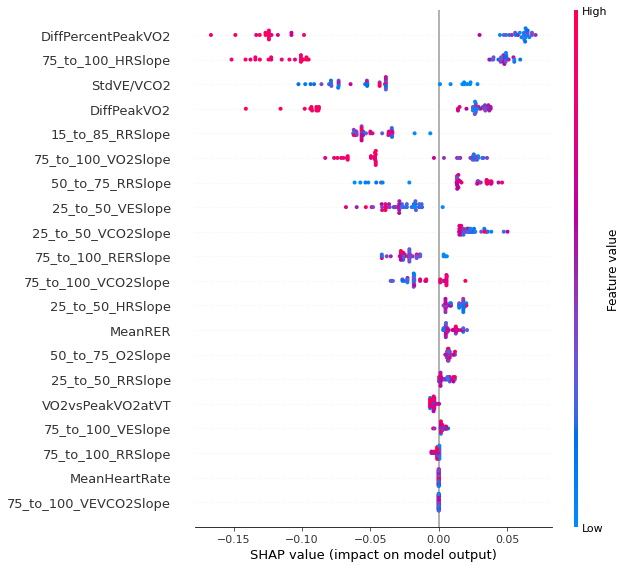

In [857]:
shap_values = explainer.shap_values(df)

# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[1], df, plot_type='dot')

In [876]:
cardiac_data_df.columns

Index(['Unnamed: 0', 'SessionId', 'PatientId', 'sex', 'age', 'BMI',
       'MaxVO2_EST', 'MaxO2_EST', 'PredictedMaxHR', 'CardiacLim',
       'PulmonaryLim', 'MuscleSkeletalLim', 'PeakHeartRate', 'MeanHeartRate',
       'MinHeartRate', 'StdHeartRate', 'LowestVE/VCO2', 'PeakVE/VCO2',
       'MeanVE/VCO2', 'StdVE/VCO2', 'PeakVO2Real', 'DiffPeakVO2', 'DiffPeakHR',
       'DiffPercentPeakVO2', 'DiffPercentPeakHR', 'DiffPeakRER', 'MeanRER',
       'PeakRER', 'LowestRER', 'MeanVE', 'PeakVE', 'LowestVE', 'MeanRR',
       'PeakRR', 'LowestRR', 'MeanVO2', 'PeakVO2', 'LowestVO2', 'MeanVCO2',
       'PeakVCO2', 'LowestVCO2', 'HRvsVO2Slope', 'VEvsVCO2Slope',
       'MeanO2Pulse', 'MaxO2Pulse', 'MinO2Pulse', 'StdO2Pulse', 'O2PulseDiff',
       'O2PulsePercent', '75_to_100_VO2Slope', '75_to_100_HRSlope',
       '75_to_100_VCO2Slope', '75_to_100_VESlope', '75_to_100_RERSlope',
       '75_to_100_RRSlope', '75_to_100_O2Slope', '75_to_100_VEVCO2Slope',
       '75_to_100_VEVO2Slope', '50_to_75_VO2Slope', 

In [877]:
cardiac_data_df.sort_values('LowestVE/VCO2',ascending=False)[['SessionId','LowestVE/VCO2', 'MeanVE', 'PeakVE']]

,SessionId,LowestVE/VCO2,MeanVE,PeakVE
25,34.0,16920.166016,41.493728,79.802628
197,207.0,247.523895,45.789761,96.134712
21,30.0,238.892441,44.999844,102.500529
199,209.0,131.533173,28.088489,68.726166
24,33.0,101.010895,32.839966,66.505417
...,...,...,...,...
51,60.0,29.992000,35.718291,61.600000
58,66.0,29.676000,41.641820,86.240000
55,64.0,29.270000,40.533272,72.952381
61,69.0,28.500000,35.633346,51.833333


In [878]:
cardiac_data_df_bkup = cardiac_data_df.copy()
#cardiac_data_df = cardiac_data_df_bkup.copy()

In [879]:
cardiac_data_df = cardiac_data_df.loc[cardiac_data_df.SessionId!=34]

In [880]:
model = clf.fit(cardiac_data_df[cardiac_top_features],cardiac_data_df['CardiacLim'])

In [ ]:
def interpret_model(model):
    explainer = shap.TreeExplainer(model, data=cardiac_data_df[cardiac_top_features])
    shap_values = explainer.shap_values(cardiac_data_df[cardiac_top_features])
    shap.summary_plot(shap_values[1], cardiac_data_df[cardiac_top_features], plot_type='dot', max_display=X.shape[1])
    pass

In [240]:
explainer = shap.TreeExplainer(model, data=cardiac_data_df[cardiac_top_features])

In [241]:
shap_values = explainer.shap_values(cardiac_data_df[cardiac_top_features])

## Cardiac model Interpretation

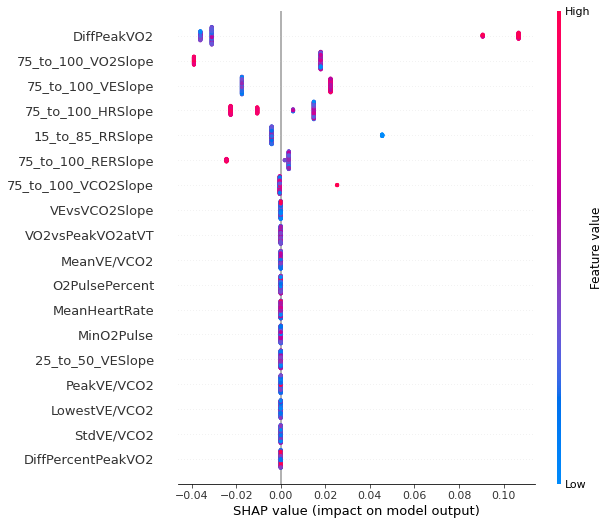

In [242]:
shap.summary_plot(shap_values[1], cardiac_data_df[cardiac_top_features], plot_type='dot')

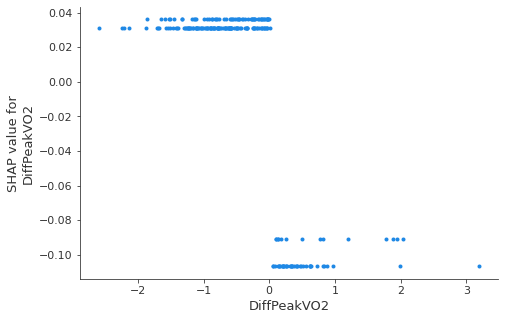

In [250]:
shap.dependence_plot('DiffPeakVO2', shap_values[0],  cardiac_data_df[cardiac_top_features], interaction_index=None)


In [245]:
cardiac_top_features[0]

'DiffPercentPeakVO2'

In [885]:
cardiac_top_features

['DiffPercentPeakVO2',
 '75_to_100_VO2Slope',
 '75_to_100_HRSlope',
 'DiffPeakVO2',
 'VO2vsPeakVO2atVT',
 '75_to_100_VCO2Slope',
 'MeanVE/VCO2',
 '75_to_100_VESlope',
 'O2PulsePercent',
 '15_to_85_RRSlope',
 'MinO2Pulse',
 '25_to_50_VESlope',
 '75_to_100_RERSlope',
 'PeakVE/VCO2',
 'LowestVE/VCO2',
 'StdVE/VCO2',
 'MeanHeartRate',
 'VEvsVCO2Slope']

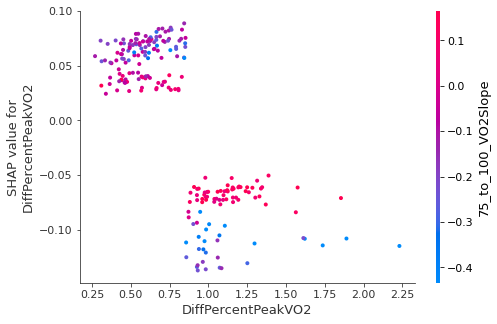

In [888]:
shap.dependence_plot(0, shap_values[1], cardiac_data_df[cardiac_top_features])

1


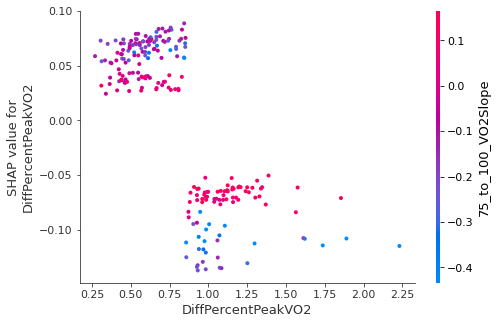

2


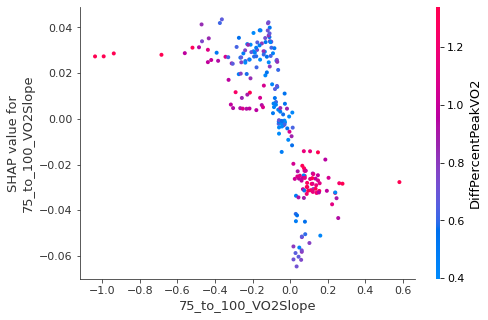

3


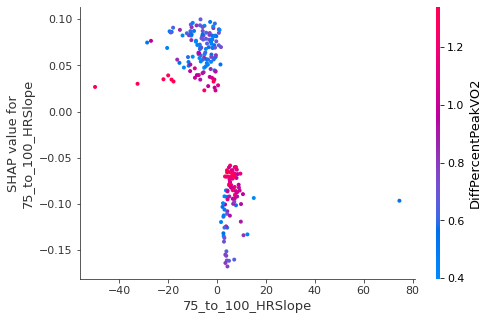

4


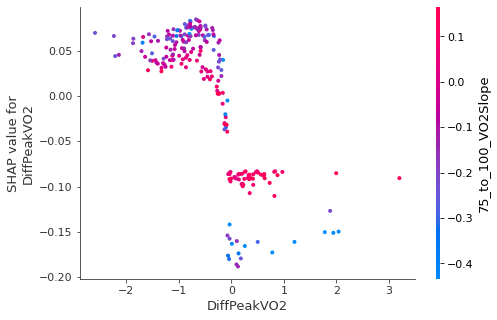

5


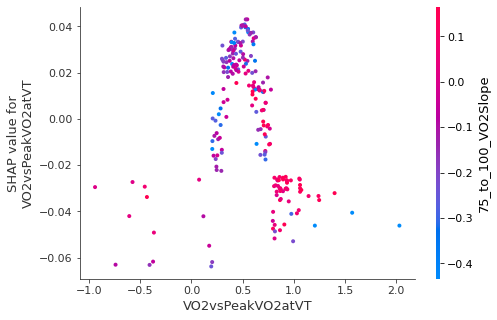

6


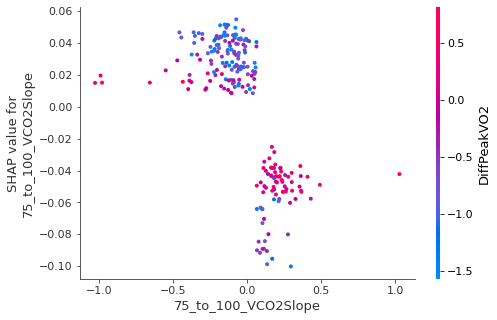

7


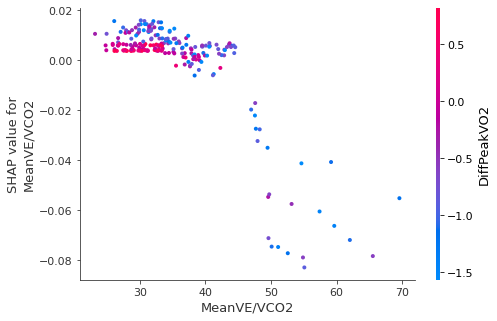

8


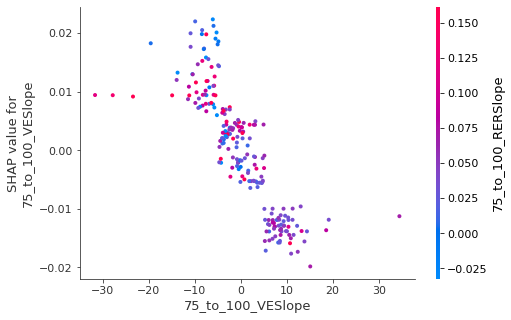

9


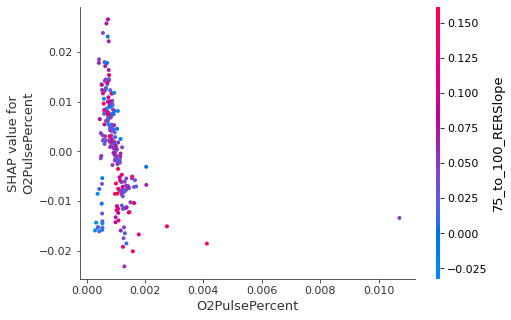

10


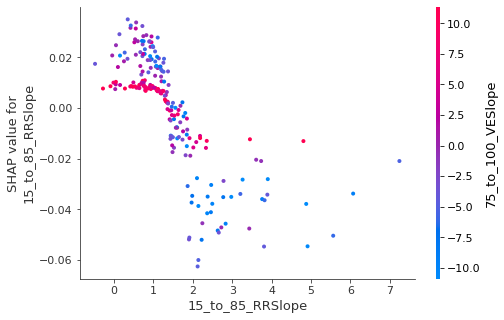

11


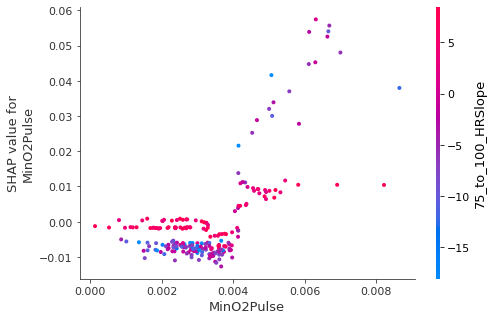

12


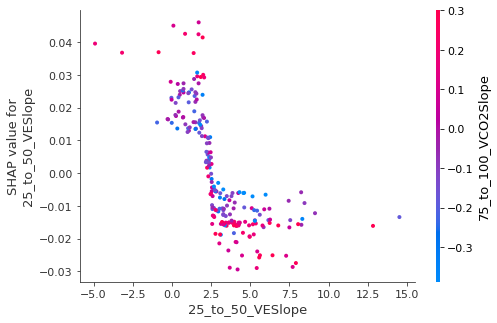

13


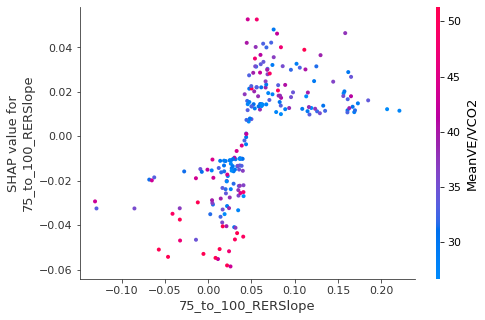

14


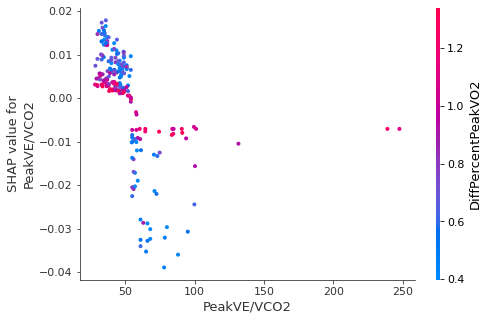

15


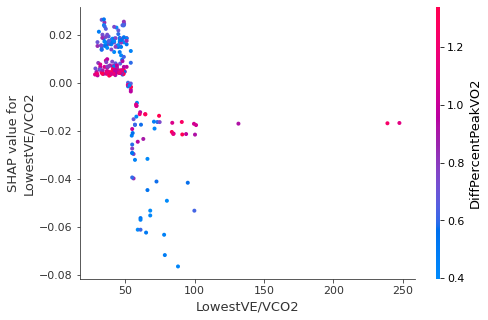

16


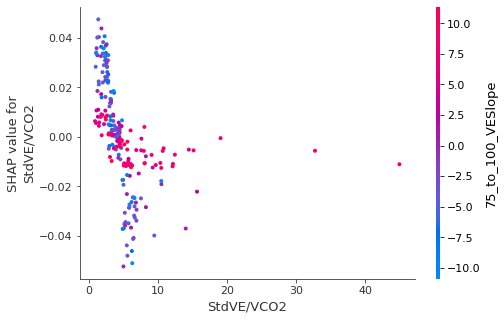

17


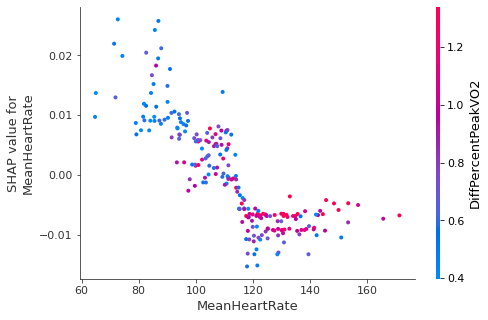

18


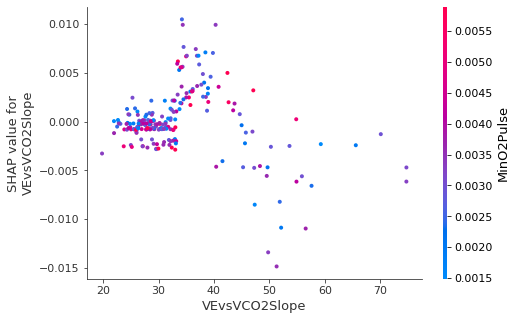

In [887]:
shap_values[1]
i =1
for feature in cardiac_top_features:
    print(i)
    i+=1
    shap.dependence_plot(feature, shap_values[1], cardiac_data_df[cardiac_top_features])

In [886]:
len(cardiac_top_features)

18

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.


<AxesSubplot:ylabel='Density'>

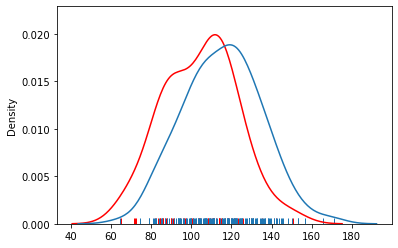

In [806]:
fig, ax = plt.subplots()
sns.distplot(cardiac_data_df.loc[cardiac_data_df.CardiacLim == 1]['MeanHeartRate'].values, rug=True, hist=False, ax=ax, color ='r')
sns.distplot(cardiac_data_df.loc[cardiac_data_df.CardiacLim == 0]['MeanHeartRate'].values, rug=True, hist=False, ax=ax)

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.


<AxesSubplot:ylabel='Density'>

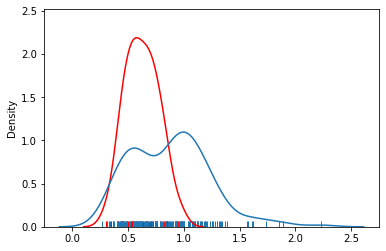

In [798]:
import seaborn as sns
fig, ax = plt.subplots()
sns.distplot(cardiac_data_df.loc[cardiac_data_df.CardiacLim == 1]['DiffPercentPeakVO2'].values, rug=True, hist=False, ax=ax, color ='r')
sns.distplot(cardiac_data_df.loc[cardiac_data_df.CardiacLim == 0]['DiffPercentPeakVO2'].values, rug=True, hist=False, ax=ax)

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.


<AxesSubplot:ylabel='Density'>

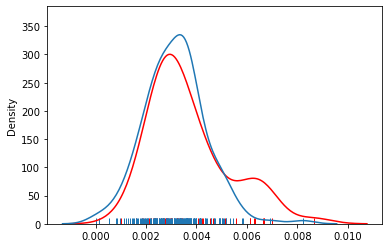

In [804]:
fig, ax = plt.subplots()
sns.distplot(cardiac_data_df.loc[cardiac_data_df.CardiacLim == 1]['MinO2Pulse'].values, rug=True, hist=False, ax=ax, color ='r')
sns.distplot(cardiac_data_df.loc[cardiac_data_df.CardiacLim == 0]['MinO2Pulse'].values, rug=True, hist=False, ax=ax)

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.


<AxesSubplot:ylabel='Density'>

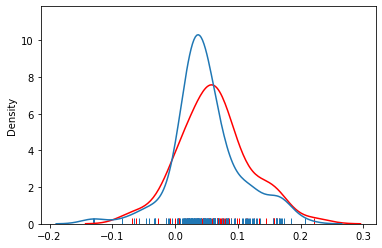

In [799]:
import seaborn as sns
fig, ax = plt.subplots()
sns.distplot(cardiac_data_df.loc[cardiac_data_df.CardiacLim == 1]['75_to_100_RERSlope'].values, rug=True, hist=False, ax=ax, color ='r')
sns.distplot(cardiac_data_df.loc[cardiac_data_df.CardiacLim == 0]['75_to_100_RERSlope'].values, rug=True, hist=False, ax=ax)

In [223]:
clf = LogisticRegression(C=0.8286427728546842, class_weight='balanced', multi_class='multinomial',
                        penalty='l1',solver='saga')
#print(clf)
linear_model = clf.fit(X_train,y_train)

The max_iter was reached which means the coef_ did not converge


In [228]:
y_hat = linear_model.predict_proba(X_test)[:,1]
confusion_matrix(y_test, np.round(y_hat))

array([[17, 11],
       [ 2, 14]], dtype=int64)

In [229]:
tn, fp, fn, tp = confusion_matrix(y_test, np.round(y_hat)).ravel()
specificity = tn / (tn+fp)
print(specificity)
print(tp / (tp+fn))

0.6071428571428571
0.875


In [232]:
14/25

0.56

In [225]:
y_hat = linear_model.predict_proba(X_train)[:,1]
confusion_matrix(y_train, np.round(y_hat))

array([[97, 35],
       [ 6, 37]], dtype=int64)

In [189]:
linear_model.coef_

array([[-2.28272584, -1.24867735,  0.        ,  0.        , -0.00907499,
        -0.3775488 ,  0.        ,  0.        ,  0.27928196,  0.        ,
         0.69858123,  0.        ,  0.        ,  0.        ,  0.99654373,
         0.        ,  0.        , -0.38479208, -0.61828959,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ]])

In [190]:
for i in range(0,len(cardiac_top_features)):
    if(linear_model.coef_[0][i]!=0):
        print('{} -> {}'.format(cardiac_top_features[i],linear_model.coef_[0][i]))

DiffPercentPeakVO2 -> -2.2827258378488993
75_to_100_VO2Slope -> -1.2486773529494437
75_to_100_VCO2Slope -> -0.009074985279849469
15_to_85_RRSlope -> -0.3775487980506551
75_to_100_RERSlope -> 0.27928196242125203
MeanRER -> 0.6985812264173396
VO2vsPeakVO2atVT -> 0.996543732925582
75_to_100_RRSlope -> -0.38479208227056527
MeanHeartRate -> -0.6182895890840711


In [213]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.8)

In [214]:
clf = DecisionTreeClassifier(class_weight='balanced', criterion='entropy',  min_samples_leaf=0.06157894736842105,
                            min_samples_split=0.056842105263157895, splitter='random')
model = clf.fit(X_train,y_train)

In [215]:
y_hat = model.predict_proba(X_test)[:,1]
confusion_matrix(y_test, np.round(y_hat))

array([[20,  8],
       [ 5, 11]], dtype=int64)

In [234]:
11/16

0.6875

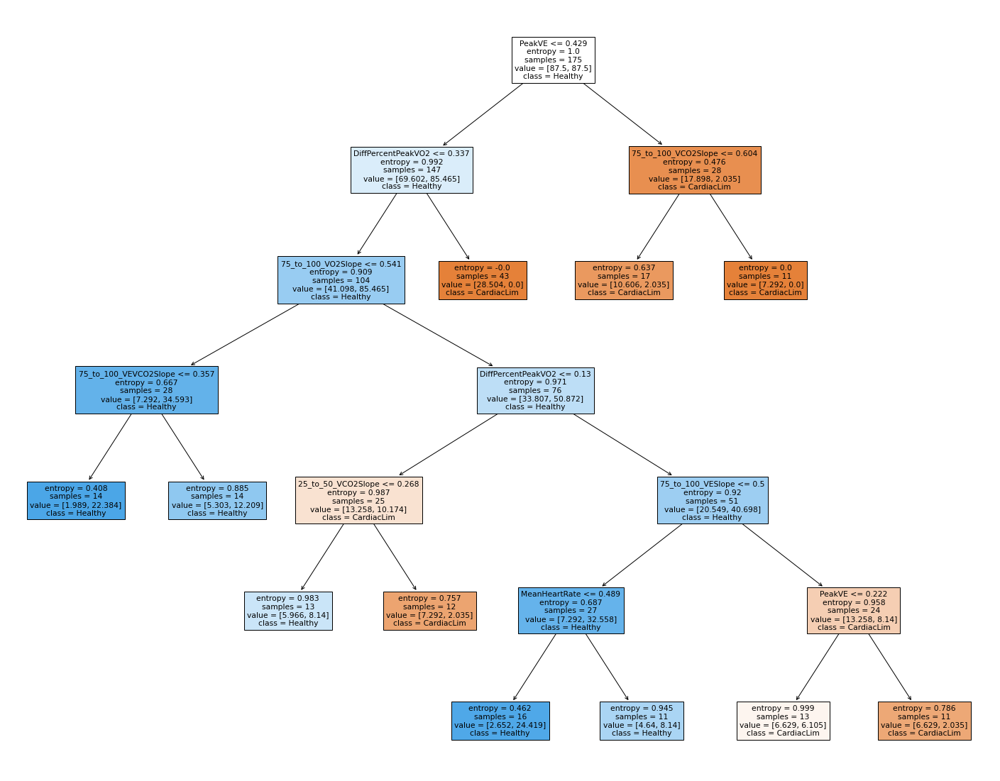

In [218]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(model, 
                   feature_names=df.columns,  
                   class_names=['CardiacLim','Healthy'],
                   filled=True)

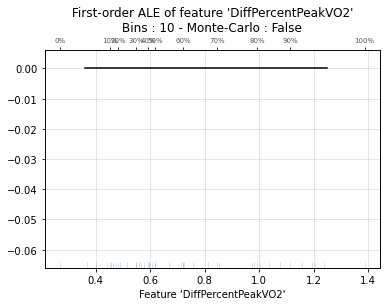

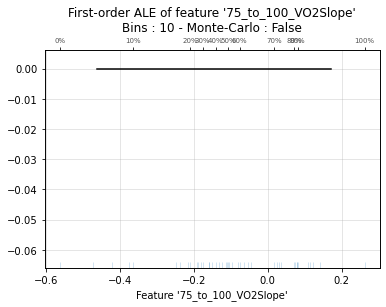

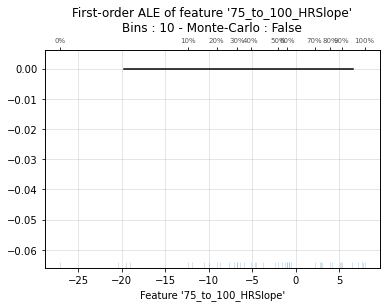

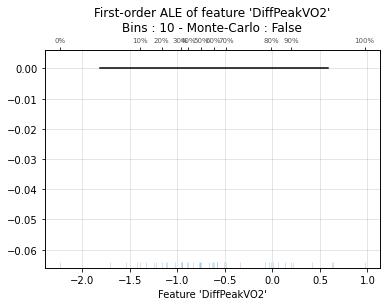

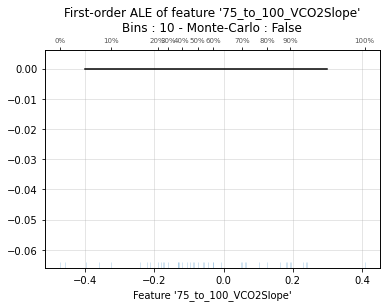

...

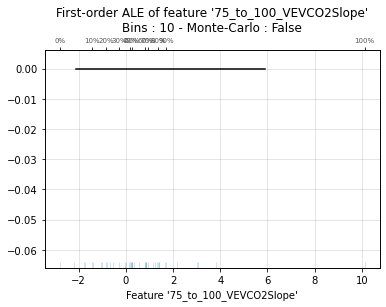

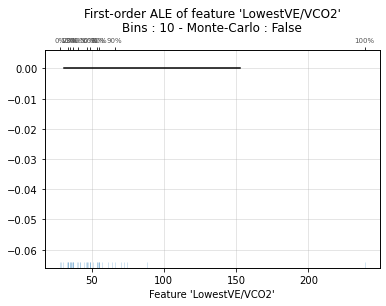

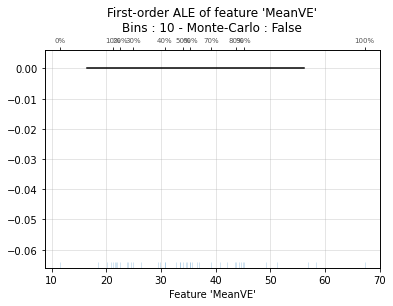

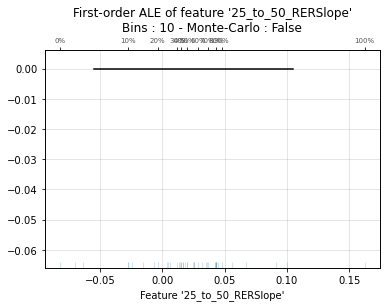

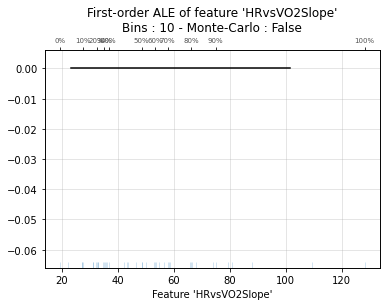

In [146]:
for feature in cardiac_top_features:
    ale_plot(linear_model, df, feature, monte_carlo=False)
    plt.show()

In [113]:
#df = pd.DataFrame(X_train, 
#             columns=cardiac_top_features)
shap_values = shap.TreeExplainer(model).shap_values(df)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


Exception: Model type not yet supported by TreeExplainer: <class 'sklearn.linear_model._logistic.LogisticRegression'>

In [152]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X)
X_scaled = scaler.transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.8)

In [153]:
#clf = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="gini",max_features=0.7,min_samples_leaf=0.01,
#                            min_samples_split= 0.15052631578947367,n_estimators=10,oob_score=True)
clf = SGDClassifier(alpha = 2.040895918367347, class_weight='balanced', eta0=0.0001,fit_intercept=True, l1_ratio=0.6938775510204082,
                   learning_rate='constant', loss='modified_huber', max_iter = 1000, penalty=None, power_t=0.8888, tol= 0.0001 )
#print(clf)
model = clf.fit(X_train,y_train)

# calculate accuracy
y_hat = model.predict_proba(X_test)[:,1]
#acc = np.average(y_hat == y_test)
#print('Accuracy:', acc)

In [154]:
confusion_matrix(y_test, np.round(y_hat))

array([[28,  5],
       [ 2,  9]], dtype=int64)

In [236]:
9/11

0.8181818181818182

In [155]:
y_hat = model.predict_proba(X_train)[:,1]
confusion_matrix(y_train, np.round(y_hat))

array([[99, 28],
       [ 7, 41]], dtype=int64)

In [156]:

y_hat = model.predict_proba(X_test)[:,1]
acc = np.average(np.round(y_hat) == y_test)
print('Accuracy:', acc)

Accuracy: 0.8409090909090909


In [161]:
df.columns

Index(['DiffPercentPeakVO2', '75_to_100_VO2Slope', '75_to_100_HRSlope',
       'DiffPeakVO2', '75_to_100_VCO2Slope', '15_to_85_RRSlope',
       '75_to_100_VESlope', '25_to_50_VESlope', '75_to_100_RERSlope',
       'StdVE/VCO2', 'MeanRER', '50_to_75_O2Slope', '50_to_75_RRSlope',
       '25_to_50_RRSlope', 'VO2vsPeakVO2atVT', '25_to_50_VCO2Slope',
       '25_to_50_HRSlope', '75_to_100_RRSlope', 'MeanHeartRate', 'PeakVE',
       '0_to_25_HRSlope', '75_to_100_VEVCO2Slope', 'LowestVE/VCO2', 'MeanVE',
       '25_to_50_RERSlope', 'HRvsVO2Slope'],
      dtype='object')

In [166]:
for i in range(0,len(model.coef_[0])):
    print('{:.3f} {}'.format(model.coef_[0][i], df.columns[i]))

-0.191 DiffPercentPeakVO2
-0.092 75_to_100_VO2Slope
-0.159 75_to_100_HRSlope
-0.153 DiffPeakVO2
-0.088 75_to_100_VCO2Slope
-0.200 15_to_85_RRSlope
-0.073 75_to_100_VESlope
0.014 25_to_50_VESlope
0.119 75_to_100_RERSlope
-0.006 StdVE/VCO2
0.173 MeanRER
-0.206 50_to_75_O2Slope
-0.100 50_to_75_RRSlope
0.119 25_to_50_RRSlope
0.222 VO2vsPeakVO2atVT
0.002 25_to_50_VCO2Slope
-0.009 25_to_50_HRSlope
-0.049 75_to_100_RRSlope
-0.122 MeanHeartRate
0.002 PeakVE
0.047 0_to_25_HRSlope
-0.094 75_to_100_VEVCO2Slope
-0.006 LowestVE/VCO2
-0.062 MeanVE
-0.002 25_to_50_RERSlope
0.045 HRvsVO2Slope


In [158]:
import shap
shap_values = shap.TreeExplainer(model).shap_values(df)
shap.summary_plot(shap_values[0], df, plot_type="bar")

Setting feature_perturbation = "tree_path_dependent" because no background data was given.
The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
The sklearn.ensemble.bagging module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.
The sklearn.ensemble.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.
The sklearn.ensemble.forest module is  deprecated in version 0.22 and will 

Exception: Model type not yet supported by TreeExplainer: <class 'sklearn.linear_model._stochastic_gradient.SGDClassifier'>

In [263]:
X, y = cardiac_data_df[cardiac_top_features].values, cardiac_data_df['CardiacLim'].values
scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X)
X_scaled = scaler.transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.8)

In [264]:
clf = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="entropy",max_features=0.9,min_samples_leaf=0.1131578947368421,
                            min_samples_split= 0.47842105263157897,n_estimators=200,oob_score=True)

model = clf.fit(X_train,y_train)

# calculate accuracy
y_hat = model.predict_proba(X_test)[:,1]

In [265]:
confusion_matrix(y_test, np.round(y_hat))

array([[20,  7],
       [ 1, 16]], dtype=int64)

In [267]:
16/23

0.6956521739130435

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


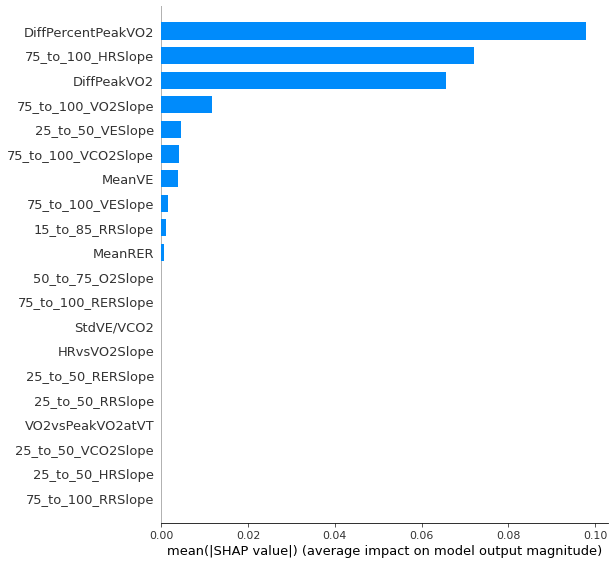

In [268]:
import shap
shap_values = shap.TreeExplainer(model).shap_values(df)
shap.summary_plot(shap_values[0], df, plot_type="bar")

In [269]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(model)

In [270]:
df = pd.DataFrame(X_train, 
             columns=cardiac_top_features)

In [271]:
df['CardiacLim']=y_train

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.


<AxesSubplot:ylabel='Density'>

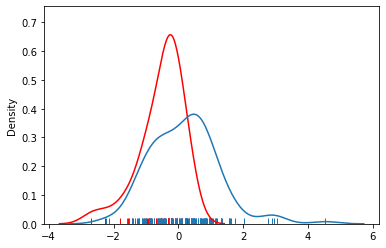

In [272]:
import seaborn as sns
fig, ax = plt.subplots()
sns.distplot(df.loc[df.CardiacLim == 1].DiffPeakVO2.values, rug=True, hist=False, ax=ax, color ='r')
sns.distplot(df.loc[df.CardiacLim == 0].DiffPeakVO2.values, rug=True, hist=False, ax=ax)

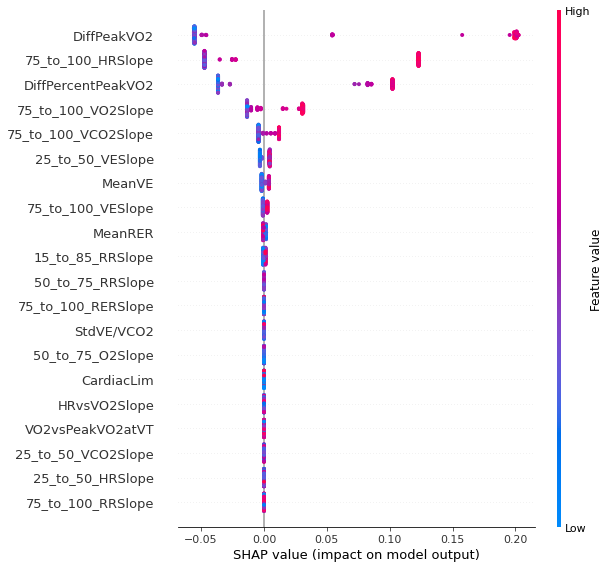

In [273]:
# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
shap_values = explainer.shap_values(df)

# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[0], df, plot_type='dot')

In [98]:
X_train.shape
df = pd.DataFrame(X_train, 
             columns=cardiac_top_features)

In [126]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
import plotly

In [127]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

from interpret import show
from interpret.blackbox import PartialDependence

pdp = PartialDependence(predict_fn=model.predict_proba, data=df)
pdp_global = pdp.explain_global()

show(pdp_global)

Computing partial dependence plots...


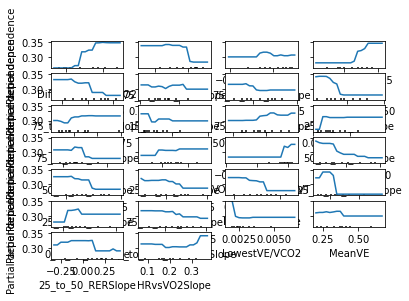

In [45]:
import matplotlib.pyplot as plt
from sklearn.inspection import partial_dependence
from sklearn.inspection import plot_partial_dependence

print('Computing partial dependence plots...')

features = cardiac_top_features
display = plot_partial_dependence(
       model, df, features,
       n_jobs=3, grid_resolution=20, n_cols=4
)

In [46]:
len(features)

26

Attempting to set identical bottom == top == 0.3445794915578618 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.3445794915578618 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.3445794915578618 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.34531890718099834 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.3445794915578618 results in singular transformations; automatically expanding.


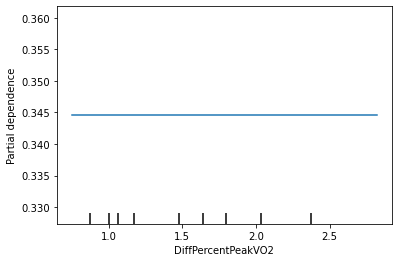

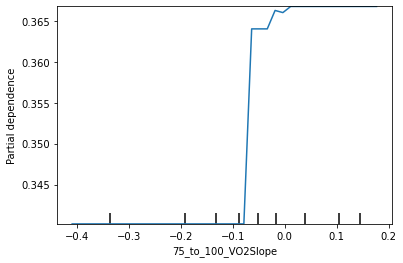

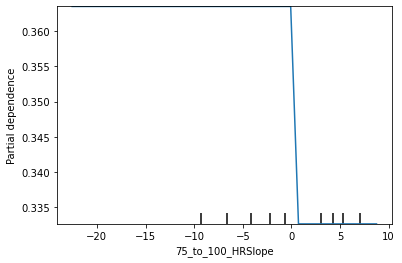

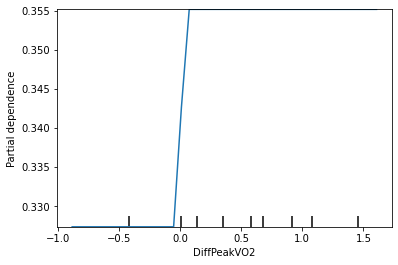

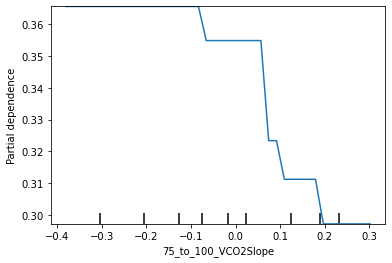

...

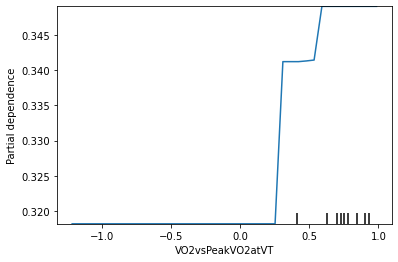

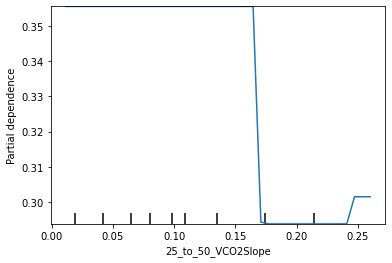

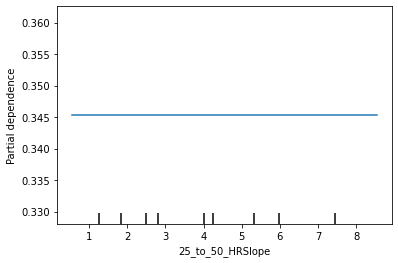

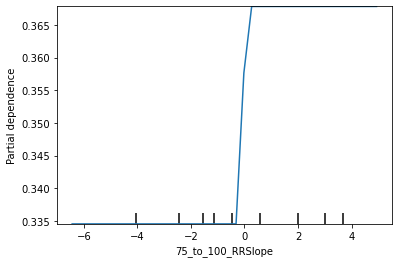

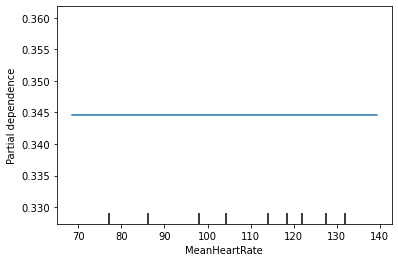

In [107]:
for i in range(0,19,1):
    #print(features[i:i+2])
    display = plot_partial_dependence(
       model, df, features[i:i+1],
       n_jobs=3, grid_resolution=40, n_cols=1)

In [48]:
import shap  # package used to calculate Shap values


In [174]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(model)

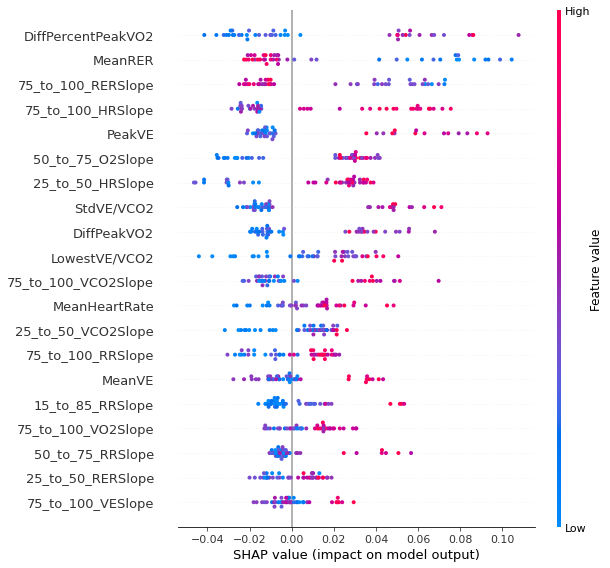

In [176]:
# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
shap_values = explainer.shap_values(df)

# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[0], df)

In [175]:
for colum in df.columns.values:
    print('**********')
    shap.plots.partial_dependence(colum, shap_values[0], df)

**********


TypeError: 'module' object is not callable

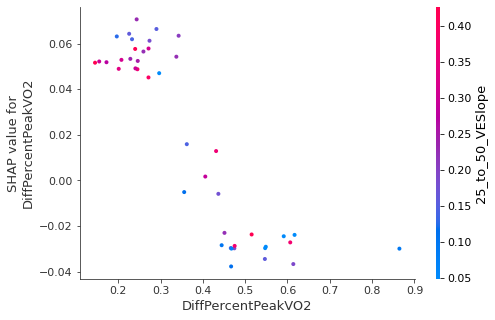

In [54]:
shap.dependence_plot("DiffPercentPeakVO2", shap_values[0], df)


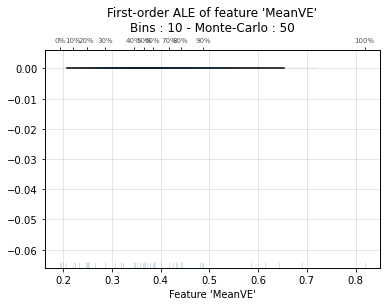

<AxesSubplot:title={'center':"First-order ALE of feature 'MeanVE'\nBins : 10 - Monte-Carlo : 50"}, xlabel="Feature 'MeanVE'">

In [29]:
from alepython import ale_plot
# Plots ALE of feature 'cont' with Monte-Carlo replicas (default : 50).
ale_plot(model, df, 'MeanVE', monte_carlo=True)

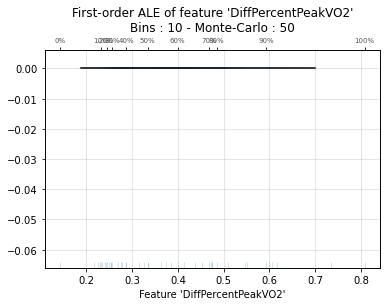

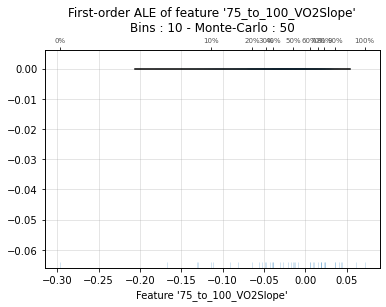

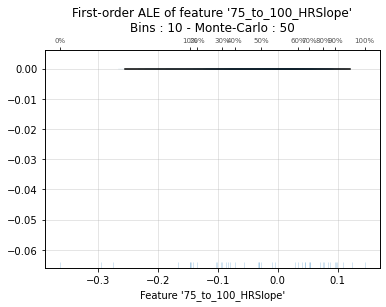

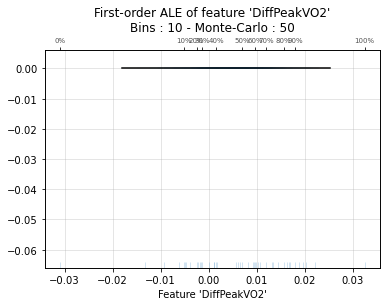

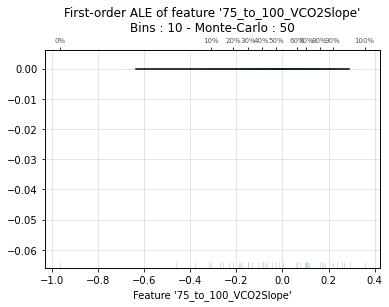

...

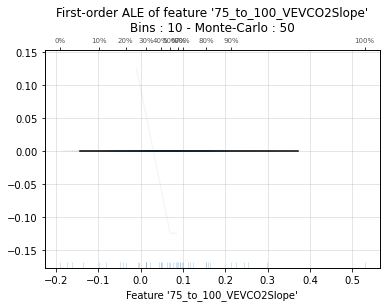

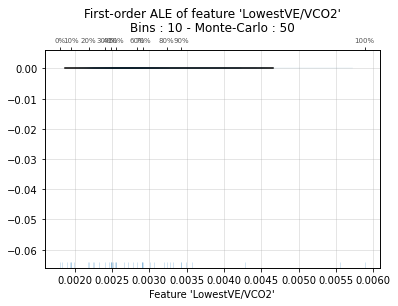

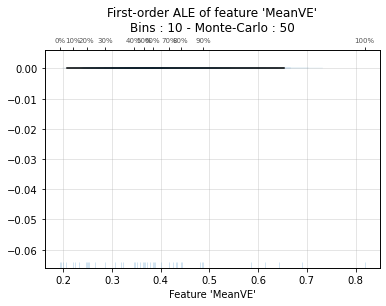

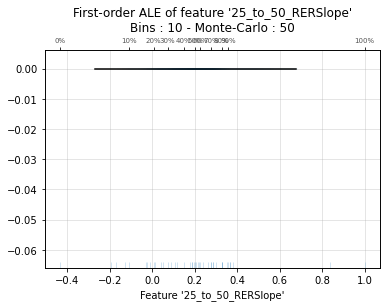

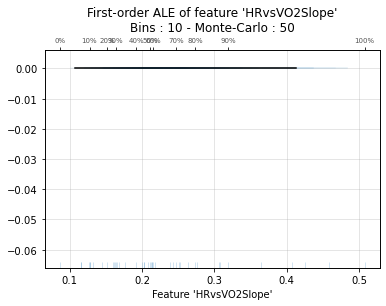

In [30]:
for feature in cardiac_top_features:
    ale_plot(model, df, feature, monte_carlo=True)
    plt.show()

Could not find feature named: DiffPercentPeakVO2 %
Could not find feature named: Cardiac Limitation


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

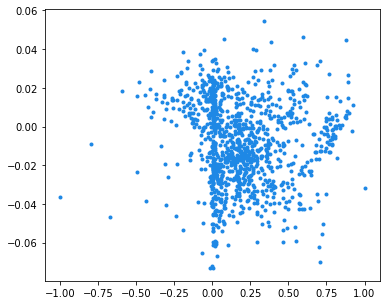

In [144]:
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(model)

# calculate shap values. This is what we will plot.
shap_values = explainer.shap_values(df)

# make plot.
shap.dependence_plot('DiffPercentPeakVO2 %', shap_values[1], df, interaction_index="Cardiac Limitation")

## Pulmonary Interpretation

In [41]:
pulmonary_top_features=['VEvsVCO2Slope','O2PulsePercent','O2PulseDiff','MeanVE/VCO2','PeakRR','LowestRR','MeanO2Pulse','15_to_85_VESlope','75_to_100_VESlope',
'75_to_100_VEVO2Slope','MaxO2Pulse','75_to_100_VCO2Slope','LowestVE','PeakVE','MeanVE','25_to_50_VCO2Slope','50_to_75_HRSlope','75_to_100_RRSlope']

In [42]:
pulmonary_top_features=['O2PulseDiff','75_to_100_VCO2Slope','VEvsVCO2Slope','0_to_25_HRSlope','PeakRR','75_to_100_VESlope','15_to_85_VESlope','MaxO2_EST','75_to_100_VO2Slope',
'50_to_75_HRSlope','0_to_25_VO2Slope','50_to_75_RRSlope','MeanVE/VCO2','75_to_100_HRSlope','25_to_50_VCO2Slope','PeakVE','0_to_25_VCO2Slope','75_to_100_O2Slope','50_to_75_VESlope']

In [43]:
pulmonary_data_df = pd.read_csv('./data/PulmonaryData.csv')
pulmonary_data_df.head()

,MaxVO2_EST,PredictedMaxHR,PulmonaryLim,PeakHeartRate,MeanHeartRate,MinHeartRate,StdHeartRate,LowestVE/VCO2,PeakVE/VCO2,MeanVE/VCO2,...,15_to_85_RERSlope,15_to_85_RRSlope,15_to_85_O2Slope,15_to_85_VEVCO2Slope,15_to_85_VEVO2Slope,VTTime,VO2atVT,PercentTimeAfterVT,VO2vsPeakVO2atVT,HasAnaerobicThresholdMean
0,2.319521,180.0,0,142,100.290323,142,22.140597,74.787857,74.787857,32.984937,...,0.003380,0.792017,0.876982,-1.683390,-1.271413,14.5,1.649219,0.935484,0.950917,True
1,2.657210,159.7,0,158,112.407407,158,26.040224,61.337563,61.337563,32.726303,...,0.010742,0.923496,0.620151,-0.658709,-0.235441,11.5,1.384651,0.851852,0.903200,True
2,1.444581,196.8,0,201,153.351351,201,38.968606,54.171436,54.171436,31.615255,...,0.029500,1.603876,0.745565,-0.901216,-0.002684,13.0,2.935024,0.702703,0.910831,True
3,2.293821,196.1,0,196,148.378378,196,35.250725,43.154690,43.154690,33.379573,...,0.023647,3.902252,0.766091,-0.073291,0.689589,12.0,3.601732,0.648649,0.831045,True
4,1.933529,197.5,0,192,149.962963,192,36.181110,47.803135,47.803135,32.515165,...,0.035189,3.262936,1.006688,-0.620017,0.499574,3.5,1.229809,0.259259,0.392414,True


In [44]:
X, y = pulmonary_data_df[pulmonary_top_features].values, pulmonary_data_df['PulmonaryLim'].values
scaler = MaxAbsScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_train_pulm, X_test_pulm, y_train_pulm, y_test_pulm = train_test_split(X_scaled, y, test_size=0.8)

In [45]:
from interpret import show
from interpret.blackbox import PartialDependence
import numpy as np
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import Normalizer
from sklearn import metrics
from sklearn.metrics import precision_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import recall_score
import xgboost as xgb

from numpy import loadtxt
from xgboost import XGBClassifier

In [46]:
scaler = StandardScaler(with_mean =True, with_std=False)
        #scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X)
X_scaled = scaler.transform(X)
        #print('X',X_scaled)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.70,random_state=i)
        #clf = RandomForestClassifier(bootstrap=True, class_weight="balanced", criterion="gini",max_features=0.7,min_samples_leaf=0.01,
        #                            min_samples_split=0.15052631578947367,n_estimators=100,oob_score=True, random_state=i)
clf = RandomForestClassifier(bootstrap=False, class_weight='balanced', criterion='entropy', max_features='log2',
                             min_samples_leaf=0.01, min_samples_split=0.29105263157894734,n_estimators=25,oob_score=False)
model_pulm = clf.fit(X_train,y_train)

In [47]:
X_train.shape
pulm_df = pd.DataFrame(X_train, 
             columns=pulmonary_top_features)

Attempting to set identical bottom == top == 0.28615160593223365 results in singular transformations; automatically expanding.


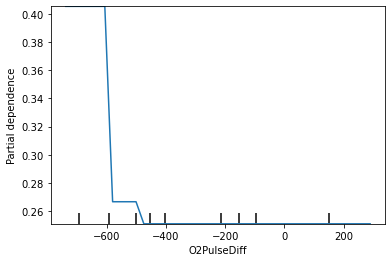

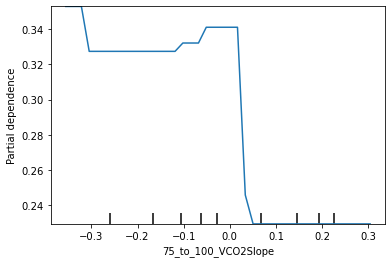

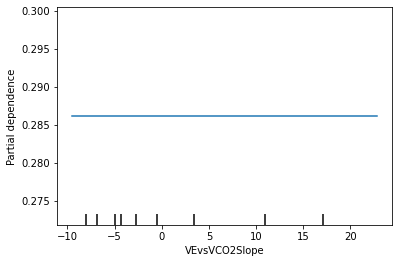

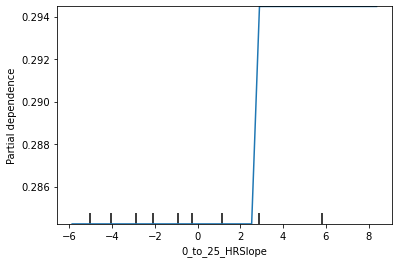

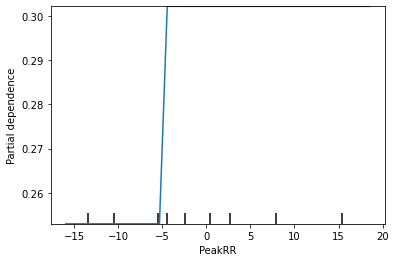

...

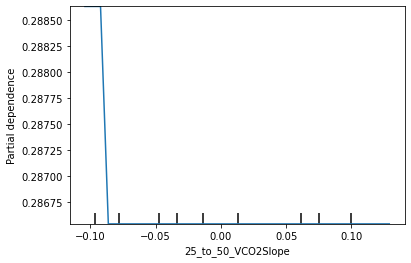

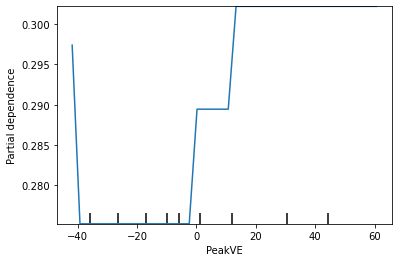

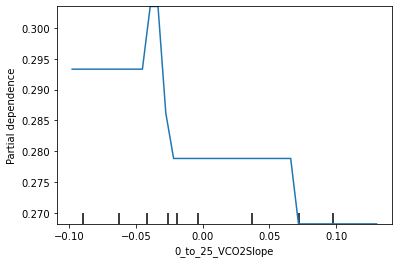

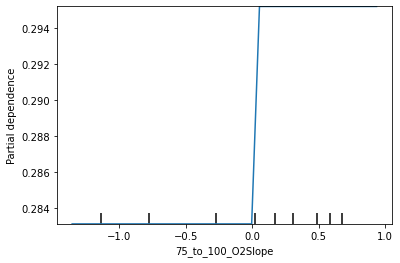

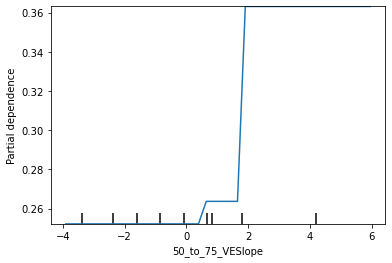

In [48]:
for i in range(0,len(pulmonary_top_features),1):
    #print(features[i:i+2])
    display = plot_partial_dependence(
       model_pulm, pulm_df, pulmonary_top_features[i:i+1],
       n_jobs=3, grid_resolution=40, n_cols=1)

In [49]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(model_pulm)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [50]:
# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
shap_values = explainer.shap_values(pulm_df)

# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[1], model_pulm)

AttributeError: 'RandomForestClassifier' object has no attribute 'shape'

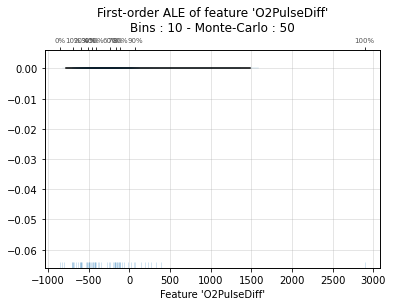

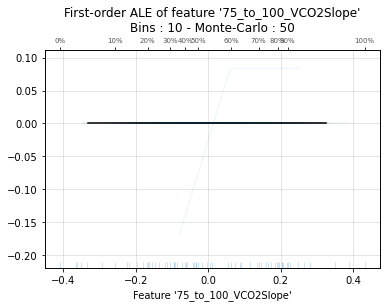

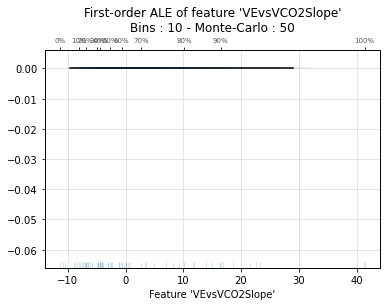

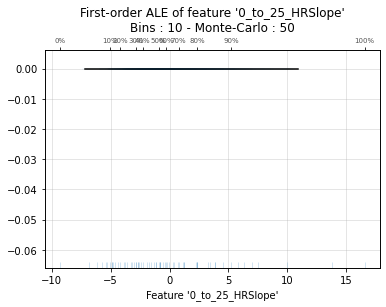

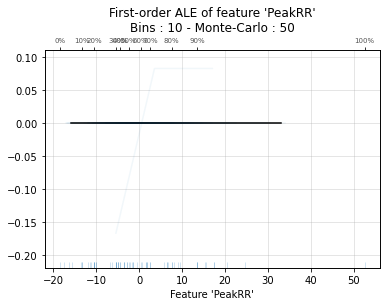

...

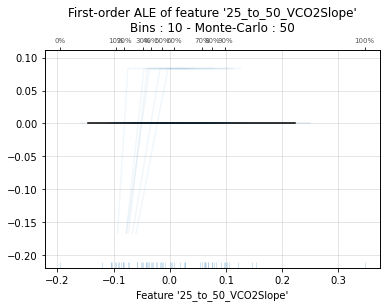

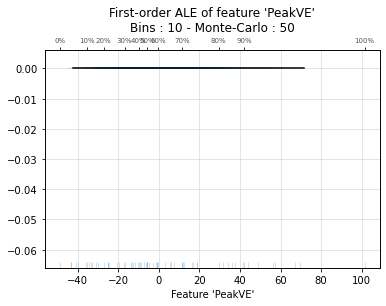

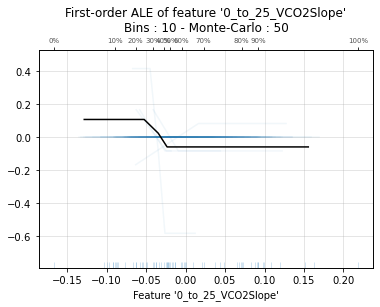

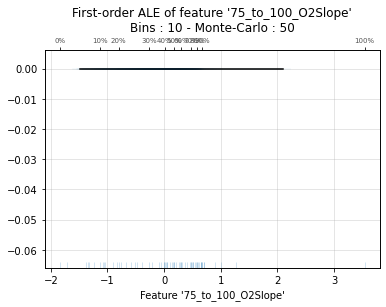

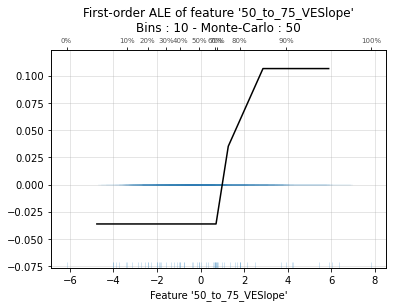

In [51]:
for feature in pulmonary_top_features:
    ale_plot(model_pulm, pulm_df, feature, monte_carlo=True)
    plt.show()

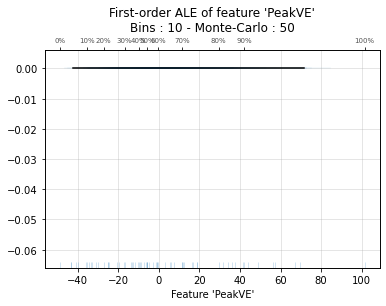

<AxesSubplot:title={'center':"First-order ALE of feature 'PeakVE'\nBins : 10 - Monte-Carlo : 50"}, xlabel="Feature 'PeakVE'">

In [28]:
from alepython import ale_plot
# Plots ALE of feature 'cont' with Monte-Carlo replicas (default : 50).
ale_plot(model_pulm, pulm_df, 'PeakVE', monte_carlo=True)

In [189]:
shap_values

[array([[-0.04160969, -0.01469583, -0.04517861, ..., -0.00769299,
          0.        , -0.07780289],
        [ 0.03076596,  0.01016317,  0.02902977, ..., -0.00261493,
          0.        ,  0.17685901],
        [ 0.02689124, -0.02129385, -0.05033649, ..., -0.00735168,
          0.        , -0.07706234],
        ...,
        [-0.03190037, -0.02129385, -0.04484877, ..., -0.00769299,
          0.        , -0.07298955],
        [ 0.03179946,  0.00853924,  0.02130541, ..., -0.00212891,
          0.        ,  0.11744396],
        [ 0.03283258,  0.01016317,  0.02902977, ..., -0.00281843,
          0.        ,  0.18422516]]),
 array([[ 0.04160969,  0.01469583,  0.04517861, ...,  0.00769299,
          0.        ,  0.07780289],
        [-0.03076596, -0.01016317, -0.02902977, ...,  0.00261493,
          0.        , -0.17685901],
        [-0.02689124,  0.02129385,  0.05033649, ...,  0.00735168,
          0.        ,  0.07706234],
        ...,
        [ 0.03190037,  0.02129385,  0.04484877, ...,  0.00769299,
          0.        ,  0.07298955],
        [-0.03179946, -0.00853924, -0.02130541, ...,  0.00212891,
          0.        , -0.11744396],
        [-0.03283258, -0.01016317, -0.02902977, ...,  0.00281843,
          0.        , -0.18422516]])]

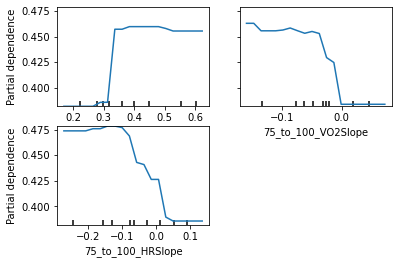

In [95]:
display = plot_partial_dependence(
       model, df, ["DiffPercentPeakVO2","75_to_100_VO2Slope","75_to_100_HRSlope"],
       n_jobs=3, grid_resolution=20, n_cols=2
)

In [82]:
display.figure_.suptitle(
    'Partial dependence of house value on non-location features\n'
    'for the California housing dataset, with MLPRegressor'
)
display.figure_.subplots_adjust(hspace=0.3)

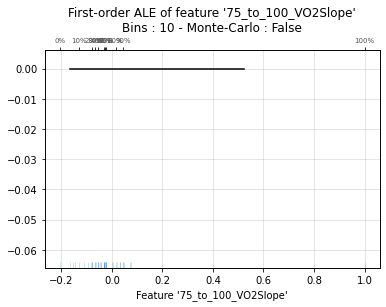

<AxesSubplot:title={'center':"First-order ALE of feature '75_to_100_VO2Slope'\nBins : 10 - Monte-Carlo : False"}, xlabel="Feature '75_to_100_VO2Slope'">

In [64]:
ale_plot(model, df, '75_to_100_VO2Slope')

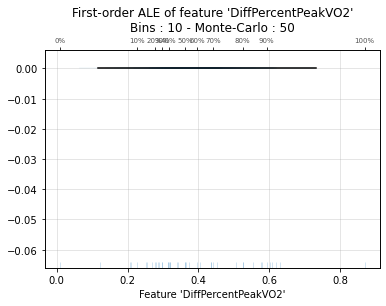

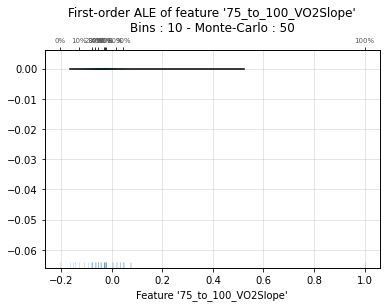

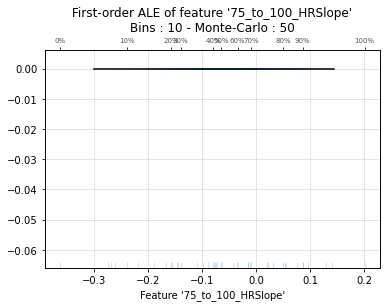

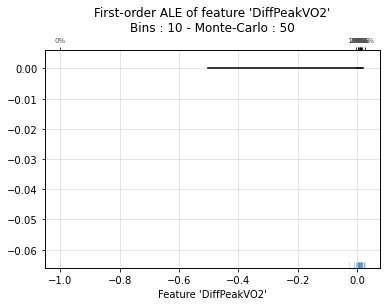

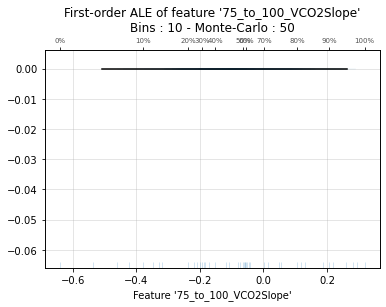

...

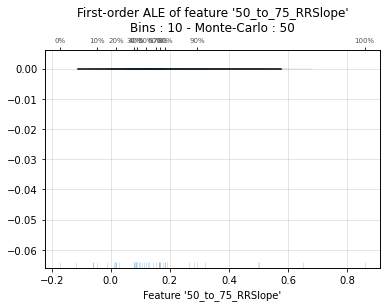

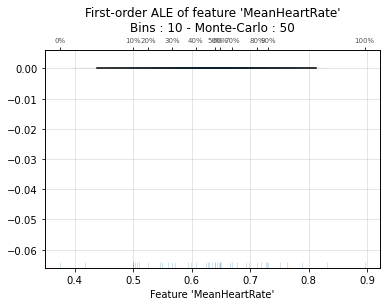

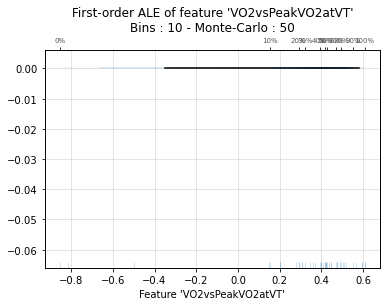

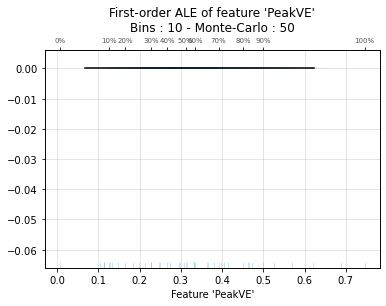

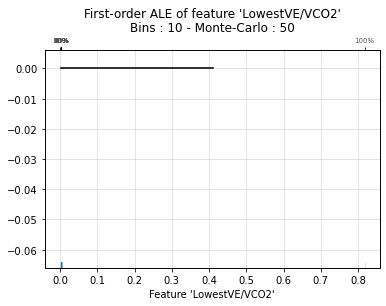

In [63]:
for feature in cardiac_top_features:
    ale_plot(model, df, feature, monte_carlo=True)

In [109]:
X_train.shape
df = pd.DataFrame(X_train, 
             columns=cardiac_top_features)

In [33]:
df

,DiffPercentPeakVO2,75_to_100_VO2Slope,75_to_100_HRSlope,DiffPeakVO2,75_to_100_VCO2Slope,75_to_100_VESlope,15_to_85_RRSlope,75_to_100_RERSlope,25_to_50_VESlope,MeanRER,StdVE/VCO2,25_to_50_VCO2Slope,50_to_75_O2Slope,75_to_100_RRSlope,50_to_75_RRSlope,MeanHeartRate,VO2vsPeakVO2atVT,PeakVE,LowestVE/VCO2
0,0.240674,0.023390,0.084897,-0.003107,0.156591,0.257327,0.111125,0.175193,0.293907,0.772049,0.001951,0.388972,0.007307,0.230570,1.233568e-01,0.744624,0.470227,0.361483,0.003125
1,0.355912,-0.052570,-0.009383,0.010193,-0.007145,0.011107,0.127871,0.732583,0.117106,0.798401,0.000576,0.132775,0.047251,-0.066520,1.410116e-01,0.588093,0.455729,0.307103,0.002128
2,0.508671,-0.039043,-0.092876,0.010244,-0.130143,-0.230339,0.363334,0.100124,0.236573,0.812043,0.001025,0.165204,0.015336,-0.482456,1.718039e-18,0.531103,0.462985,0.198613,0.003014
3,0.654196,-0.002987,0.040214,0.021891,0.017399,-0.023179,0.515450,0.151613,0.017713,0.829399,0.001337,0.022027,0.035314,-0.164474,4.538682e-01,0.561868,0.372412,0.359639,0.003901
4,0.405748,0.008549,0.065109,0.007940,0.064357,0.081591,0.127044,0.166069,0.288594,0.760792,0.000955,0.272612,0.007692,0.112345,7.201760e-02,0.549678,0.552801,0.173495,0.002540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,0.269782,0.044149,0.075392,0.000075,0.218328,0.245532,0.134755,0.123317,0.191858,0.784738,0.001729,0.326511,0.031789,0.192143,1.209658e-01,0.731013,0.435152,0.404695,0.002508
61,0.340354,-0.077660,-0.088727,0.006722,-0.237783,-0.112583,0.126880,0.342553,0.163849,0.818075,0.002116,0.206505,0.005856,-0.127924,1.829450e-01,0.692988,0.368336,0.228512,0.003310
62,0.254004,-0.041817,-0.015111,-0.001474,-0.052082,0.010466,-0.006406,0.539634,0.192128,0.837522,0.001048,0.252312,0.025986,-0.008373,9.418213e-02,0.624590,0.358326,0.298988,0.002128
63,0.289444,-0.045148,-0.008449,0.002880,-0.053972,0.088431,0.101485,0.336555,0.128587,0.754971,0.001329,0.169181,0.011294,0.059543,1.295004e-01,0.627359,0.425147,0.462576,0.002305


In [30]:
cardiac_data_df[cardiac_top_features]

,DiffPercentPeakVO2,75_to_100_VO2Slope,75_to_100_HRSlope,DiffPeakVO2,75_to_100_VCO2Slope,75_to_100_VESlope,15_to_85_RRSlope,75_to_100_RERSlope,25_to_50_VESlope,MeanRER,StdVE/VCO2,25_to_50_VCO2Slope,50_to_75_O2Slope,75_to_100_RRSlope,50_to_75_RRSlope,MeanHeartRate,VO2vsPeakVO2atVT,PeakVE,LowestVE/VCO2
0,1.337404,0.123423,7.023810,0.585175,0.216409,5.154882,0.792017,0.063604,0.838607,0.829255,10.780555,0.047844,0.599998,2.407089,2.416547,100.290323,0.950917,46.294189,74.787857
1,1.733282,0.075090,7.714286,1.124159,0.180712,8.686051,0.923496,0.072860,1.694753,0.885379,5.992502,0.074858,0.586336,2.382982,0.366922,112.407407,0.903200,61.526432,61.337563
2,0.448299,-0.685285,-17.842424,-1.777777,-0.656155,-14.894797,1.603876,0.169690,3.275643,1.030310,6.563511,0.152746,0.449288,-4.153240,0.956695,153.351351,0.910831,105.610733,54.171436
3,0.529264,-0.992913,-21.963636,-2.040160,-0.988564,-31.656858,3.902252,0.117084,5.976927,1.071147,4.378723,0.223412,0.884649,-12.202182,11.582974,148.378378,0.831045,163.989670,43.154690
4,0.616961,-0.939192,-32.571429,-1.200425,-1.025710,-27.808291,3.262936,0.135160,4.607908,1.105520,5.837507,0.157792,0.563707,-6.930458,4.999265,149.962963,0.392414,109.728046,47.803135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,1.913307,-0.060606,-0.600000,1.272063,-0.042562,-3.645716,2.657973,0.004893,8.261672,1.025666,1.960923,0.210839,2.026760,-0.044359,9.818140,98.714286,-0.717973,38.671753,40.217669
215,2.278937,0.160580,12.400000,1.330695,0.294477,10.733195,0.726114,0.165083,2.778044,0.856299,3.012171,0.071547,0.544977,5.677888,1.815211,79.000000,1.000000,40.231863,46.396397
216,1.272654,0.102643,4.214286,0.407436,0.133254,3.617017,1.313129,0.020187,3.024921,0.940975,1.765995,0.122489,0.262793,1.792170,-0.555158,111.071429,0.785402,49.838688,36.322646
217,2.337274,0.011581,2.400000,0.993367,0.050297,1.433467,1.205767,0.056230,2.876479,0.824139,3076.522148,0.107408,0.262532,1.140347,1.026431,64.210526,-1.346203,26.528551,13829.170900


In [ ]:
"""
{
    "class_name": "RandomForestClassifier",
    "module": "sklearn.ensemble",
    "param_args": [],
    "param_kwargs": {
        "bootstrap": false,
        "class_weight": "balanced",
        "criterion": "gini",
        "max_features": 0.05,
        "min_samples_leaf": 0.06157894736842105,
        "min_samples_split": 0.056842105263157895,
        "n_estimators": 50,
        "oob_score": false
    },
    "prepared_kwargs": {},
    "spec_class": "sklearn"
}
"""

In [ ]:
scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X)
X_scaled = scaler.transform(X)
#print('X',X_scaled)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.70,random_state=123)

In [13]:
pulmonary_top_features = "75_to_100_VCO2Slope","O2PulseDiff","VEvsVCO2Slope","PeakRR","0_to_25_HRSlope","15_to_85_VESlope",
"75_to_100_VO2Slope","75_to_100_VESlope","MaxO2_EST","0_to_25_VO2Slope","50_to_75_HRSlope",
"75_to_100_HRSlope","50_to_75_RRSlope","MeanVE/VCO2","PeakVE","0_to_25_VCO2Slope",
"25_to_50_VCO2Slope","75_to_100_RRSlope","75_to_100_O2Slope","50_to_75_VESlope"

('25_to_50_VCO2Slope',
 '75_to_100_RRSlope',
 '75_to_100_O2Slope',
 '50_to_75_VESlope')